In [1]:
# Install dependencies
!pip install -q transformers datasets torch yake nltk scikit-learn matplotlib seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.4/91.4 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 360.5/360.5 kB 45.3 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Imports
import torch
import pandas as pd
import numpy as np
import yake
import nltk
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from nltk.corpus import stopwords
from datasets import Dataset
from sklearn.preprocessing import LabelEncoder
from transformers import (
    AutoTokenizer,
    AutoModelForCausalLM,
    TrainingArguments,
    Trainer,
    DataCollatorForLanguageModeling
)

# Download NLTK data
nltk.download('stopwords', quiet=True)
nltk.download('punkt', quiet=True)

# Device setup
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

import random

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.use_deterministic_algorithms(True)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

Using device: cuda


In [4]:
# Constants
ID2LABEL = {
    0: "Angry", 1: "Anticipation", 2: "Disgust", 3: "Fear",
    4: "Happy", 5: "Neutral", 6: "Sad", 7: "Surprise", 8: "Trust"
}
LABEL_NAMES = list(ID2LABEL.values())

print("Label mappings:")
for idx, label in ID2LABEL.items():
    print(f"  {idx}: {label}")

Label mappings:
  0: Angry
  1: Anticipation
  2: Disgust
  3: Fear
  4: Happy
  5: Neutral
  6: Sad
  7: Surprise
  8: Trust


2. Helper functions


In [5]:
def normalize_embeddings(embeddings):
    """Normalize embeddings to unit length (Euclidean norm)."""
    # Small epsilon to avoid division by zero
    return embeddings / np.maximum(np.linalg.norm(embeddings, axis=1, keepdims=True), 1e-8)

def extract_keywords_from_text(texts, top=2000):
    """Extract keywords using YAKE."""
    # Combine a subset of texts for global keyword extraction
    sample_text = " ".join([str(t) for t in texts])

    kw_extractor = yake.KeywordExtractor(
        lan="en",
        n=1,              # unigrams (single words)
        dedupLim=0.9,
        top=top,
        features=None
    )
    keywords = kw_extractor.extract_keywords(sample_text)
    # Return just the words
    return [k[0] for k in keywords]

def embed_text_list(text_list, model, tokenizer):

    # Tokenize the keywords themselves
    inputs = tokenizer(text_list, padding=True, truncation=True, return_tensors="pt").to("cuda")
    with torch.no_grad():
        outputs = model(**inputs, output_hidden_states=True)
        # Use the last hidden state
        last_hidden = outputs.hidden_states[-1]

        # Get the embedding of the last token (EOS)
        mask = inputs.attention_mask
        seq_lens = mask.sum(dim=1) - 1
        embeddings = last_hidden[torch.arange(last_hidden.size(0)), seq_lens]

    return embeddings.cpu().numpy()

def compute_bee_scores_old(classifier_weights, keyword_embeddings, keywords, ID2LABEL):
    """
    Compute BEE bias scores for keywords.

    Args:
        classifier_weights: Normalized classifier weight matrix (num_classes, hidden_size)
        keyword_embeddings: Normalized keyword embeddings (num_keywords, hidden_size)
        keywords: List of keyword strings
        ID2LABEL: Dict mapping label IDs to names

    Returns:
        DataFrame with keywords and their bias scores
    """
    # Calculate cosine similarities
    similarities = classifier_weights @ keyword_embeddings.T

    # BEE metric: gap between max and min similarity across classes
    max_sim = np.max(similarities, axis=0)
    min_sim = np.min(similarities, axis=0)
    gap_scores = max_sim - min_sim

    # Sort by bias score
    sorted_indices = np.argsort(gap_scores)[::-1]
    sorted_keywords = np.array(keywords)[sorted_indices]
    sorted_scores = gap_scores[sorted_indices]
    sorted_sims = similarities[:, sorted_indices]

    # Create results DataFrame
    bee_results = pd.DataFrame({
        'Keyword': sorted_keywords,
        'Bias_Score': sorted_scores
    })

    # Add class-specific similarities
    for i, label in ID2LABEL.items():
        bee_results[label] = sorted_sims[i]

    return bee_results


def compute_bee_scores(
    classifier_weights_norm: np.ndarray,
    keyword_embeddings_norm: np.ndarray,
    keywords: list,
    id2label: dict,
):
    """
    BEE SC scores — paper Eq. 2:
        s+_{k,i} = w*ᵀ_k M(c_i)  −  min_{k'} w*ᵀ_{k'} M(c_i)

    Returns
    -------
    bee_df    : DataFrame, one row per keyword, one column per class (s+_{k,i} ≥ 0).
    sorted_sc : (num_classes, num_keywords) SC scores, same sort order as bee_df.
    raw_sims  : (num_classes, num_keywords) raw cosine similarities (unsorted).
    """
    raw_sims  = classifier_weights_norm @ keyword_embeddings_norm.T
    min_sim   = raw_sims.min(axis=0, keepdims=True)
    sc_scores = raw_sims - min_sim                        # (K, N), all ≥ 0

    overall_bias    = sc_scores.max(axis=0)
    order           = np.argsort(overall_bias)[::-1]
    sorted_keywords = np.array(keywords)[order]
    sorted_bias     = overall_bias[order]
    sorted_sc       = sc_scores[:, order]

    bee_df = pd.DataFrame({'Keyword': sorted_keywords, 'Bias_Score': sorted_bias})
    for i, label in id2label.items():
        bee_df[label] = sorted_sc[i]

    return bee_df, sorted_sc, raw_sims


def visualize_bee_results(
    bee_df: pd.DataFrame,
    id2label: dict,
    title_prefix: str = "",
    top_k: int = 15,
):
    """
    One heatmap per class.  Each heatmap shows the top_k keywords ranked
    by s+_{k,i} for that class (rows), with the SC score for that single
    class (one column).  Keywords are sorted highest → lowest.
    """
    for class_idx, class_label in id2label.items():
        # Top-k keywords for this class, sorted by their SC score descending
        top = (
            bee_df[['Keyword', class_label]]
            .nlargest(top_k, class_label)
            .reset_index(drop=True)
        )
        heatmap_data = top.set_index('Keyword')[[class_label]]

        fig, ax = plt.subplots(figsize=(3, max(4, top_k * 0.45)))
        sns.heatmap(
            heatmap_data, cmap="YlOrRd", vmin=0,
            annot=True, fmt=".2f", cbar=True, ax=ax,
        )
        ax.set_title(
            f"{title_prefix}\nClass: {class_label}  —  top {top_k} keywords",
            fontsize=11,
        )
        ax.set_xlabel("")
        ax.set_ylabel("Keyword")
        ax.set_xticklabels([class_label], rotation=0)
        plt.tight_layout()
        plt.show()


def visualize_bee_results_old(bee_results, ID2LABEL, title_prefix="", top_k=15):
    """
    Create visualization of BEE results.

    Args:
        bee_results: DataFrame from compute_bee_scores
        ID2LABEL: Label mapping
        title_prefix: Prefix for plot titles (e.g., "Reference Model" or "Target Model")
        top_k: Number of top keywords to show
    """
    top_keywords = bee_results.head(top_k)

    fig, axes = plt.subplots(1, 2, figsize=(16, 8), gridspec_kw={'width_ratios': [2, 1]})

    # Heatmap of class-specific correlations
    heatmap_data = top_keywords.set_index('Keyword')[list(ID2LABEL.values())]
    sns.heatmap(
        heatmap_data,
        cmap="coolwarm",
        center=0,
        annot=True,
        fmt=".2f",
        cbar=False,
        ax=axes[0]
    )
    axes[0].set_title(f"Class-Specific Correlations ({title_prefix})")
    axes[0].set_xlabel("Emotion")
    axes[0].set_ylabel("Keyword")

    # Bar plot of bias scores
    sns.barplot(
        data=top_keywords,
        y='Keyword',
        x='Bias_Score',
        hue='Keyword',
        palette="viridis",
        ax=axes[1],
        legend=False
    )
    axes[1].set_title("BEE Bias Score (Gap Magnitude)")
    axes[1].set_xlabel("Bias Score (Max - Min)")
    axes[1].set_ylabel("")
    axes[1].set_yticks([])

    plt.tight_layout()
    plt.show()

print("✓ Helper functions defined")

✓ Helper functions defined


3. Load Dataset

In [6]:
# Load data
DATASET_FILE_PATH = "/content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv"
df = pd.read_csv(DATASET_FILE_PATH)
df = df.dropna(subset=['text', 'label'])
df['text'] = df['text'].astype(str)
text_column = 'text'

print(f"Loaded {len(df):,} samples")
print(f"\nClass distribution:")
print(df['label'].value_counts())

dataset = Dataset.from_pandas(df[[text_column]])

Loaded 427,290 samples

Class distribution:
label
Happy           98503
Sad             79878
Neutral         62949
Angry           46765
Anticipation    42357
Trust           41653
Fear            19377
Disgust         17964
Surprise        17844
Name: count, dtype: int64


---
## 4. Train Target Model (Fully Fine-tuned)

The target model is fully fine-tuned on the emotion dataset. This represents a "production" model that may have learned dataset-specific patterns.

In [7]:
model_id = "EleutherAI/pythia-14m"
tokenizer = AutoTokenizer.from_pretrained(model_id)
tokenizer.pad_token = tokenizer.eos_token

model = AutoModelForCausalLM.from_pretrained(
    model_id,
    torch_dtype=torch.float32
)
model.to(device)

print(f"Model loaded in {model.dtype}")

# Check model has no NaN (sanity check)
has_nan = any(torch.isnan(p).any() for p in model.parameters())
print(f"Model has NaN: {has_nan}")
if has_nan:
    print("ERROR: Model still has NaN - something is very wrong!")
else:
    print("Model is clean!")


# Tokenize
def tokenize_function(examples):
    return tokenizer(
        examples[text_column],
        truncation=True,
        max_length=128,
    )

tokenized_datasets = dataset.map(
    tokenize_function,
    batched=True,
    remove_columns=[text_column],
)
# No eval split — train on all data for maximum BEE signal

# Data collator
data_collator = DataCollatorForLanguageModeling(
    tokenizer=tokenizer,
    mlm=False,
)

training_args = TrainingArguments(
    output_dir="./pythia-14m-finetuned-causal-lm",
    num_train_epochs=3,
    per_device_train_batch_size=32,
    learning_rate=2e-5,
    weight_decay=0.01,
    logging_steps=100,
    seed=SEED,
    data_seed=SEED,
    report_to="none",
    save_strategy="no",
)

# Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_datasets,
    data_collator=data_collator,
)

print("\n Starting training...")
trainer.train()


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/595 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/264 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/99.0 [00:00<?, ?B/s]

`torch_dtype` is deprecated! Use `dtype` instead!


model.safetensors:   0%|          | 0.00/53.3M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/111 [00:00<?, ?B/s]

Model loaded in torch.float32
Model has NaN: False
Model is clean!


Map:   0%|          | 0/427290 [00:00<?, ? examples/s]


 Starting training...


Step,Training Loss
100,5.125151
200,5.087690
300,5.044000
400,4.967235
500,4.973834
600,4.926919
700,4.916388
800,4.879704
900,4.869031
1000,4.885132


TrainOutput(global_step=40059, training_loss=4.489670278605902, metrics={'train_runtime': 508.7034, 'train_samples_per_second': 2519.877, 'train_steps_per_second': 78.747, 'total_flos': 2904717628416000.0, 'train_loss': 4.489670278605902, 'epoch': 3.0})

In [8]:
save_directory = "./final_pythia_model"
trainer.save_model(save_directory)
tokenizer.save_pretrained(save_directory)
print(f"Model saved to {save_directory}")

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Model saved to ./final_pythia_model


In [9]:
tokenized_datasets

Dataset({
    features: ['input_ids', 'attention_mask'],
    num_rows: 427290
})

In [10]:
from transformers import pipeline

# Load the fine-tuned model for text generation
generator = pipeline("text-generation", model=save_directory, tokenizer=save_directory, device=0)

# List of prompts to test different emotional contexts
prompts = [
    "I feel so",                     # General/Open-ended
    "I can't believe that she",      # Surprise/Anger/Gossip
    "The news today made me",        # Reaction to events
    "Why are you always",            # Interpersonal conflict/Anger
    "It is wonderful to",            # Joy/Positive
    "I am afraid that",              # Fear/Anxiety
]

print("=" * 50)
print("MODEL GENERATION TESTS")
print("=" * 50)

for prompt in prompts:
    # Generate text
    # do_sample=True makes it creative; top_k=50 limits crazy randomness
    output = generator(prompt, max_length=40, do_sample=True, top_k=50, num_return_sequences=1)

    generated_text = output[0]['generated_text']

    # Print formatted result
    print(f"Prompt:   {prompt}")
    print(f"Result:   {generated_text}")
    print("-" * 50)

Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Passing `generation_config` together with generation-related arguments=({'max_length', 'num_return_sequences', 'top_k', 'do_sample'}) is deprecated and will be removed in future versions. Please pass either a `generation_config` object OR all generation parameters explicitly, but not both.
Both `max_new_tokens` (=256) and `max_length`(=40) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


MODEL GENERATION TESTS


Both `max_new_tokens` (=256) and `max_length`(=40) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


Prompt:   I feel so
Result:   I feel so lost and alone today somehow. Good luck tomorrow. Also I feel a little more. Good luck tomorrow! I'm waiting for some time. I'm really going to finish it. Get a good time. Hope this is awesome! Thank you. Thanks for the tips. Thanks for the help! Thank you! Thank you! I can get the best of you. Happy mother's day!  http://twitpic.com/4jy9jjz  http://twitpic.com/4jy9jjz8jk - get a better day. Thank you! http://twitpic.com/4jy1b - My love is the only one.  It's a good day!  http://twitpic.com/4jy1b - I'm gonna get it.  &quot;. You are the best.  &quot;? http://twitpic.com/4jy1a - thanks for sharing.  haha. I love you!  &quot;. Thanks for posting.  http://twitpic.com/4jy1b - the best.  *was_just a&quot;?   &quot;!  &
--------------------------------------------------


Both `max_new_tokens` (=256) and `max_length`(=40) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


Prompt:   I can't believe that she
Result:   I can't believe that she doesn't care what to do for her mother. I will die with my husband. I can't explain any things to me. I only wish I could. I just wish I'd be more of you than that. Love you. If you're a person you’d be with me. I guess I’ll be happy until i’m sorry. I’ll be in love with you. I’ll have an amazing day. So I’m really happy. Thanks for having a partner. I’m not loving it. I’m going to see those people. I hate that. I love you. And we’ll never be at home. Goodnight. Thanks for sharing. I’ll be loving it. I’ll be happy. I’ll never be happy until i’ll be happy. And for a birthday party! I don’t like it. That’s why. I’ll never feel like you all alone. I’ll never feel like you. I’ll never feel like they are. It’s too much. I’ll’t have it. I wish this was right. But I’ll never have it. I’m totally happy. I love you. Happy mommy. Thank
--------------------------------------------------


Both `max_new_tokens` (=256) and `max_length`(=40) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


Prompt:   The news today made me
Result:   The news today made me sigh, and suddenly it's up to my friend's shoulder. It's a little surprise. Enjoy my day. Just have to go check out out. Thanks! I’m glad I’m happy. I'm happy. I’m happy. So nice. I love the day. I love it. I love it. I think I’ll be with you. I love it. 💗💗💗💗💗💗💗💗🏗💗💗😗💗💗💗🏼💗💗💗🏼💗💗💗💜💗💗💗💗💗💗💗💗💗💗💗🏼💗💗💗💗💗🏼🏼💗💗🏼💗💗💗💗💗💗💗💗💗💗🏼👏�
--------------------------------------------------


Both `max_new_tokens` (=256) and `max_length`(=40) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


Prompt:   Why are you always
Result:   Why are you always in the right direction? I don't want to talk to my girlfriend. I'm so glad you're not going to the party anymore. It's not like it. You have to talk to me about that. It's only so nice. It's a good person, I'd like to say. This is pretty weird. You are so happy. So bad. Aww. I'm so happy. The way he was so happy. I'm on my way. Not the best. It's the best thing. No. It's better. Not. It's too cute to do it. All right. No. It's a bad day. You're always in love with me. I love it. Thanks for the help. It's fun. I'm so happy. Please feel free to talk to me. You're so much better. It's an awesome thing!  You're always good.. It's cool. Not too cute so much. You know. Thanks for the help. I want to talk to him. LOL. Yeah. Good. I'm so happy. That's what it's okay. Thanks for the chance. I'll have a boyfriend and it hurts me  http://twitpic.com/67x8j - she
--------------------------------------------------


Both `max_new_tokens` (=256) and `max_length`(=40) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


Prompt:   It is wonderful to
Result:   It is wonderful to consider it to be a true and kind of success if the first time is to be taken to be carried on in the early days. Thanks for the help it makes me feel like a new one. Thank you! Thanks! I’m sure it is just that I’m excited to learn something about it. I want to do something for you. I have a good time. I’m so sorry. I’m glad to speak. Thank you for your help. Thank you for your help. If you have a good time in this, you are all like. Thanks! I’m glad to be able to get my job. I’m very sorry! I’m glad to be able to help me with that. I’m sure you are getting a good day. I’m glad to be able to get my job. Thank you. I know. Just a lot of people. I’m so glad to see you. I’m just glad to hear you come up. Thank you. Thank you. Happy your work. Hope you're so happy! Thanks! :) 👍👍👍🏼👍🏼🏼🏼🏼👍🏼
--------------------------------------------------
Prompt:   I am afraid that
Result:   I am afraid that I will not go to jail where it will be, an

---
### Classification Head
Below we replace the generator head with a classification head, trained with class weights on the labeled data.

In [11]:
tokenizer

GPTNeoXTokenizer(name_or_path='EleutherAI/pythia-14m', vocab_size=50254, model_max_length=1000000000000000019884624838656, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<|endoftext|>', 'eos_token': '<|endoftext|>', 'unk_token': '<|endoftext|>', 'pad_token': '<|endoftext|>'}, added_tokens_decoder={
	0: AddedToken("<|endoftext|>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	1: AddedToken("<|padding|>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	50254: AddedToken("                        ", rstrip=False, lstrip=False, single_word=False, normalized=True, special=False),
	50255: AddedToken("                       ", rstrip=False, lstrip=False, single_word=False, normalized=True, special=False),
	50256: AddedToken("                      ", rstrip=False, lstrip=False, single_word=False, normalized=True, special=False),
	50257: AddedToken("                     ", rstrip=False, lstrip=False

In [12]:
from sklearn.preprocessing import LabelEncoder
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, f1_score
from transformers import AutoModelForSequenceClassification


saved_model_path = "./final_pythia_model"
# ============================================================================
# STAGE 2: CLASSIFICATION WITH CLASS WEIGHTS
# ============================================================================

print("\n" + "="*80)
print("STAGE 2: CLASSIFICATION TRAINING WITH CLASS WEIGHTS")
print("="*80)

# Clear memory
# import gc
# del model
# del trainer
# gc.collect()
# torch.cuda.empty_cache()

# Load data WITH labels
df = pd.read_csv("/content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv")
df = df.dropna(subset=['text', 'label'])
df['text'] = df['text'].astype(str)

# Encode labels
le = LabelEncoder()
df['label_id'] = le.fit_transform(df['label'])

ID2LABEL = {idx: label for idx, label in enumerate(le.classes_)}
LABEL2ID = {label: idx for idx, label in ID2LABEL.items()}
NUM_LABELS = len(ID2LABEL)

# Compute class weights
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(df['label']),
    y=df['label']
)

class_weight_dict = {i: weight for i, weight in enumerate(class_weights)}
class_weights_tensor = torch.FloatTensor(list(class_weight_dict.values())).to(device)

print("\nClass Weights:")
for label_id, weight in class_weight_dict.items():
    label_name = ID2LABEL[label_id]
    count = (df['label'] == label_name).sum()
    print(f"  {label_name:13s}: weight={weight:.4f}, count={count:,}")

# Create dataset with labels
dataset_clf = Dataset.from_pandas(
    df[['text', 'label_id']].rename(columns={'label_id': 'labels'})
)
# No train/test split — train on all data

# Load as classification model (from CLM checkpoint)
model = AutoModelForSequenceClassification.from_pretrained(
    saved_model_path,  # Load from CLM checkpoint
    num_labels=NUM_LABELS,
    id2label=ID2LABEL,
    label2id=LABEL2ID,
    torch_dtype=torch.float32,
    ignore_mismatched_sizes=True  # Replace LM head with classification head
)

model.config.pad_token_id = tokenizer.pad_token_id
model.to(device)

# Tokenize for classification
def tokenize_function_clf(examples):
    return tokenizer(
        examples["text"],
        truncation=True,
        max_length=128
    )

tokenized_datasets_clf = dataset_clf.map(tokenize_function_clf, batched=True)
tokenized_datasets_clf.set_format(
    type='torch',
    columns=['input_ids', 'attention_mask', 'labels']
)

# Data collator for classification
from transformers import DataCollatorWithPadding
data_collator_clf = DataCollatorWithPadding(tokenizer=tokenizer)

# Metrics
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    acc = accuracy_score(labels, predictions)
    f1 = f1_score(labels, predictions, average='weighted')
    return {"accuracy": acc, "f1": f1}

# ============================================================================
# WEIGHTED TRAINER FOR CLASSIFICATION (COMPLETE FIXED VERSION)
# ============================================================================

import torch.nn as nn
from transformers import Trainer

class WeightedTrainer(Trainer):
    """
    Custom Trainer that uses class weights in the loss function.
    Handles class imbalance by penalizing mistakes on minority classes more.
    """
    def __init__(self, *args, class_weights=None, **kwargs):
        super().__init__(*args, **kwargs)
        self.class_weights = class_weights

        if self.class_weights is not None:
            print(f"  WeightedTrainer initialized")
            print(f"  Class weights shape: {self.class_weights.shape}")
            print(f"  Class weights: {self.class_weights}")
        else:
            print("WeightedTrainer initialized WITHOUT class weights")

    def compute_loss(self, model, inputs, return_outputs=False, **kwargs):
        """
        Compute weighted cross-entropy loss.

        Args:
            model: The model being trained
            inputs: Dictionary with input_ids, attention_mask, labels
            return_outputs: Whether to return model outputs along with loss
            **kwargs: Additional arguments (like num_items_in_batch)

        Returns:
            loss (and optionally outputs)
        """
        # Pop labels from inputs
        labels = inputs.pop("labels")

        # Forward pass
        outputs = model(**inputs)
        logits = outputs.get("logits")

        # Compute weighted loss
        if self.class_weights is not None:
            loss_fct = nn.CrossEntropyLoss(weight=self.class_weights)
        else:
            loss_fct = nn.CrossEntropyLoss()

        loss = loss_fct(
            logits.view(-1, self.model.config.num_labels),
            labels.view(-1)
        )

        return (loss, outputs) if return_outputs else loss

# ============================================================================
# USE THE FIXED TRAINER
# ============================================================================

print("\n" + "="*80)
print("CREATING WEIGHTED TRAINER")
print("="*80)

training_args_clf = TrainingArguments(
    output_dir="./pythia-emotion-classifier-weighted",
    num_train_epochs=3,
    per_device_train_batch_size=32,
    learning_rate=2e-5,
    seed=SEED,
    data_seed=SEED,
    logging_steps=100,
    report_to="none",
    save_strategy="no",
)

trainer_clf = WeightedTrainer(
    model=model,
    args=training_args_clf,
    train_dataset=tokenized_datasets_clf,
    data_collator=data_collator_clf,
    class_weights=class_weights_tensor
)

print("\n" + "="*80)
print("STARTING CLASSIFICATION TRAINING WITH CLASS WEIGHTS")
print("="*80)
# Minority classes (Disgust, Fear, Surprise) have higher weights
# This will improve performance on underrepresented emotions
print("="*80 + "\n")

trainer_clf.train()

# Save
print("\n" + "="*80)
print("SAVING MODEL")
print("="*80)

clf_save_path = "./pythia-emotion-classifier-weighted-final"
trainer_clf.save_model(clf_save_path)
tokenizer.save_pretrained(clf_save_path)

print(f"Classification model saved to {clf_save_path}")
print("\nTRAINING COMPLETE!")


STAGE 2: CLASSIFICATION TRAINING WITH CLASS WEIGHTS

Class Weights:
  Angry        : weight=1.0152, count=46,765
  Anticipation : weight=1.1209, count=42,357
  Disgust      : weight=2.6429, count=17,964
  Fear         : weight=2.4502, count=19,377
  Happy        : weight=0.4820, count=98,503
  Neutral      : weight=0.7542, count=62,949
  Sad          : weight=0.5944, count=79,878
  Surprise     : weight=2.6607, count=17,844
  Trust        : weight=1.1398, count=41,653


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./final_pythia_model
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/427290 [00:00<?, ? examples/s]


CREATING WEIGHTED TRAINER
  WeightedTrainer initialized
  Class weights shape: torch.Size([9])
  Class weights: tensor([1.0152, 1.1209, 2.6429, 2.4502, 0.4820, 0.7542, 0.5944, 2.6607, 1.1398],
       device='cuda:0')

STARTING CLASSIFICATION TRAINING WITH CLASS WEIGHTS



Step,Training Loss
100,4.001138
200,2.157162
300,2.025731
400,1.888231
500,1.759443
600,1.699851
700,1.646661
800,1.630977
900,1.659493
1000,1.559062



SAVING MODEL


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Classification model saved to ./pythia-emotion-classifier-weighted-final

TRAINING COMPLETE!


In [13]:
from transformers import pipeline

# 1. Load the pipeline
classifier = pipeline("text-classification", model=model, tokenizer=tokenizer, device=0)

# 2. Define a list of test sentences covering different emotions
test_sentences = [
    # --- Happy ---
    "I am so thrilled that we finally achieved our goal!",
    "It was a wonderful evening with friends, I felt so loved.",

    # --- Angry ---
    "I am absolutely fuming about what he said!",
    "Stop wasting my time with this nonsense.",

    # --- Sad ---
    "I feel incredibly lonely and isolated right now.",
    "The news of the tragedy broke my heart.",

    # --- Fear ---
    "I'm terrified that I might lose my job.",
    "My heart is racing, I'm so nervous about the results.",

    # --- Surprise ---
    "Wow! I completely didn't expect to see you here.",
    "I was shocked by the sudden turn of events.",

    # --- Disgust ---
    "That is absolutely revolting, get it away from me.",
    "I strongly disapprove of his behavior.",

    # --- Trust ---
    "I know I can count on you to do the right thing.",
    "She has always been a loyal and faithful friend.",

    # --- Anticipation ---
    "I am really looking forward to the trip next week.",
    "I'm curious to see what happens in the next episode.",

    # --- Neutral ---
    "The meeting is scheduled for 2 PM tomorrow.",
    "I am just walking to the store to buy milk."
]

# 3. Run prediction on the whole list at once
results = classifier(test_sentences)

# 4. Print results nicely
print(f"{'PREDICTION':<15} | {'SCORE':<8} | {'SENTENCE'}")
print("-" * 80)

for text, res in zip(test_sentences, results):
    label = res['label']
    score = res['score']

    # Truncate text for cleaner printing if needed
    display_text = (text[:60] + '..') if len(text) > 60 else text

    print(f"{label:<15} | {score:.4f}   | {display_text}")

PREDICTION      | SCORE    | SENTENCE
--------------------------------------------------------------------------------
Happy           | 0.9593   | I am so thrilled that we finally achieved our goal!
Happy           | 0.8403   | It was a wonderful evening with friends, I felt so loved.
Angry           | 0.9907   | I am absolutely fuming about what he said!
Angry           | 0.9975   | Stop wasting my time with this nonsense.
Sad             | 0.9998   | I feel incredibly lonely and isolated right now.
Sad             | 0.8694   | The news of the tragedy broke my heart.
Fear            | 0.9943   | I'm terrified that I might lose my job.
Fear            | 0.9105   | My heart is racing, I'm so nervous about the results.
Surprise        | 0.9809   | Wow! I completely didn't expect to see you here.
Surprise        | 0.9989   | I was shocked by the sudden turn of events.
Disgust         | 0.9999   | That is absolutely revolting, get it away from me.
Disgust         | 0.9973   | I strongly d

---
## 5. Train Reference Model (Frozen Body Baseline)

The reference model uses a frozen base with only the classification head trained. This represents a "generic" model without dataset-specific fine-tuning.

In [14]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, f1_score

In [15]:
import pandas as pd
import torch
import numpy as np
from datasets import Dataset
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer
)
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, f1_score

# 1. Setup
device = "cuda" if torch.cuda.is_available() else "cpu"
model_id = "EleutherAI/pythia-14m"

# 2. Load Data (Use the exact same file as before)
df = pd.read_csv("/content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv")
df = df.dropna(subset=['text', 'label'])
df['text'] = df['text'].astype(str)

# Encode Labels
le = LabelEncoder()
df['label_id'] = le.fit_transform(df['label'])
label_map = {index: label for index, label in enumerate(le.classes_)}
num_labels = len(label_map)

print("\nLabel Mappings:")
for idx, label in label_map.items():
    print(f"  {idx}: {label}")


# Create Dataset
dataset = Dataset.from_pandas(df[['text', 'label_id']].rename(columns={'label_id': 'labels'}))
# No train/test split — train on all data

# 3. Load Tokenizer & Base Model
tokenizer = AutoTokenizer.from_pretrained(model_id)
tokenizer.pad_token = tokenizer.eos_token

model = AutoModelForSequenceClassification.from_pretrained(
    model_id,
    num_labels=num_labels,
    id2label=label_map,
    label2id={v: k for k, v in label_map.items()},
    torch_dtype=torch.float32
)

# --- CRITICAL STEP FOR MIA BASELINE ---
# Freeze the entire Body of the model.
# We ONLY want to train the classifier head (the "linear probe").
# This ensures the model remains "Base Pythia" and doesn't learn the data's style.
for name, param in model.base_model.named_parameters():
    param.requires_grad = False

model.config.pad_token_id = tokenizer.pad_token_id
model.to(device)

# Check freezing worked
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
total_params = sum(p.numel() for p in model.parameters())

print(f"\n Model Body Frozen")
print(f"  Total parameters: {total_params:,}")
print(f"  Trainable parameters: {trainable_params:,}")
print(f"  Frozen: {(total_params - trainable_params) / total_params * 100:.1f}%")

# Verify no NaN
has_nan = any(torch.isnan(p).any() for p in model.parameters())
print(f"  Model has NaN: {has_nan}")
if has_nan:
    raise ValueError(" Model has NaN! Restart runtime.")


print(" Model Body Frozen. Only the Classifier Head will be trained.")

# 4. Tokenize
def tokenize_function(examples):
    return tokenizer(examples["text"], padding="max_length", truncation=True, max_length=128)

tokenized_datasets = dataset.map(tokenize_function, batched=True)
tokenized_datasets.set_format(
    type='torch',
    columns=['input_ids', 'attention_mask', 'labels']
)

# 5. Metrics
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    acc = accuracy_score(labels, predictions)
    f1 = f1_score(labels, predictions, average='weighted')
    return {"accuracy": acc, "f1": f1}

# 6. Train
training_args = TrainingArguments(
    output_dir="./pythia-base-linear-probe",
    num_train_epochs=3,
    per_device_train_batch_size=64,
    learning_rate=1e-3,
    seed=SEED,
    data_seed=SEED,
    report_to="none",
    save_strategy="no",
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_datasets,
)

print("Starting Linear Probe Training (Base Model Baseline)...")
trainer.train()

trainer.save_model("./MIA_Reference_Model_Base")
tokenizer.save_pretrained("./MIA_Reference_Model_Base")

print("Saved MIA Reference Model to ./MIA_Reference_Model_Base")


Label Mappings:
  0: Angry
  1: Anticipation
  2: Disgust
  3: Fear
  4: Happy
  5: Neutral
  6: Sad
  7: Surprise
  8: Trust


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: EleutherAI/pythia-14m
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.



 Model Body Frozen
  Total parameters: 7,629,952
  Trainable parameters: 1,152
  Frozen: 100.0%
  Model has NaN: False
 Model Body Frozen. Only the Classifier Head will be trained.


Map:   0%|          | 0/427290 [00:00<?, ? examples/s]

Starting Linear Probe Training (Base Model Baseline)...


Step,Training Loss
500,2.595043
1000,2.307984
1500,2.270737
2000,2.234666
2500,2.188055
3000,2.164829
3500,2.149883
4000,2.120256
4500,2.104541
5000,2.107972


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Saved MIA Reference Model to ./MIA_Reference_Model_Base


In [16]:
model_path = "./MIA_Reference_Model_Base"

print(f"Loading Reference Model from {model_path}...")
model = AutoModelForSequenceClassification.from_pretrained(model_path)
tokenizer = AutoTokenizer.from_pretrained(model_path)
tokenizer.pad_token = tokenizer.eos_token

classifier = pipeline("text-classification", model=model, tokenizer=tokenizer, device=device)

# 4. The Exact Same Test Sentences
test_sentences = [
    # --- Happy ---
    "I am so thrilled that we finally achieved our goal!",
    "It was a wonderful evening with friends, I felt so loved.",

    # --- Angry ---
    "I am absolutely fuming about what he said!",
    "Stop wasting my time with this nonsense.",

    # --- Sad ---
    "I feel incredibly lonely and isolated right now.",
    "The news of the tragedy broke my heart.",

    # --- Fear ---
    "I'm terrified that I might lose my job.",
    "My heart is racing, I'm so nervous about the results.",

    # --- Surprise ---
    "Wow! I completely didn't expect to see you here.",
    "I was shocked by the sudden turn of events.",

    # --- Disgust ---
    "That is absolutely revolting, get it away from me.",
    "I strongly disapprove of his behavior.",

    # --- Trust ---
    "I know I can count on you to do the right thing.",
    "She has always been a loyal and faithful friend.",

    # --- Anticipation ---
    "I am really looking forward to the trip next week.",
    "I'm curious to see what happens in the next episode.",

    # --- Neutral ---
    "The meeting is scheduled for 2 PM tomorrow.",
    "I am just walking to the store to buy milk."
]

# Run Inference
results = classifier(test_sentences)

# Display Results
print("\n" + "="*80)
print(f"{'PREDICTION':<15} | {'SCORE':<8} | {'SENTENCE'}")
print("="*80)

for text, res in zip(test_sentences, results):
    label = res['label']
    score = res['score']

    # Truncate text for cleaner printing
    display_text = (text[:55] + '..') if len(text) > 55 else text

    print(f"{label:<15} | {score:.4f}   | {display_text}")





Loading Reference Model from ./MIA_Reference_Model_Base...


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]


PREDICTION      | SCORE    | SENTENCE
Happy           | 0.6530   | I am so thrilled that we finally achieved our goal!
Happy           | 0.4469   | It was a wonderful evening with friends, I felt so love..
Happy           | 0.4500   | I am absolutely fuming about what he said!
Angry           | 0.2854   | Stop wasting my time with this nonsense.
Happy           | 0.3887   | I feel incredibly lonely and isolated right now.
Sad             | 0.4959   | The news of the tragedy broke my heart.
Sad             | 0.2995   | I'm terrified that I might lose my job.
Sad             | 0.2875   | My heart is racing, I'm so nervous about the results.
Happy           | 0.3621   | Wow! I completely didn't expect to see you here.
Sad             | 0.2654   | I was shocked by the sudden turn of events.
Sad             | 0.1759   | That is absolutely revolting, get it away from me.
Happy           | 0.2023   | I strongly disapprove of his behavior.
Neutral         | 0.2472   | I know I can count on yo

6. Zip, download models and restore them for the bee analysis


In [17]:
import shutil
import os
from google.colab import files

# ================= CONFIGURATION =================
# 1. Path to the Target (Finetuned) Model Checkpoint
target_model_path = "./pythia-emotion-classifier-weighted-final"
target_zip_name   = "Target_Victim_Model"

# 2. Path to the Reference (Frozen) Model
#    (The one trained as a linear probe)
ref_model_path    = "./MIA_Reference_Model_Base"
ref_zip_name      = "Reference_Frozen_Model"
# =================================================

def zip_and_download(folder_path, zip_name):
    """Helper function to zip a folder and download it."""
    if os.path.exists(folder_path):
        print(f" Zipping '{folder_path}' into {zip_name}.zip...")

        # Create the zip file
        shutil.make_archive(zip_name, 'zip', folder_path)

        print(f" Downloading {zip_name}.zip ...")
        files.download(f"{zip_name}.zip")
    else:
        print(f" Error: Could not find folder '{folder_path}'")
        print("   Did you delete the runtime or change the folder name?")

print("--- STARTING DOWNLOADS ---")

# 1. Download Target Model
zip_and_download(target_model_path, target_zip_name)

# 2. Download Reference Model
zip_and_download(ref_model_path, ref_zip_name)

print(" Done!")

--- STARTING DOWNLOADS ---
 Zipping './pythia-emotion-classifier-weighted-final' into Target_Victim_Model.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping './MIA_Reference_Model_Base' into Reference_Frozen_Model.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Done!


In [66]:
zip_and_download("/content/clf_n-1_no_EmoLit", "clf_n-1_no_Emolit")
zip_and_download("/content/clf_n-1_no_Emotion20", "clf_n-1_no_Emotion20")
zip_and_download("/content/clf_n-1_no_GoEmotions", "clf_n-1_no_GoEmotions")
zip_and_download("/content/clf_n-1_no_XED_SMED", "clf_n-1_no_XED_SMED")

zip_and_download("/content/clf_single_EmoLit", "clf_single_EmoLit")
zip_and_download("/content/clf_single_Emotion20", "clf_single_Emotion20")
zip_and_download("/content/clf_single_GoEmotions", "clf_single_GoEmotions")
zip_and_download("/content/clf_single_XED_SMED", "clf_single_XED_SMED")

zip_and_download("/content/clm_n-1_no_EmoLit", "clm_n-1_no_EmoLit")
zip_and_download("/content/clm_n-1_no_Emotion20", "clm_n-1_no_Emotion20")
zip_and_download("/content/clm_n-1_no_GoEmotions", "clm_n-1_no_GoEmotions")
zip_and_download("/content/clm_n-1_XED_SMED", "clm_n-1_XED_SMED")

zip_and_download("/content/clm_single_EmoLit", "clm_single_EmoLit")
zip_and_download("/content/clm_single_Emotion20", "clm_single_Emotion20")
zip_and_download("/content/clm_single_GoEmotions", "clm_single_GoEmotions")
zip_and_download("/content/clm_single_XED_SMED", "clm_single_XED_SMED")

zip_and_download("/content/final_pythia_model", "final_pythia_model")
zip_and_download("/content/pythia-14m-finetuned-causal-lm", "pythia-14m-finetuned-causal")
zip_and_download("/content/pythia-base-linear-probe", "pythia-base-linear-probe")
zip_and_download("/content/pythia-emotion-classifier-weighted", "pythia-emotion-classifier-weighted")
zip_and_download("/content/pythia-emotion-classifier-weighted-final", "pythia_emotion_classifier_weighted_final")



 Zipping '/content/clf_n-1_no_EmoLit' into clf_n-1_no_Emolit.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/clf_n-1_no_Emotion20' into clf_n-1_no_Emotion20.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/clf_n-1_no_GoEmotions' into clf_n-1_no_GoEmotions.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/clf_n-1_no_XED_SMED' into clf_n-1_no_XED_SMED.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/clf_single_EmoLit' into clf_single_EmoLit.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/clf_single_Emotion20' into clf_single_Emotion20.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/clf_single_GoEmotions' into clf_single_GoEmotions.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/clf_single_XED_SMED' into clf_single_XED_SMED.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/clm_n-1_no_EmoLit' into clm_n-1_no_EmoLit.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/clm_n-1_no_Emotion20' into clm_n-1_no_Emotion20.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/clm_n-1_no_GoEmotions' into clm_n-1_no_GoEmotions.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Error: Could not find folder '/content/clm_n-1_XED_SMED'
   Did you delete the runtime or change the folder name?
 Zipping '/content/clm_single_EmoLit' into clm_single_EmoLit.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/clm_single_Emotion20' into clm_single_Emotion20.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/clm_single_GoEmotions' into clm_single_GoEmotions.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/clm_single_XED_SMED' into clm_single_XED_SMED.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/final_pythia_model' into final_pythia_model.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/pythia-14m-finetuned-causal-lm' into pythia-14m-finetuned-causal.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/pythia-base-linear-probe' into pythia-base-linear-probe.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/pythia-emotion-classifier-weighted' into pythia-emotion-classifier-weighted.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Zipping '/content/pythia-emotion-classifier-weighted-final' into pythia_emotion_classifier_weighted_final.zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [18]:
import zipfile
import os
import torch
from transformers import AutoModelForSequenceClassification, AutoTokenizer

target_zip = "Target_Victim_Model.zip"
ref_zip    = "Reference_Frozen_Model.zip"

target_folder = "./restored_target_model"
ref_folder    = "./restored_reference_model"

def unzip_model(zip_path, extract_to):
    if not os.path.exists(zip_path):
        print(f" Error: {zip_path} not found. Please upload it to Colab first!")
        return False

    print(f" Unzipping {zip_path} to {extract_to}...")
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)
    return True

if unzip_model(target_zip, target_folder) and unzip_model(ref_zip, ref_folder):
    print(" Models extracted successfully!")
else:
    print(" Please check file uploads.")

 Unzipping Target_Victim_Model.zip to ./restored_target_model...
 Unzipping Reference_Frozen_Model.zip to ./restored_reference_model...
 Models extracted successfully!


In [19]:
# Install BEE dependencies
!pip install -q yake nltk

In [20]:
# BEE Utilities and Constants
import yake
import nltk
import torch
import numpy as np
import pandas as pd
from tqdm import tqdm
from nltk.corpus import stopwords
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from torch.utils.data import DataLoader

nltk.download('stopwords')
nltk.download('punkt')

ID2LABEL = {
    0: "Angry", 1: "Anticipation", 2: "Disgust", 3: "Fear",
    4: "Happy", 5: "Neutral", 6: "Sad", 7: "Surprise", 8: "Trust"
}
LABEL_NAMES = list(ID2LABEL.values())

def normalize_embeddings(embeddings):
    """Normalize embeddings to unit length (Euclidean norm)."""
    # Small epsilon to avoid division by zero
    return embeddings / np.maximum(np.linalg.norm(embeddings, axis=1, keepdims=True), 1e-8)

def extract_keywords_from_text(texts, top=50):
    """Extract keywords using YAKE."""
    # Combine a subset of texts for global keyword extraction
    sample_text = " ".join([str(t) for t in texts])

    kw_extractor = yake.KeywordExtractor(
        lan="en",
        n=1,              # unigrams (single words)
        dedupLim=0.9,
        top=top,
        features=None
    )
    keywords = kw_extractor.extract_keywords(sample_text)
    # Return just the words
    return [k[0] for k in keywords]

print("BEE Utilities defined.")

BEE Utilities defined.


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [21]:
#Re-load Classification Dataset (with Labels)
import pandas as pd
from datasets import Dataset
from sklearn.preprocessing import LabelEncoder

print("Re-loading dataset to ensure labels are present...")

if not os.path.exists("/content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv"):
    print("Error: all_4_datasets.csv not found. Please upload it.")
else:
    df = pd.read_csv("/content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv")
    df = df.dropna(subset=['text', 'label'])
    df['text'] = df['text'].astype(str)

    le = LabelEncoder()
    df['label_id'] = le.fit_transform(df['label'])

    dataset = Dataset.from_pandas(df[['text', 'label_id']].rename(columns={'label_id': 'labels'}))

    # No train/test split — use all data

    def tokenize_function(examples):
        return tokenizer(examples["text"], padding="max_length", truncation=True, max_length=128)

    tokenized_datasets = dataset.map(tokenize_function, batched=True)

    tokenized_datasets.set_format(type='torch', columns=['input_ids', 'attention_mask', 'labels'])

    print("Dataset ready. Columns:", tokenized_datasets.column_names)

Re-loading dataset to ensure labels are present...


Map:   0%|          | 0/427290 [00:00<?, ? examples/s]

Dataset ready. Columns: ['text', 'labels', 'input_ids', 'attention_mask']


In [22]:
# Step 0 - Extract Embeddings (BEE)
from torch.utils.data import DataLoader

def get_embeddings(model, tokenizer, dataset, batch_size=32):
    dataloader = DataLoader(dataset, batch_size=batch_size)
    embeddings = []
    labels = []

    print("Extracting embeddings...")
    with torch.no_grad():
        for batch in tqdm(dataloader):
            input_ids = batch['input_ids'].to("cuda")
            attention_mask = batch['attention_mask'].to("cuda")

            batch_labels = batch['labels'].numpy()

            outputs = model(input_ids=input_ids, attention_mask=attention_mask, output_hidden_states=True)

            last_hidden_state = outputs.hidden_states[-1]

            seq_lengths = attention_mask.sum(dim=1) - 1
            batch_indices = torch.arange(last_hidden_state.size(0)).to("cuda")
            batch_embeddings = last_hidden_state[batch_indices, seq_lengths]

            embeddings.append(batch_embeddings.cpu().numpy())
            labels.append(batch_labels)

    return np.concatenate(embeddings), np.concatenate(labels)

print("Embedding extraction skipped — embeddings are not used in BEE score computation.")

Embedding extraction skipped — embeddings are not used in BEE score computation.


In [23]:
# Step 1 - Extract Classifier Weights
# The classification head in GPT-NeoX / Pythia is typically named 'score'
# Logits (scores) = x * W transposed
"""
x (Input): The hidden state (embedding) of the last token in the sequence.
In the notebook, this is the 128-dimensional vector representing the entire sentence
W (Weights): The learnable matrix contained in model.score.weight.
Its shape is (num_labels, hidden_size) (e.g., 9 * 128).
Logits (Output): The raw prediction scores for each of the 9 emotion classes.
"""
classifier_weights = model.score.weight.detach().cpu().numpy()

# BEE requires row-normalized weights for cosine similarity
classifier_weights_norm = normalize_embeddings(classifier_weights)

print(f"Classifier weights shape: {classifier_weights_norm.shape}")


Classifier weights shape: (9, 128)


In [24]:
# Step 2 - Keyword Extraction & Embedding
# (Reference model already loaded in Cell 19 — no reload needed)

# Extract Keywords using YAKE
print("Extracting keywords from text...")
# We use the pandas dataframe 'df' we re-loaded in the previous step
sample_texts = df['text'].tolist()
raw_keywords = extract_keywords_from_text(sample_texts, top=200)

# Filter Keywords
# We remove keywords that are actual class names to find *spurious* correlations.
# (e.g. if "birthday" predicts Happy, that's interesting. If "happy" predicts Happy, that's trivial.)
filter_words = set([w.lower() for w in LABEL_NAMES])
clean_keywords = [kw for kw in raw_keywords if kw.lower() not in filter_words]

print(f"Found {len(clean_keywords)} keywords. Examples: {clean_keywords[:5]}")

# Embed Keywords
print("Embedding keywords...")
def embed_text_list(text_list, model, tokenizer):
    # Tokenize the keywords themselves
    inputs = tokenizer(text_list, padding=True, truncation=True, return_tensors="pt")
    inputs = {k: v.to(model.device) for k, v in inputs.items()}
    with torch.no_grad():
        outputs = model(**inputs, output_hidden_states=True)
        # Use the last hidden state
        last_hidden = outputs.hidden_states[-1]

        # Get the embedding of the last token (EOS)
        mask = inputs['attention_mask']
        seq_lens = mask.sum(dim=1) - 1
        batch_indices = torch.arange(last_hidden.size(0), device=last_hidden.device)
        embeddings = last_hidden[batch_indices, seq_lens]

    return embeddings.cpu().numpy()

keyword_embeddings = embed_text_list(clean_keywords, model, tokenizer)
keyword_embeddings_norm = normalize_embeddings(keyword_embeddings)

print(f"Keyword embeddings shape: {keyword_embeddings_norm.shape}")

Extracting keywords from text...
Found 197 keywords. Examples: ['feel', 'today', 'feeling', 'good', 'day']
Embedding keywords...
Keyword embeddings shape: (197, 128)


In [25]:
# Step 3 - Calculate Spurious Correlations (BEE Metric)
bee_results, sorted_sc, raw_sims = compute_bee_scores(
    classifier_weights_norm, keyword_embeddings_norm, clean_keywords, ID2LABEL
)

print("--- Top Potential Spurious Correlations ---")
display(bee_results)

--- Top Potential Spurious Correlations ---


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,make,0.074214,0.073670,0.060167,0.032620,0.000000,0.068601,0.074214,0.055282,0.047390,0.037084
1,makes,0.073180,0.073180,0.045149,0.045503,0.000000,0.051286,0.068272,0.069724,0.043263,0.024059
2,finally,0.073135,0.073135,0.035840,0.018679,0.000000,0.040013,0.045111,0.048055,0.029574,0.010438
3,good,0.070638,0.070638,0.047546,0.018965,0.000000,0.046467,0.054665,0.062442,0.032598,0.026900
4,feels,0.070092,0.070092,0.043637,0.028782,0.000000,0.044139,0.051961,0.047718,0.034070,0.007987
...,...,...,...,...,...,...,...,...,...,...,...
192,city,0.048620,0.046384,0.044002,0.000000,0.001332,0.034072,0.048620,0.044964,0.020552,0.013386
193,Jesus,0.046430,0.046430,0.024497,0.000000,0.000383,0.024152,0.026774,0.041790,0.027027,0.006991
194,Nature,0.045841,0.045841,0.034453,0.000000,0.009896,0.030349,0.039741,0.044710,0.026518,0.003110
195,earth,0.042943,0.042943,0.038047,0.005377,0.008183,0.025786,0.030804,0.040746,0.026085,0.000000


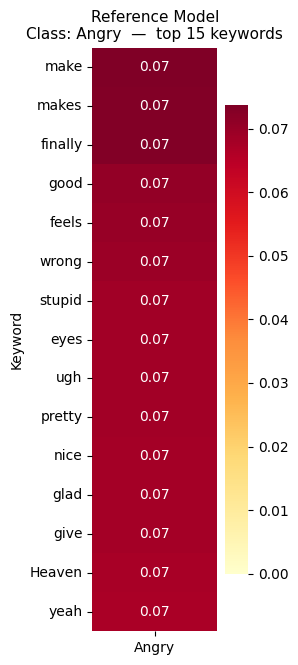

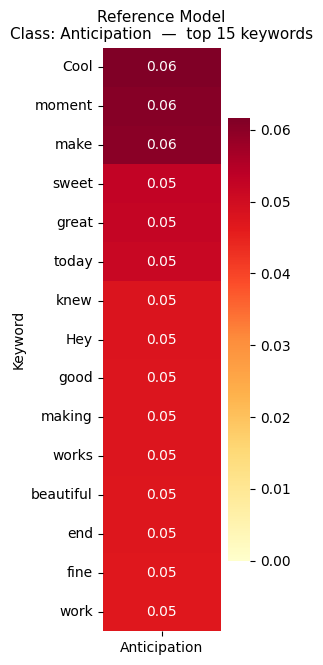

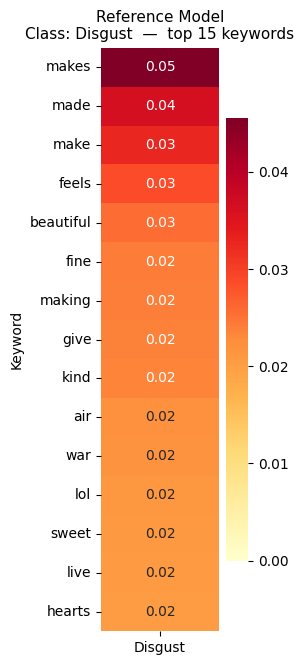

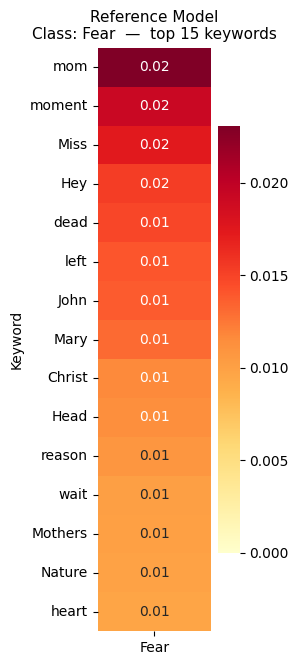

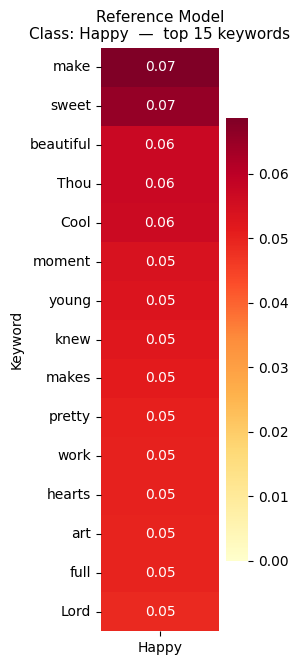

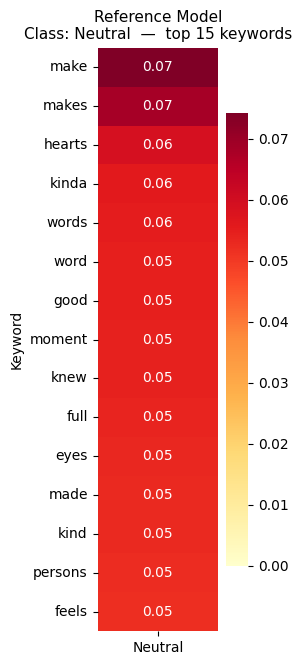

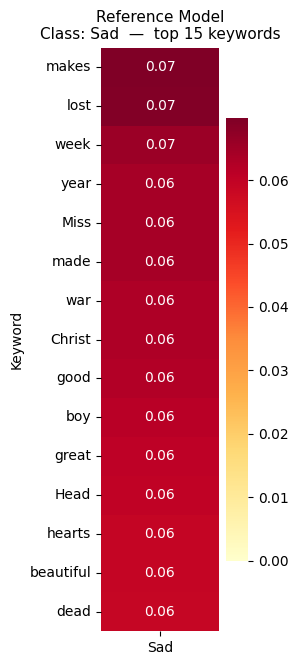

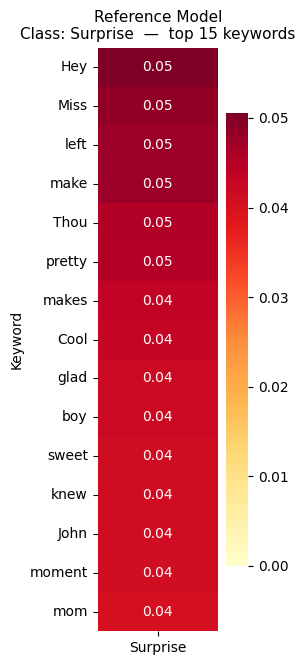

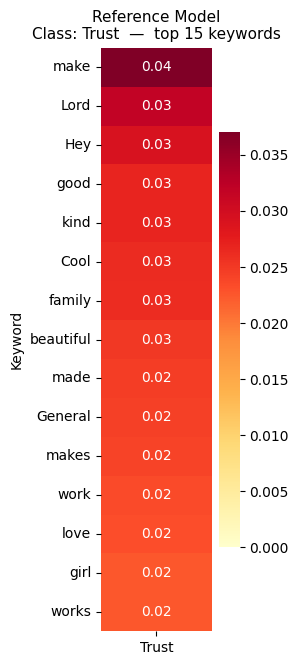

In [26]:
# Step 4 - Visualize BEE Results
visualize_bee_results(bee_results, ID2LABEL, title_prefix="Reference Model")

In [27]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
print(bee_results)

       Keyword  Bias_Score     Angry  Anticipation   Disgust      Fear  \
0         make    0.074214  0.073670      0.060167  0.032620  0.000000   
1        makes    0.073180  0.073180      0.045149  0.045503  0.000000   
2      finally    0.073135  0.073135      0.035840  0.018679  0.000000   
3         good    0.070638  0.070638      0.047546  0.018965  0.000000   
4        feels    0.070092  0.070092      0.043637  0.028782  0.000000   
5        wrong    0.069353  0.069353      0.032424  0.002905  0.006117   
6         lost    0.069235  0.065045      0.039938  0.014312  0.000000   
7       stupid    0.068713  0.068713      0.030625  0.016895  0.000000   
8         eyes    0.068456  0.068456      0.041379  0.018905  0.006770   
9          ugh    0.068362  0.068362      0.020234  0.015571  0.003376   
10      pretty    0.068218  0.068218      0.043564  0.019763  0.000000   
11        nice    0.068060  0.068060      0.043273  0.008943  0.000000   
12        glad    0.067968  0.067968  

In [28]:
# Show Top Keywords per Emotion
for label in LABEL_NAMES:
    print(f"\n=== Top Keywords for: {label} ===")

    top_for_label = bee_results.sort_values(by=label, ascending=False)

    print(top_for_label[['Keyword', label]].to_string(index=False))


=== Top Keywords for: Angry ===
  Keyword    Angry
     make 0.073670
    makes 0.073180
  finally 0.073135
     good 0.070638
    feels 0.070092
    wrong 0.069353
   stupid 0.068713
     eyes 0.068456
      ugh 0.068362
   pretty 0.068218
     nice 0.068060
     glad 0.067968
     give 0.067931
   Heaven 0.067489
     yeah 0.067229
    smile 0.067063
     hand 0.066707
    cried 0.066529
     hard 0.066238
      war 0.065765
beautiful 0.065475
   making 0.065364
     knew 0.065191
      n’t 0.065154
     dead 0.065071
     lost 0.065045
     made 0.065031
    sweet 0.064962
    funny 0.064941
      boy 0.064830
     holy 0.064587
     John 0.064391
  amazing 0.064381
      fun 0.064302
     dont 0.064231
      bad 0.064219
    party 0.063798
      air 0.063429
     till 0.063325
   looked 0.063192
  persons 0.063150
      Joy 0.063148
 thinking 0.063092
     high 0.062915
   hearts 0.062876
   sister 0.062555
     Miss 0.062382
      lol 0.062266
     kind 0.062248
  totally 0.06218

Now the finetuned model (target model)

In [29]:
import zipfile
import os

target_zip = "Target_Victim_Model.zip"
target_folder = "./restored_target_model"

def unzip_model(zip_path, extract_to):
    if not os.path.exists(zip_path):
        return False
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)
    return True

if not unzip_model(target_zip, target_folder):
    raise FileNotFoundError("Target model zip not found.")

!pip install -q yake nltk

In [30]:
import torch
import pandas as pd
import numpy as np
import yake
import nltk
from tqdm import tqdm
from nltk.corpus import stopwords
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from torch.utils.data import DataLoader
from datasets import Dataset
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns

nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [31]:
tokenizer = AutoTokenizer.from_pretrained(target_folder)
model = AutoModelForSequenceClassification.from_pretrained(target_folder)
model.to("cuda")
model.eval()

Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification(
  (gpt_neox): GPTNeoXModel(
    (embed_in): Embedding(50304, 128)
    (emb_dropout): Dropout(p=0.0, inplace=False)
    (layers): ModuleList(
      (0-5): 6 x GPTNeoXLayer(
        (input_layernorm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (post_attention_layernorm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (post_attention_dropout): Dropout(p=0.0, inplace=False)
        (post_mlp_dropout): Dropout(p=0.0, inplace=False)
        (attention): GPTNeoXAttention(
          (query_key_value): Linear(in_features=128, out_features=384, bias=True)
          (dense): Linear(in_features=128, out_features=128, bias=True)
        )
        (mlp): GPTNeoXMLP(
          (dense_h_to_4h): Linear(in_features=128, out_features=512, bias=True)
          (dense_4h_to_h): Linear(in_features=512, out_features=128, bias=True)
          (act): GELUActivation()
        )
      )
    )
    (final_layer_norm): LayerNorm((128,), eps=1e-05, 

In [32]:
ID2LABEL = {
    0: "Angry", 1: "Anticipation", 2: "Disgust", 3: "Fear",
    4: "Happy", 5: "Neutral", 6: "Sad", 7: "Surprise", 8: "Trust"
}
LABEL_NAMES = list(ID2LABEL.values())

def normalize_embeddings(embeddings):
    return embeddings / np.maximum(np.linalg.norm(embeddings, axis=1, keepdims=True), 1e-8)

def extract_keywords_from_text(texts, top=50):
    text_combined = " ".join([str(t) for t in texts])

    kw_extractor = yake.KeywordExtractor(
        lan="en",
        n=1,
        dedupLim=0.9,
        top=top,
        features=None
    )
    keywords = kw_extractor.extract_keywords(text_combined)
    return [k[0] for k in keywords]

In [33]:
if not os.path.exists("/content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv"):
    raise FileNotFoundError("all_4_datasets.csv not found.")

df = pd.read_csv("/content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv")
df = df.dropna(subset=['text', 'label'])
df['text'] = df['text'].astype(str)

le = LabelEncoder()
df['label_id'] = le.fit_transform(df['label'])

dataset = Dataset.from_pandas(df[['text', 'label_id']].rename(columns={'label_id': 'labels'}))
# No train/test split — use all data

def tokenize_function(examples):
    return tokenizer(examples["text"], padding="max_length", truncation=True, max_length=128)

tokenized_datasets = dataset.map(tokenize_function, batched=True)
tokenized_datasets.set_format(type='torch', columns=['input_ids', 'attention_mask', 'labels'])

Map:   0%|          | 0/427290 [00:00<?, ? examples/s]

In [34]:
def get_embeddings(model, tokenizer, dataset, batch_size=32):
    dataloader = DataLoader(dataset, batch_size=batch_size)
    embeddings = []
    labels = []

    with torch.no_grad():
        for batch in tqdm(dataloader):
            input_ids = batch['input_ids'].to("cuda")
            attention_mask = batch['attention_mask'].to("cuda")
            batch_labels = batch['labels'].numpy()

            outputs = model(input_ids=input_ids, attention_mask=attention_mask, output_hidden_states=True)
            last_hidden_state = outputs.hidden_states[-1]

            seq_lengths = attention_mask.sum(dim=1) - 1
            batch_indices = torch.arange(last_hidden_state.size(0)).to("cuda")
            batch_embeddings = last_hidden_state[batch_indices, seq_lengths]

            embeddings.append(batch_embeddings.cpu().numpy())
            labels.append(batch_labels)

    return np.concatenate(embeddings), np.concatenate(labels)

print("Embedding extraction skipped — embeddings are not used in BEE score computation.")

Embedding extraction skipped — embeddings are not used in BEE score computation.


In [35]:
classifier_weights = model.score.weight.detach().cpu().numpy()
classifier_weights_norm = normalize_embeddings(classifier_weights)

In [36]:
import torch
import numpy as np
from transformers import AutoTokenizer

# 1. Identify and Reload the Tokenizer from the source
model_name = model.config._name_or_path
print(f"Reloading fresh tokenizer for: {model_name}")

tokenizer = AutoTokenizer.from_pretrained(model_name, use_fast=False)

# 2. Hard-reset the configuration
tokenizer.pad_token = tokenizer.eos_token
# tokenizer.padding_side = "left"
tokenizer.model_max_length = 2048

# 3. VERIFICATION TEST
test_ids = tokenizer.encode("feel")
print(f"Verification - Tokens for 'feel': {test_ids}")

if not test_ids:
    # If it still fails, we force a generic GPT-NeoX tokenizer as a last resort
    print("Standard load failed. Forcing Pythia-14m tokenizer as fallback...")
    tokenizer = AutoTokenizer.from_pretrained("EleutherAI/pythia-14m")
    tokenizer.pad_token = tokenizer.eos_token
    test_ids = tokenizer.encode("feel")
    print(f"Fallback Verification - Tokens for 'feel': {test_ids}")

all_texts = df['text'].tolist()
raw_keywords = extract_keywords_from_text(all_texts, top=200)

filter_words = set([w.lower() for w in LABEL_NAMES])
clean_keywords = [str(k).strip() for k in raw_keywords if str(k).lower() not in filter_words and len(str(k).strip()) > 0]

def embed_text_list(text_list, model, tokenizer, batch_size=64):
    model.eval()
    all_embeddings = []
    for i in range(0, len(text_list), batch_size):
        batch_texts = text_list[i : i + batch_size]
        inputs = tokenizer(batch_texts, padding=True, truncation=True, return_tensors="pt").to("cuda")

        if inputs.input_ids.shape[1] == 0:
            continue

        with torch.no_grad():
            outputs = model(**inputs, output_hidden_states=True)
            last_hidden = outputs.hidden_states[-1]
            mask = inputs.attention_mask
            seq_lens = (mask.sum(dim=1) - 1).clamp(min=0)
            embeddings = last_hidden[torch.arange(last_hidden.size(0)), seq_lens]
            all_embeddings.append(embeddings.cpu().numpy())

    return np.vstack(all_embeddings)

keyword_embeddings = embed_text_list(clean_keywords, model, tokenizer, batch_size=64)
keyword_embeddings_norm = normalize_embeddings(keyword_embeddings)
print(f"Success! Final shape: {keyword_embeddings_norm.shape}")

Reloading fresh tokenizer for: ./restored_target_model
Verification - Tokens for 'feel': [39336]
Success! Final shape: (197, 128)


In [37]:
bee_results, sorted_sc, raw_sims = compute_bee_scores(
    classifier_weights_norm, keyword_embeddings_norm, clean_keywords, ID2LABEL
)

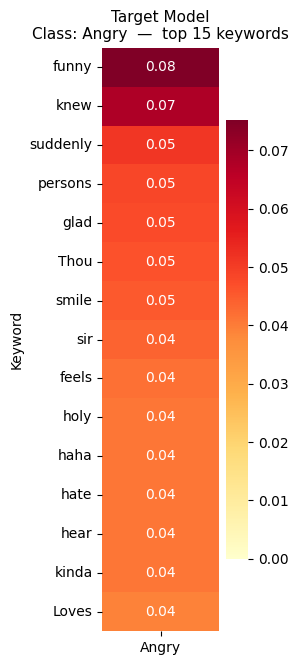

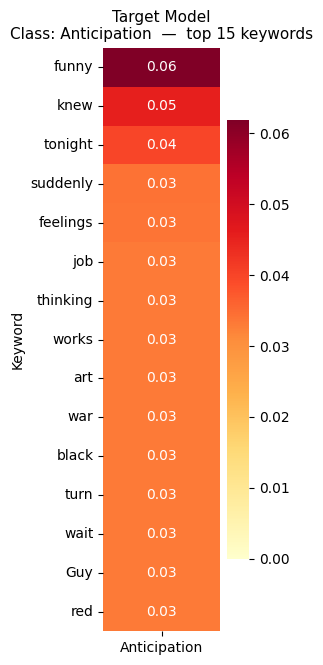

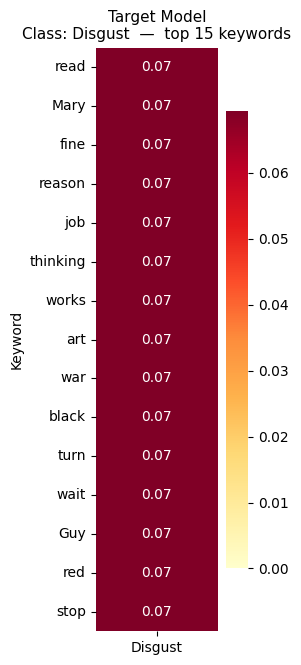

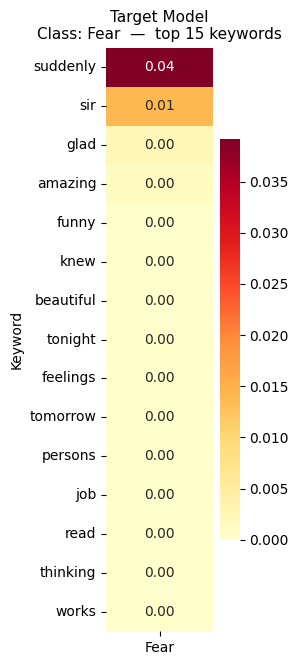

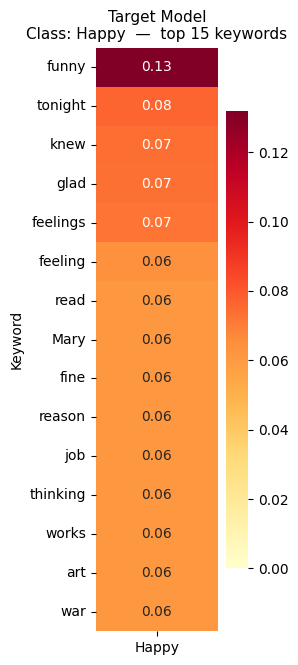

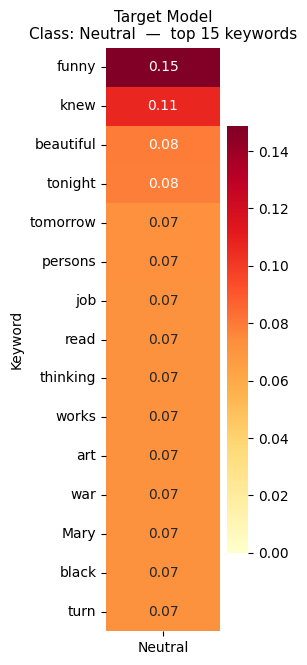

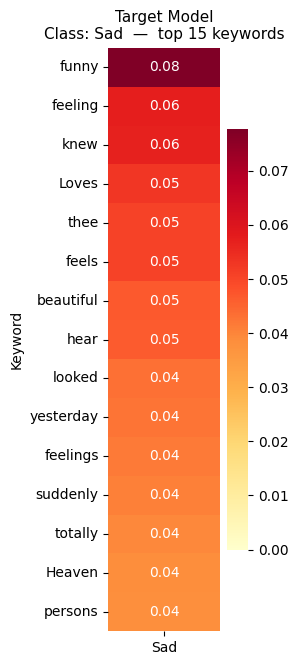

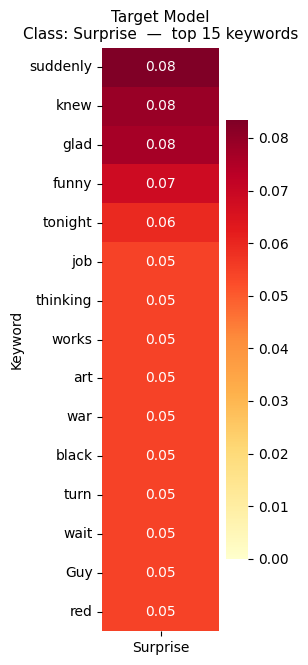

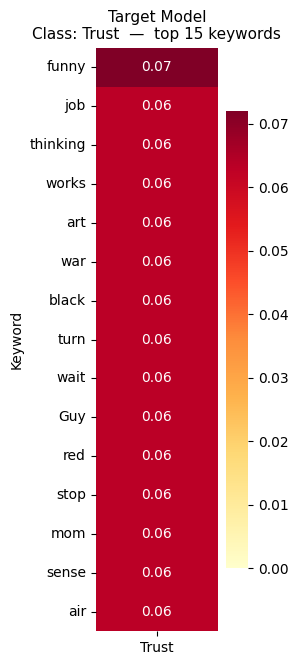

In [38]:
visualize_bee_results(bee_results, ID2LABEL, title_prefix="Target Model")

In [39]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

for label in LABEL_NAMES:
    print(f"\n=== Top Keywords for: {label} (Target Model) ===")
    top_for_label = bee_results.sort_values(by=label, ascending=False)
    print(top_for_label[['Keyword', label]].to_string(index=False))


=== Top Keywords for: Angry (Target Model) ===
  Keyword    Angry
    funny 0.075166
     knew 0.067835
 suddenly 0.051217
  persons 0.048297
     glad 0.047773
     Thou 0.046662
    smile 0.045503
      sir 0.043898
    feels 0.041722
     hate 0.041071
     holy 0.041071
     haha 0.041071
     hear 0.040939
    kinda 0.040814
    Loves 0.039319
  tonight 0.037168
   stupid 0.036896
     yeah 0.036097
  feeling 0.035720
     dont 0.035002
     dear 0.035002
 feelings 0.033368
yesterday 0.032340
 tomorrow 0.031908
      wow 0.031183
  finally 0.030996
beautiful 0.030618
 honestly 0.029586
   hearts 0.029547
   sister 0.029313
     soul 0.029313
     gave 0.029232
    loved 0.028831
  totally 0.028654
     gods 0.028636
   looked 0.028244
     till 0.026833
     read 0.026300
     Mary 0.026300
   reason 0.026300
     fine 0.026300
    wrong 0.026300
   family 0.026300
    white 0.026300
   London 0.026300
    works 0.026300
      art 0.026300
      war 0.026300
    black 0.026300
  

---
# N-1 and Single-Dataset BEE Diagnostic Analysis

Train 8 additional classifiers (4 leave-one-out + 4 individual datasets) and compute BEE scores for each. Then build a diagnostic matrix comparing individual dataset fingerprints to their leave-one-out contributions.

In [40]:
# ============================================================================
# CONFIGURATION: Dataset paths and model save paths
# ============================================================================
import gc

FULL_DATASET_PATH = "/content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv"

DATASET_CONFIGS = {
    # Leave-one-out (n-1) combinations
    "n-1_no_EmoLit":       "no_EmoLit.csv",
    "n-1_no_Emotion20":    "no_EmotionDataset20.csv",
    "n-1_no_GoEmotions":   "no_GoEmotions.csv",
    "n-1_no_XED_SMED":     "no_XED_SMED.csv",
    # Individual datasets
    "single_EmoLit":       "EmoLit_mapped.csv",
    "single_Emotion20":    "EmotionDataset20_mapped.csv",
    "single_GoEmotions":   "GoEmotions_mapped.csv",
    "single_XED_SMED":     "XED_and_SMED.csv",
}

MODEL_ID = "EleutherAI/pythia-14m"

# Dictionary to store all BEE results for diagnostic analysis
# Each entry: {"bee_df": DataFrame, "similarities": np.array, "keywords": list}
all_bee_results = {}

# Store the full-dataset (alpha_n) results from earlier analysis
# The bee_results DataFrame from Cell 42 (target model) is our alpha_n
# We need to also save the raw similarity matrix and keyword list
print("Configuration loaded. Ready to train 8 classifiers.")
print(f"\nDataset configs:")
for name, path in DATASET_CONFIGS.items():
    print(f"  {name}: {path}")

Configuration loaded. Ready to train 8 classifiers.

Dataset configs:
  n-1_no_EmoLit: no_EmoLit.csv
  n-1_no_Emotion20: no_EmotionDataset20.csv
  n-1_no_GoEmotions: no_GoEmotions.csv
  n-1_no_XED_SMED: no_XED_SMED.csv
  single_EmoLit: EmoLit_mapped.csv
  single_Emotion20: EmotionDataset20_mapped.csv
  single_GoEmotions: GoEmotions_mapped.csv
  single_XED_SMED: XED_and_SMED.csv


In [41]:
# ============================================================================
# Save alpha_n (full dataset BEE results) from the target model analysis above
# ============================================================================
# bee_results from Cell 42 is the target model BEE DataFrame
# We need the similarity matrix and keywords

# Reconstruct from bee_results (which was computed in Cells 40-42)
alpha_n_keywords = bee_results['Keyword'].tolist()
alpha_n_sims = bee_results[list(ID2LABEL.values())].values  # shape: (num_keywords, 9)

all_bee_results["alpha_n"] = {
    "bee_df": bee_results.copy(),
    "similarities": alpha_n_sims,
    "keywords": alpha_n_keywords,
}

print(f"Saved alpha_n: {len(alpha_n_keywords)} keywords, shape {alpha_n_sims.shape}")

Saved alpha_n: 197 keywords, shape (197, 9)


In [42]:
# ============================================================================
# REUSABLE PIPELINE: Train CLM + Classification Head + BEE
# ============================================================================
import torch.nn as nn
from transformers import (
    AutoTokenizer, AutoModelForCausalLM, AutoModelForSequenceClassification,
    TrainingArguments, Trainer, DataCollatorForLanguageModeling, DataCollatorWithPadding
)
from datasets import Dataset
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import accuracy_score, f1_score

class WeightedTrainer(Trainer):
    def __init__(self, *args, class_weights=None, **kwargs):
        super().__init__(*args, **kwargs)
        self.class_weights = class_weights

    def compute_loss(self, model, inputs, return_outputs=False, **kwargs):
        labels = inputs.pop("labels")
        outputs = model(**inputs)
        logits = outputs.get("logits")
        if self.class_weights is not None:
            loss_fct = nn.CrossEntropyLoss(weight=self.class_weights)
        else:
            loss_fct = nn.CrossEntropyLoss()
        loss = loss_fct(logits.view(-1, self.model.config.num_labels), labels.view(-1))
        return (loss, outputs) if return_outputs else loss


def full_bee_pipeline(config_name, dataset_path, model_id=MODEL_ID):
    """
    Full pipeline: Load data -> Train CLM -> Train Classifier -> Compute BEE.
    Returns bee_df, similarity_matrix, keyword_list.
    """
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # --- 1. Load data ---
    print(f"\n{'='*80}")
    print(f"PIPELINE: {config_name}")
    print(f"{'='*80}")

    df = pd.read_csv(dataset_path)
    df = df.dropna(subset=['text', 'label'])
    df['text'] = df['text'].astype(str)
    print(f"Loaded {len(df):,} samples from {dataset_path}")
    print(f"Label distribution:\n{df['label'].value_counts()}")

    # Encode labels
    le = LabelEncoder()
    df['label_id'] = le.fit_transform(df['label'])
    id2label = {idx: label for idx, label in enumerate(le.classes_)}
    label2id = {v: k for k, v in id2label.items()}
    num_labels = len(id2label)

    # --- 2. Train CLM (Causal Language Model) ---
    print(f"\n--- Training CLM for {config_name} ---")
    tokenizer = AutoTokenizer.from_pretrained(model_id)
    tokenizer.pad_token = tokenizer.eos_token

    clm_model = AutoModelForCausalLM.from_pretrained(model_id, torch_dtype=torch.float32)
    clm_model.to(device)

    # Tokenize for CLM (text only, no labels)
    clm_dataset = Dataset.from_pandas(df[['text']])

    def tokenize_clm(examples):
        return tokenizer(examples['text'], truncation=True, max_length=128)

    tok_clm = clm_dataset.map(tokenize_clm, batched=True, remove_columns=['text'])
    # No eval split — train on all data for maximum BEE signal

    clm_collator = DataCollatorForLanguageModeling(tokenizer=tokenizer, mlm=False)

    clm_save_path = f"./clm_{config_name}"
    clm_args = TrainingArguments(
        output_dir=clm_save_path,
        num_train_epochs=3,
        per_device_train_batch_size=32,
        learning_rate=2e-5,
        seed=SEED,
        data_seed=SEED,
        weight_decay=0.01,

        logging_steps=100,
        report_to="none",
        save_strategy="no",
    )

    clm_trainer = Trainer(
        model=clm_model,
        args=clm_args,
        train_dataset=tok_clm,
        data_collator=clm_collator,
    )
    clm_trainer.train()
    clm_trainer.save_model(clm_save_path)
    tokenizer.save_pretrained(clm_save_path)

    # Free CLM model memory
    del clm_model, clm_trainer
    gc.collect()
    torch.cuda.empty_cache()

    # --- 3. Train Classification Head ---
    print(f"\n--- Training Classification Head for {config_name} ---")

    # Class weights for imbalanced data
    class_weights = compute_class_weight(
        class_weight='balanced',
        classes=np.unique(df['label']),
        y=df['label']
    )
    class_weights_tensor = torch.FloatTensor(class_weights).to(device)

    clf_model = AutoModelForSequenceClassification.from_pretrained(
        clm_save_path,
        num_labels=num_labels,
        id2label=id2label,
        label2id=label2id,
        torch_dtype=torch.float32,
        ignore_mismatched_sizes=True,
    )
    clf_model.config.pad_token_id = tokenizer.pad_token_id
    clf_model.to(device)

    # Tokenize for classification (with labels)
    clf_dataset = Dataset.from_pandas(
        df[['text', 'label_id']].rename(columns={'label_id': 'labels'})
    )

    def tokenize_clf(examples):
        return tokenizer(examples['text'], truncation=True, max_length=128)

    tok_clf = clf_dataset.map(tokenize_clf, batched=True)
    tok_clf.set_format(type='torch', columns=['input_ids', 'attention_mask', 'labels'])
    # No eval split — train on all data

    clf_collator = DataCollatorWithPadding(tokenizer=tokenizer)

    def compute_metrics(eval_pred):
        logits, labels = eval_pred
        preds = np.argmax(logits, axis=-1)
        return {
            "accuracy": accuracy_score(labels, preds),
            "f1": f1_score(labels, preds, average="weighted"),
        }

    clf_save_path = f"./clf_{config_name}"
    clf_args = TrainingArguments(
        output_dir=clf_save_path,
        num_train_epochs=3,
        per_device_train_batch_size=32,
        learning_rate=2e-5,
        logging_steps=100,
        report_to="none",
        seed=SEED,
        data_seed=SEED,
        save_strategy="no",
    )

    clf_trainer = WeightedTrainer(
        model=clf_model,
        args=clf_args,
        train_dataset=tok_clf,
        data_collator=clf_collator,
        class_weights=class_weights_tensor,
    )
    clf_trainer.train()
    clf_trainer.save_model(clf_save_path)
    tokenizer.save_pretrained(clf_save_path)

    # --- 4. BEE Analysis ---
    print(f"\n--- BEE Analysis for {config_name} ---")

    # Extract classifier weights
    classifier_weights = clf_model.score.weight.detach().cpu().numpy()
    classifier_weights_norm = normalize_embeddings(classifier_weights)

    # Extract keywords from THIS dataset's texts
    all_texts = df['text'].tolist()
    raw_keywords = extract_keywords_from_text(all_texts, top=200)
    filter_words = set([w.lower() for w in LABEL_NAMES])
    clean_keywords = [str(k).strip() for k in raw_keywords
                      if str(k).lower() not in filter_words and len(str(k).strip()) > 0]

    # Embed keywords using the classifier model
    clf_model.eval()
    keyword_embeddings = embed_text_list(clean_keywords, clf_model, tokenizer)
    keyword_embeddings_norm = normalize_embeddings(keyword_embeddings)

    # Compute BEE scores
    bee_df, sorted_sc, raw_sims = compute_bee_scores(
        classifier_weights_norm, keyword_embeddings_norm, clean_keywords, id2label
    )

    # Store results
    result = {
        "bee_df": bee_df,
        "similarities": sorted_sc,
        "keywords": bee_df['Keyword'].tolist(),
    }

    # Visualize
    visualize_bee_results(bee_df, id2label, title_prefix=config_name, top_k=15)

    # Free memory
    del clf_model, clf_trainer
    gc.collect()
    torch.cuda.empty_cache()

    print(f"\nDone: {config_name} — {len(clean_keywords)} keywords, BEE shape {sorted_sc.T.shape}")
    return result

print("Pipeline function defined.")

Pipeline function defined.


In [43]:
# Override embed_text_list with batched version for large keyword sets
def embed_text_list(text_list, model, tokenizer, batch_size=64):
    model.eval()
    all_embeddings = []
    for i in range(0, len(text_list), batch_size):
        batch_texts = text_list[i : i + batch_size]
        inputs = tokenizer(batch_texts, padding=True, truncation=True, return_tensors="pt")
        inputs = {k: v.to(model.device) for k, v in inputs.items()}

        if inputs['input_ids'].shape[1] == 0:
            continue

        with torch.no_grad():
            outputs = model(**inputs, output_hidden_states=True)
            last_hidden = outputs.hidden_states[-1]
            mask = inputs['attention_mask']
            seq_lens = (mask.sum(dim=1) - 1).clamp(min=0)
            embeddings = last_hidden[torch.arange(last_hidden.size(0), device=last_hidden.device), seq_lens]
            all_embeddings.append(embeddings.cpu().numpy())

    return np.vstack(all_embeddings)

print("Batched embed_text_list defined.")

Batched embed_text_list defined.


---
## N-1: All except EmoLit


PIPELINE: n-1_no_EmoLit
Loaded 226,563 samples from /content/drive/MyDrive/UPDATED_DATASETS/no_EmoLit.csv
Label distribution:
label
Happy           58894
Neutral         42908
Sad             40372
Angry           28859
Trust           14525
Anticipation    14358
Surprise        11687
Disgust          8804
Fear             6156
Name: count, dtype: int64

--- Training CLM for n-1_no_EmoLit ---


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Map:   0%|          | 0/226563 [00:00<?, ? examples/s]

Step,Training Loss
100,5.072596
200,4.966498
300,4.877922
400,4.771281
500,4.750728
600,4.746053
700,4.703802
800,4.685875
900,4.607553
1000,4.624457


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- Training Classification Head for n-1_no_EmoLit ---


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./clm_n-1_no_EmoLit
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/226563 [00:00<?, ? examples/s]

Step,Training Loss
100,4.008040
200,2.033796
300,1.760891
400,1.592286
500,1.554863
600,1.465027
700,1.406443
800,1.380961
900,1.332928
1000,1.275160


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- BEE Analysis for n-1_no_EmoLit ---


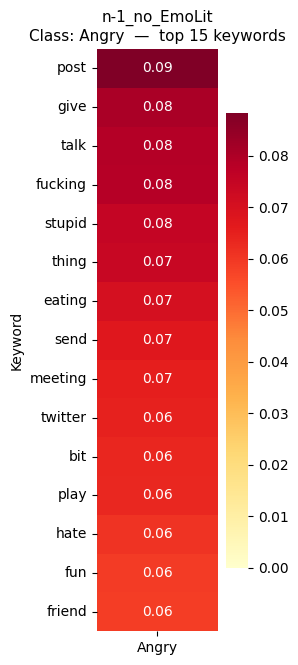

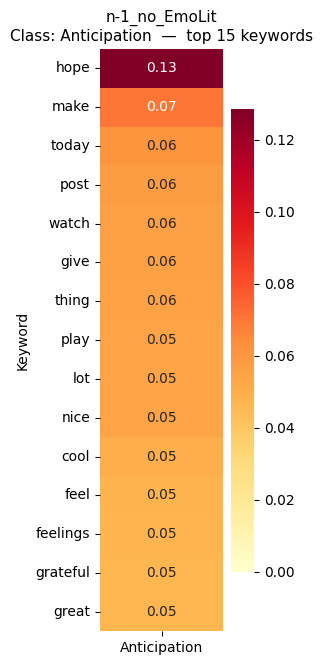

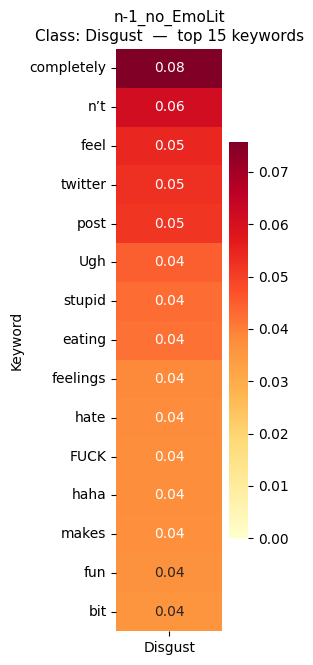

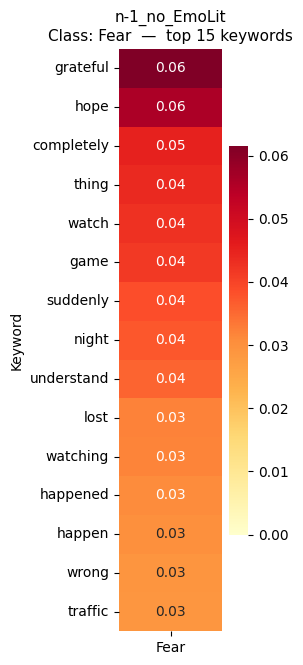

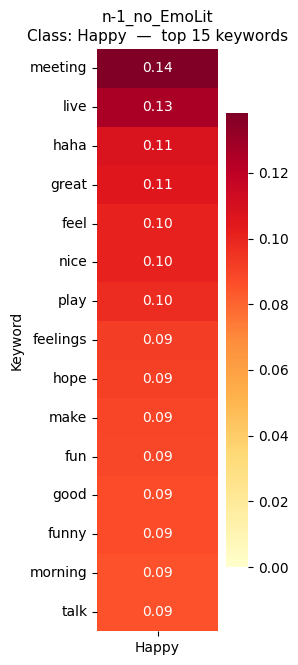

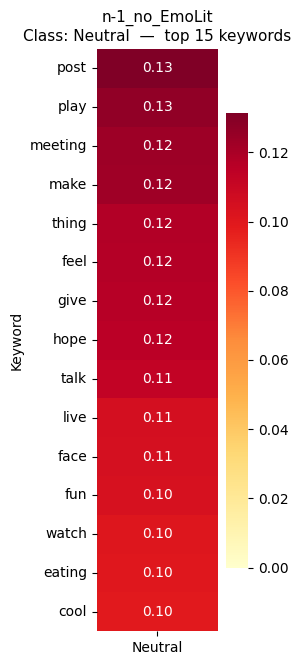

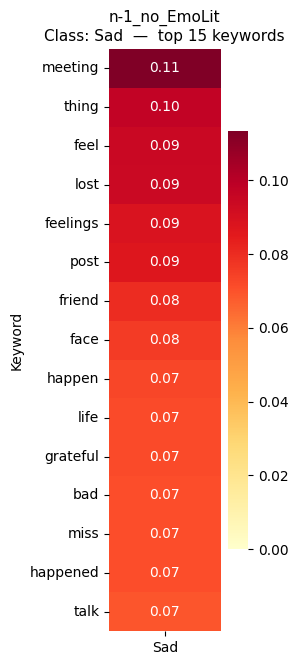

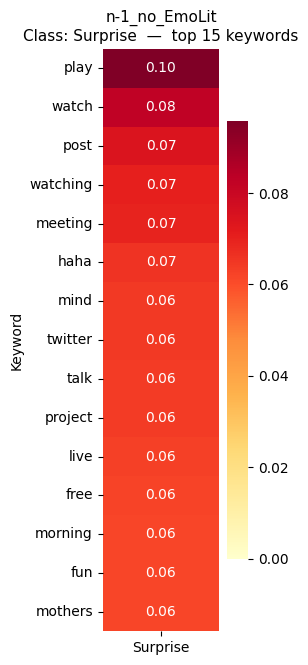

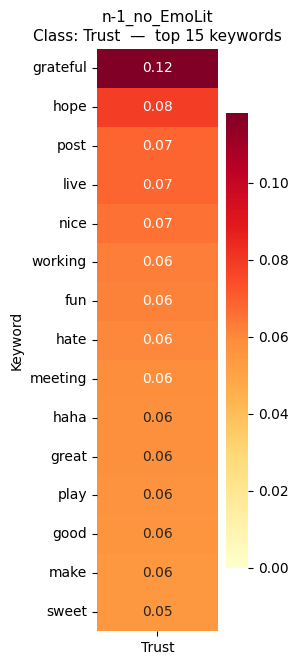


Done: n-1_no_EmoLit — 196 keywords, BEE shape (196, 9)


In [44]:
all_bee_results["n-1_no_EmoLit"] = full_bee_pipeline(
    "n-1_no_EmoLit",
    "/content/drive/MyDrive/UPDATED_DATASETS/no_EmoLit.csv"
    # DATASET_CONFIGS["n-1_no_EmoLit"],
)

---
## N-1: All except EmotionDataset20


PIPELINE: n-1_no_Emotion20
Loaded 347,695 samples from /content/drive/MyDrive/UPDATED_DATASETS/no_EmotionDataset20.csv
Label distribution:
label
Happy           79327
Sad             60987
Neutral         59520
Angry           35532
Anticipation    34811
Trust           34284
Fear            15803
Surprise        13782
Disgust         13649
Name: count, dtype: int64

--- Training CLM for n-1_no_Emotion20 ---


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Map:   0%|          | 0/347695 [00:00<?, ? examples/s]

Step,Training Loss
100,5.207376
200,5.131116
300,5.065918
400,5.035776
500,5.009565
600,4.996906
700,4.978339
800,4.930303
900,4.938263
1000,4.959960


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- Training Classification Head for n-1_no_Emotion20 ---


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./clm_n-1_no_Emotion20
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/347695 [00:00<?, ? examples/s]

Step,Training Loss
100,3.860491
200,2.117558
300,2.045516
400,1.961309
500,1.845385
600,1.743012
700,1.712389
800,1.689593
900,1.676256
1000,1.590640


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- BEE Analysis for n-1_no_Emotion20 ---


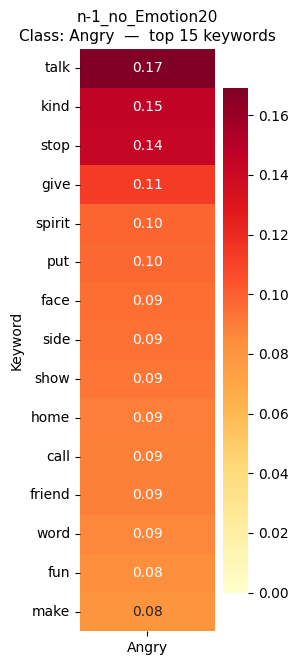

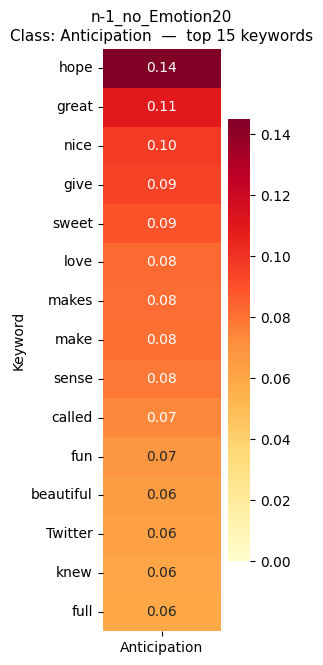

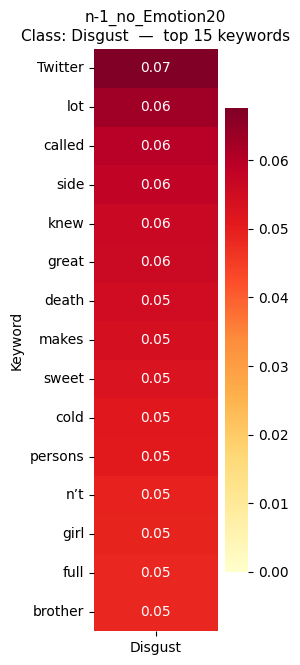

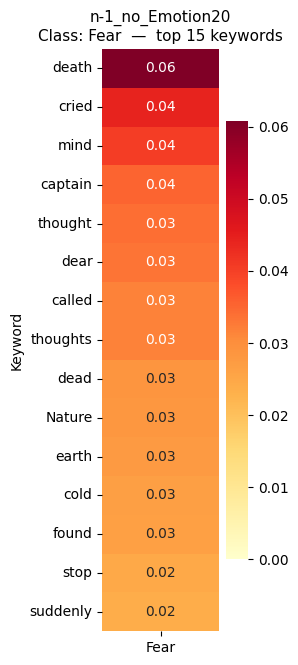

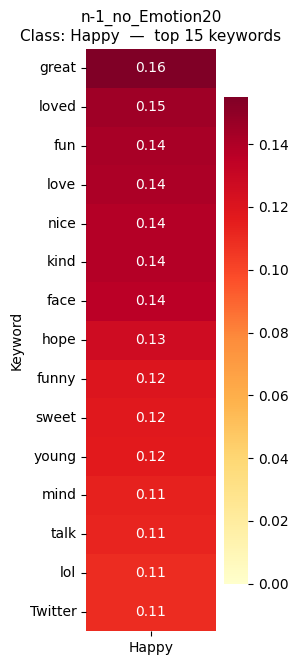

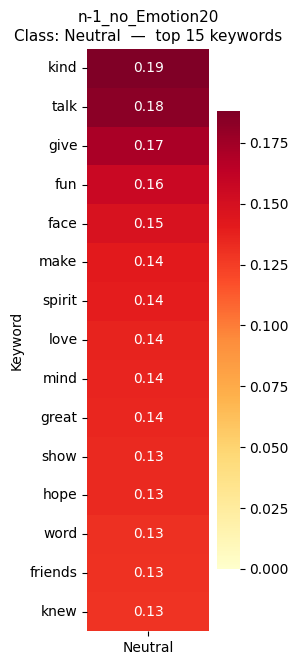

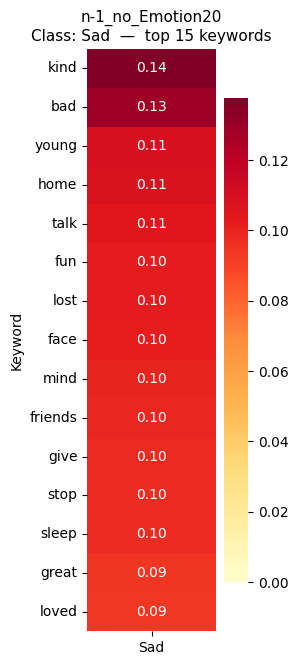

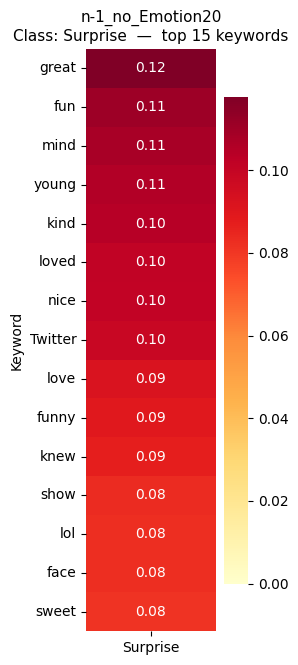

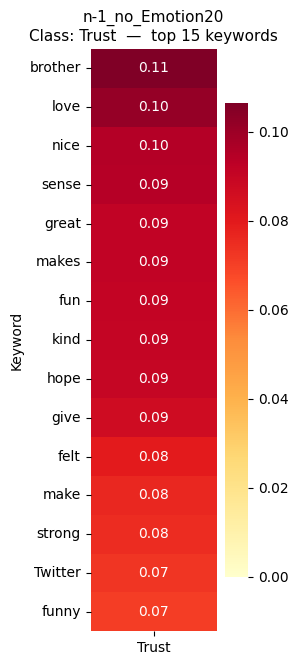


Done: n-1_no_Emotion20 — 197 keywords, BEE shape (197, 9)


In [45]:
all_bee_results["n-1_no_Emotion20"] = full_bee_pipeline(
    "n-1_no_Emotion20",
    "/content/drive/MyDrive/UPDATED_DATASETS/no_EmotionDataset20.csv"
)

---
## N-1: All except GoEmotions


PIPELINE: n-1_no_GoEmotions
Loaded 373,300 samples from /content/drive/MyDrive/UPDATED_DATASETS/no_GoEmotions.csv
Label distribution:
label
Happy           83873
Sad             76654
Neutral         46978
Angry           42170
Anticipation    38251
Trust           37183
Fear            18592
Disgust         15115
Surprise        14484
Name: count, dtype: int64

--- Training CLM for n-1_no_GoEmotions ---


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Map:   0%|          | 0/373300 [00:00<?, ? examples/s]

Step,Training Loss
100,5.156141
200,5.071005
300,5.013816
400,4.949455
500,4.906301
600,4.914519
700,4.896815
800,4.849088
900,4.851528
1000,4.850621


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- Training Classification Head for n-1_no_GoEmotions ---


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./clm_n-1_no_GoEmotions
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/373300 [00:00<?, ? examples/s]

Step,Training Loss
100,3.920502
200,2.097003
300,1.945269
400,1.789754
500,1.622886
600,1.611926
700,1.502697
800,1.487581
900,1.460697
1000,1.454383


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- BEE Analysis for n-1_no_GoEmotions ---


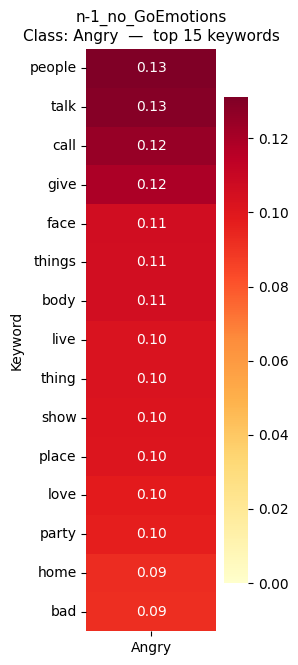

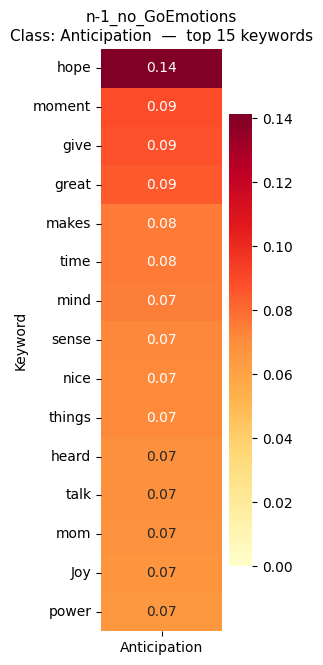

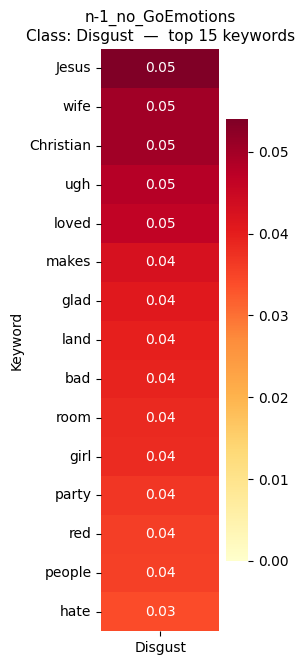

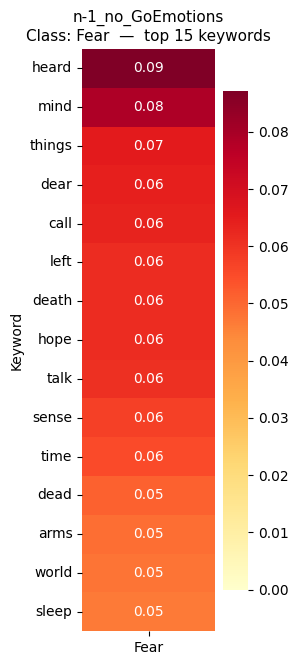

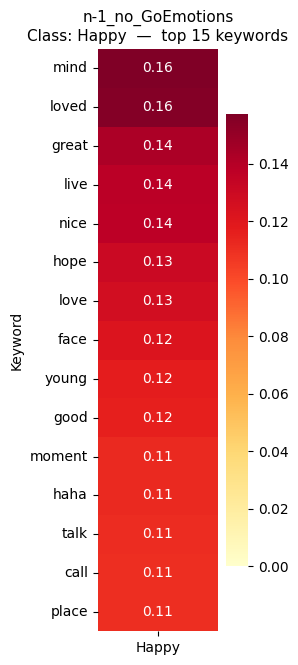

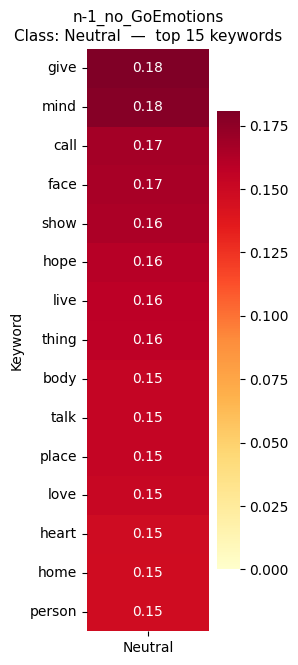

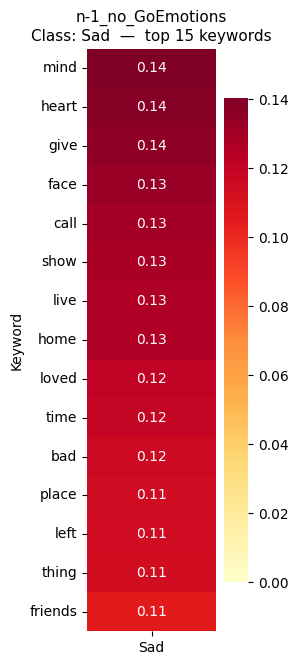

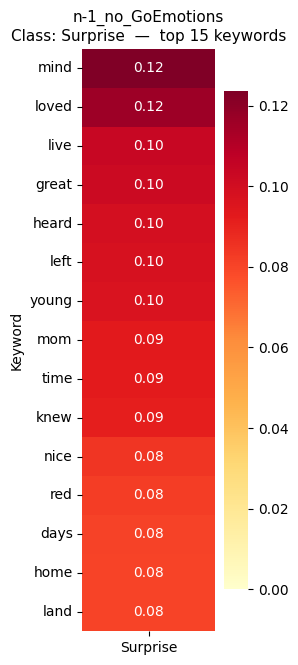

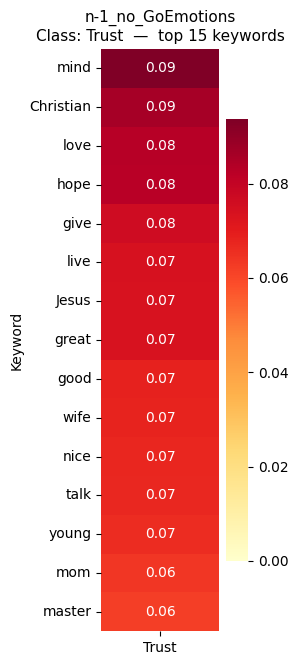


Done: n-1_no_GoEmotions — 197 keywords, BEE shape (197, 9)


In [46]:
all_bee_results["n-1_no_GoEmotions"] = full_bee_pipeline(
    "n-1_no_GoEmotions",
   "/content/drive/MyDrive/UPDATED_DATASETS/no_GoEmotions.csv",
)

---
## N-1: All except XED & SMED


PIPELINE: n-1_no_XED_SMED
Loaded 334,315 samples from /content/drive/MyDrive/UPDATED_DATASETS/no_XED_SMED.csv
Label distribution:
label
Happy           73415
Sad             61621
Anticipation    39651
Neutral         39441
Trust           38968
Angry           33735
Fear            17581
Disgust         16324
Surprise        13579
Name: count, dtype: int64

--- Training CLM for n-1_no_XED_SMED ---


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Map:   0%|          | 0/334315 [00:00<?, ? examples/s]

Step,Training Loss
100,5.010112
200,4.971649
300,4.902636
400,4.880037
500,4.855995
600,4.816286
700,4.844676
800,4.769007
900,4.786617
1000,4.769207


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- Training Classification Head for n-1_no_XED_SMED ---


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./clm_n-1_no_XED_SMED
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/334315 [00:00<?, ? examples/s]

Step,Training Loss
100,3.865636
200,2.235616
300,2.115264
400,1.932527
500,1.830982
600,1.745759
700,1.659036
800,1.602663
900,1.569734
1000,1.521087


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- BEE Analysis for n-1_no_XED_SMED ---


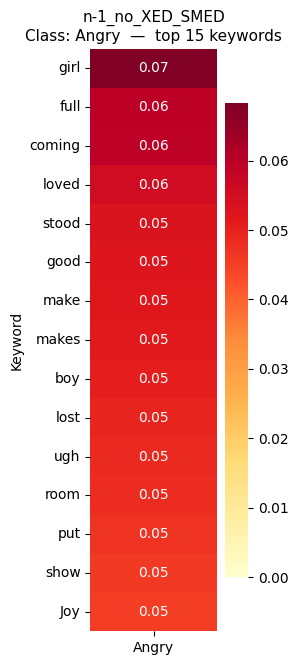

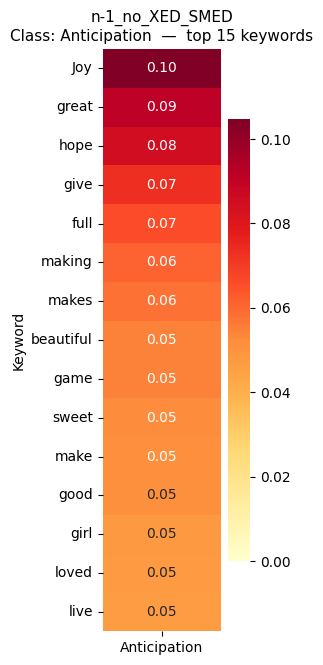

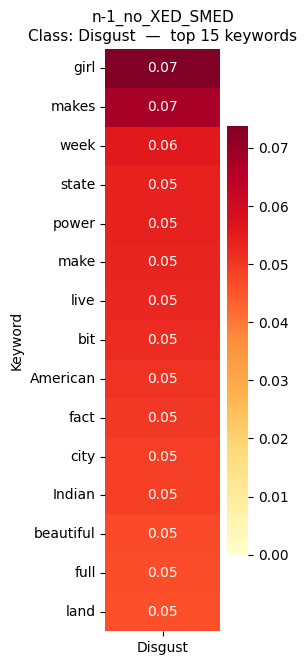

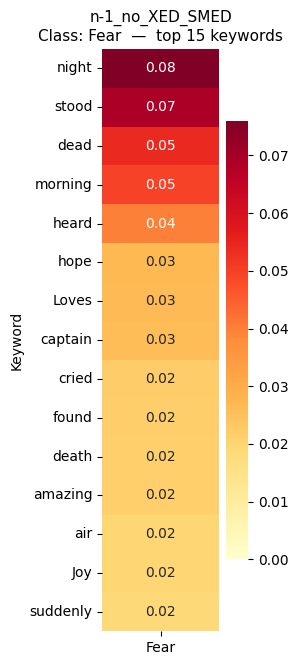

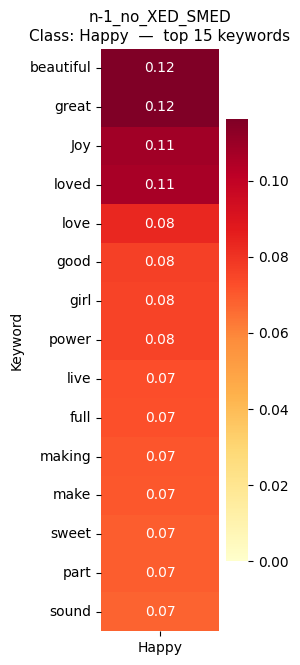

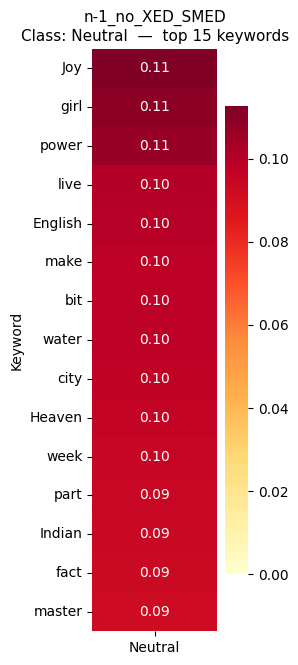

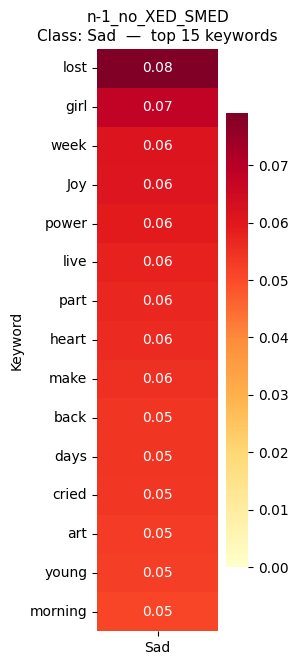

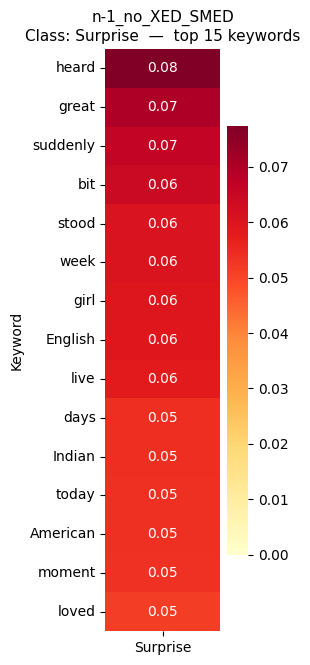

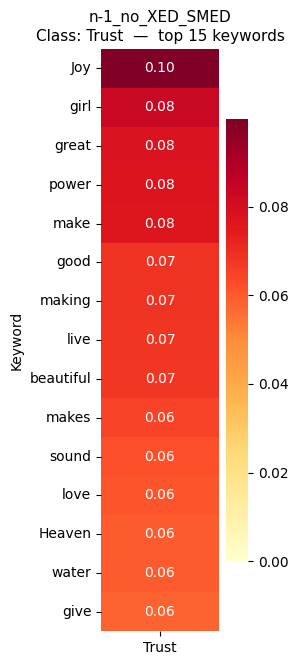


Done: n-1_no_XED_SMED — 197 keywords, BEE shape (197, 9)


In [47]:
all_bee_results["n-1_no_XED_SMED"] = full_bee_pipeline(
    "n-1_no_XED_SMED",
    "/content/drive/MyDrive/UPDATED_DATASETS/no_XED_SMED.csv",
)

---
## Single Dataset: EmoLit


PIPELINE: single_EmoLit
Loaded 200,727 samples from /content/drive/MyDrive/UPDATED_DATASETS/EmoLit_mapped.csv
Label distribution:
label
Happy           39609
Sad             39506
Anticipation    27999
Trust           27128
Neutral         20041
Angry           17906
Fear            13221
Disgust          9160
Surprise         6157
Name: count, dtype: int64

--- Training CLM for single_EmoLit ---


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Map:   0%|          | 0/200727 [00:00<?, ? examples/s]

Step,Training Loss
100,5.032241
200,4.966131
300,4.921518
400,4.875799
500,4.861766
600,4.807300
700,4.840179
800,4.793986
900,4.788232
1000,4.810460


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- Training Classification Head for single_EmoLit ---


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./clm_single_EmoLit
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/200727 [00:00<?, ? examples/s]

Step,Training Loss
100,3.738813
200,2.183569
300,2.059772
400,1.908370
500,1.738190
600,1.678882
700,1.577094
800,1.632160
900,1.608000
1000,1.561161


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- BEE Analysis for single_EmoLit ---


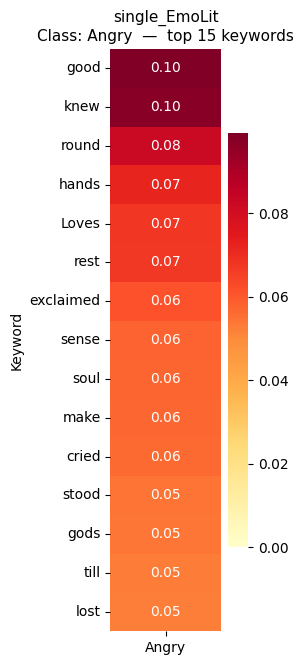

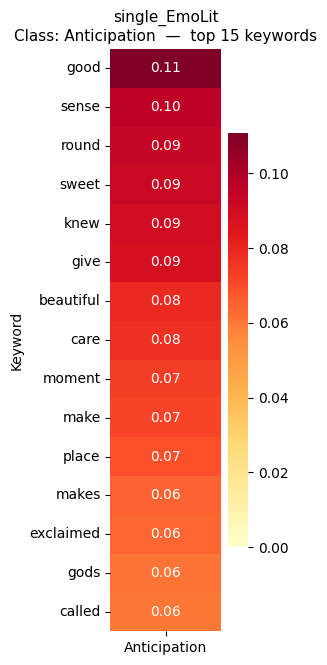

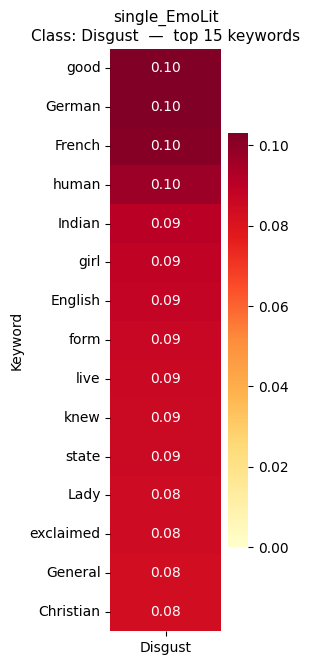

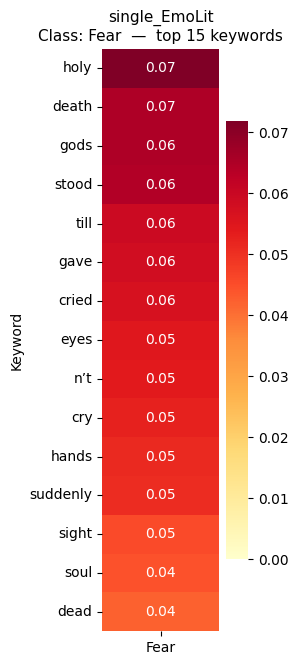

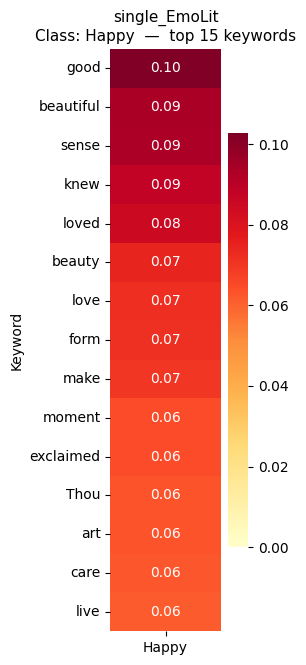

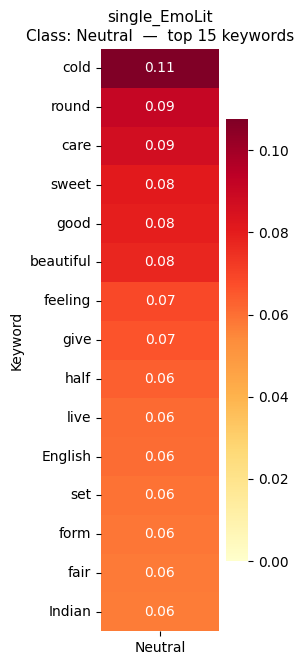

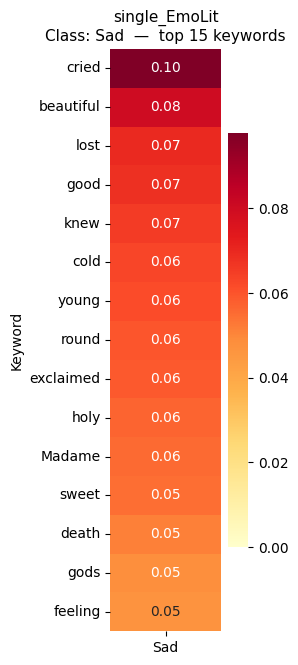

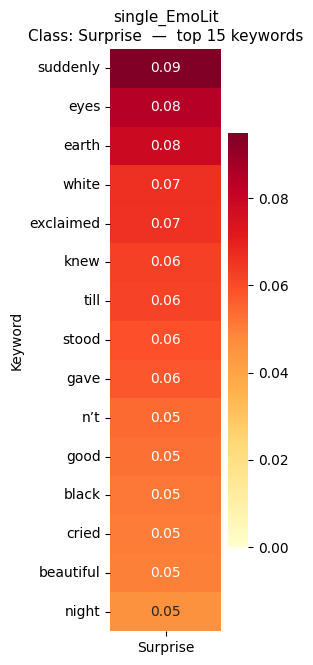

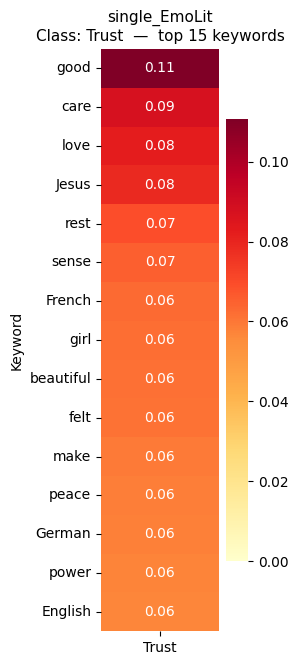


Done: single_EmoLit — 198 keywords, BEE shape (198, 9)


In [48]:
all_bee_results["single_EmoLit"] = full_bee_pipeline(
    "single_EmoLit",
    "/content/drive/MyDrive/UPDATED_DATASETS/EmoLit_mapped.csv",
)

---
## Single Dataset: EmotionDataset20


PIPELINE: single_Emotion20
Loaded 79,595 samples from /content/drive/MyDrive/UPDATED_DATASETS/EmotionDataset20_mapped.csv
Label distribution:
label
Happy           19176
Sad             18891
Angry           11233
Anticipation     7546
Trust            7369
Disgust          4315
Surprise         4062
Fear             3574
Neutral          3429
Name: count, dtype: int64

--- Training CLM for single_Emotion20 ---


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Map:   0%|          | 0/79595 [00:00<?, ? examples/s]

Step,Training Loss
100,3.806613
200,3.422308
300,3.271103
400,3.117627
500,3.064198
600,3.046529
700,2.936100
800,2.907755
900,2.864877
1000,2.830577


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- Training Classification Head for single_Emotion20 ---


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./clm_single_Emotion20
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/79595 [00:00<?, ? examples/s]

Step,Training Loss
100,3.355022
200,1.240146
300,1.057028
400,0.856098
500,0.765157
600,0.692893
700,0.684170
800,0.603543
900,0.545667
1000,0.552045


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- BEE Analysis for single_Emotion20 ---


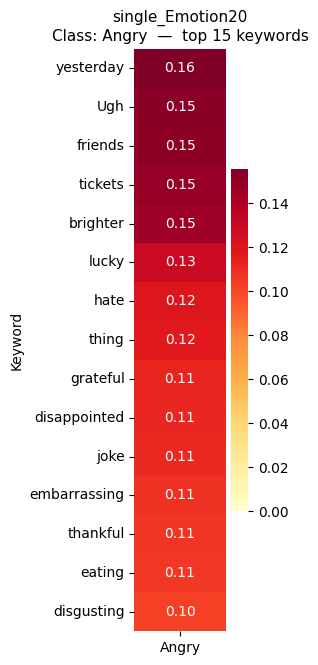

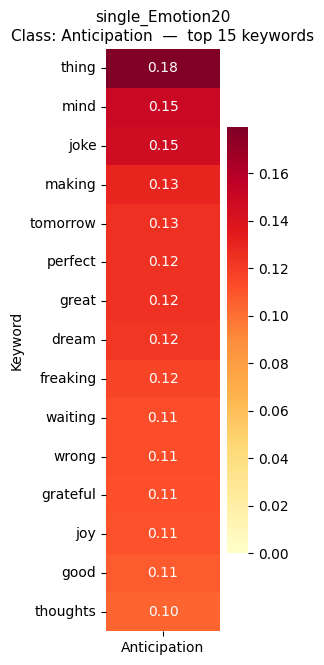

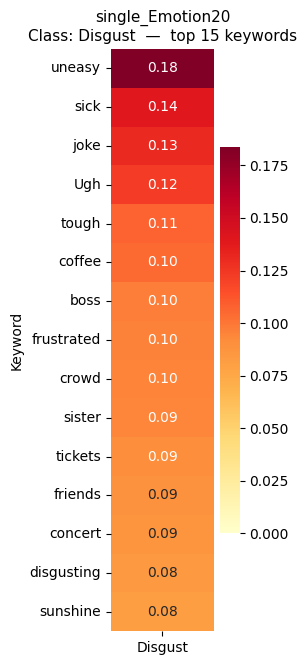

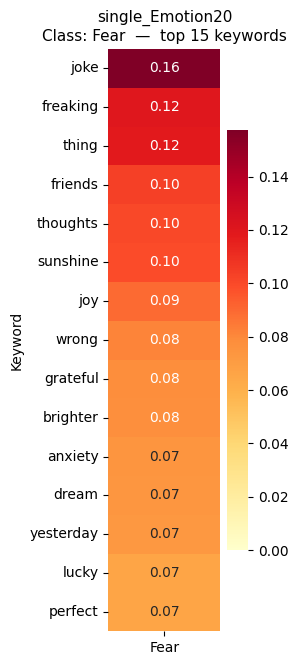

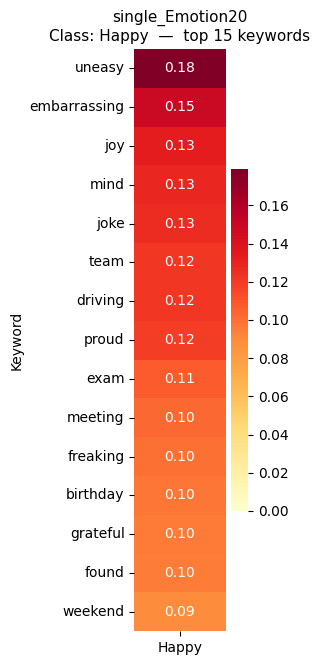

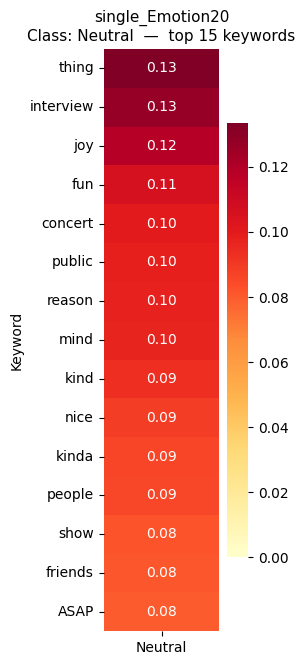

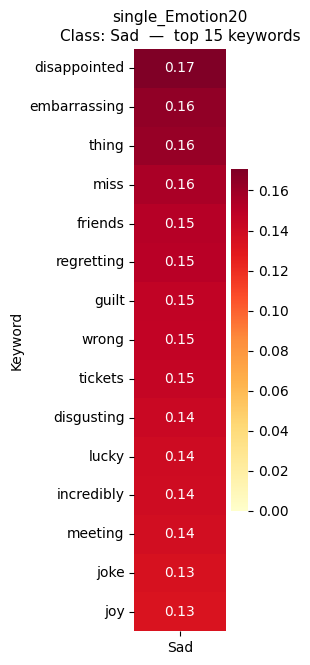

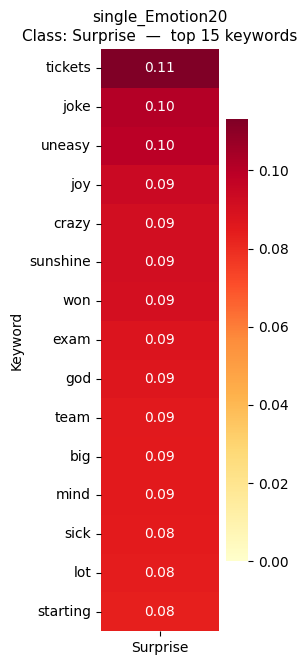

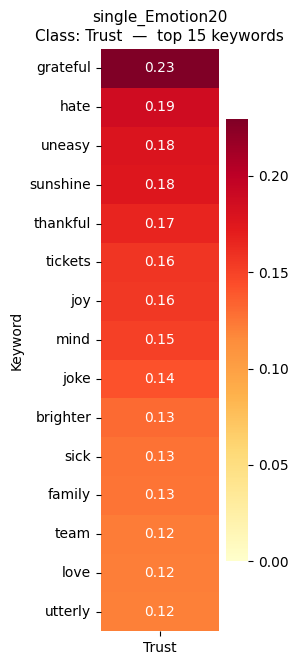


Done: single_Emotion20 — 198 keywords, BEE shape (198, 9)


In [49]:
all_bee_results["single_Emotion20"] = full_bee_pipeline(
    "single_Emotion20",
    "/content/drive/MyDrive/UPDATED_DATASETS/EmotionDataset20_mapped.csv",
)

---
## Single Dataset: GoEmotions


PIPELINE: single_GoEmotions
Loaded 53,993 samples from /content/drive/MyDrive/UPDATED_DATASETS/GoEmotions_mapped.csv
Label distribution:
label
Neutral         15971
Happy           14630
Angry            4596
Trust            4471
Anticipation     4106
Surprise         3360
Sad              3224
Disgust          2849
Fear              786
Name: count, dtype: int64

--- Training CLM for single_GoEmotions ---


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Map:   0%|          | 0/53993 [00:00<?, ? examples/s]

Step,Training Loss
100,4.913927
200,4.841087
300,4.833542
400,4.764373
500,4.722592
600,4.731823
700,4.693376
800,4.637714
900,4.654813
1000,4.664085


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- Training Classification Head for single_GoEmotions ---


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./clm_single_GoEmotions
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/53993 [00:00<?, ? examples/s]

Step,Training Loss
100,3.928144
200,2.237921
300,2.029720
400,1.822755
500,1.840201
600,1.635483
700,1.604190
800,1.601070
900,1.584981
1000,1.544184


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- BEE Analysis for single_GoEmotions ---


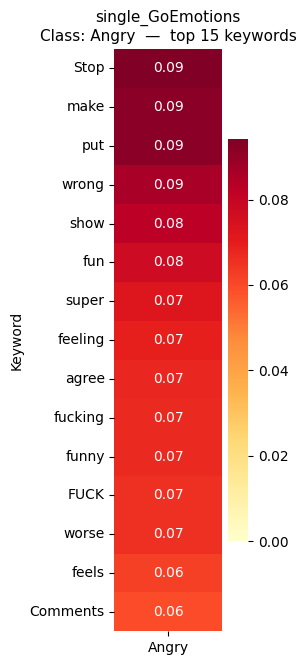

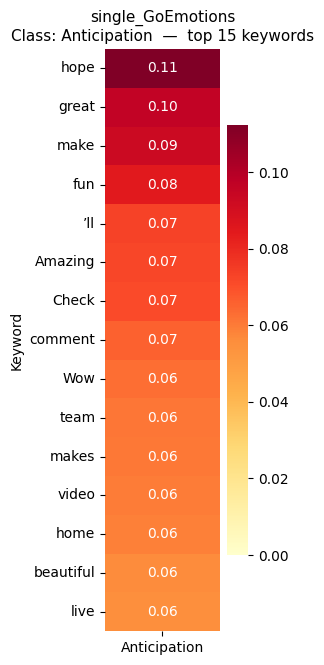

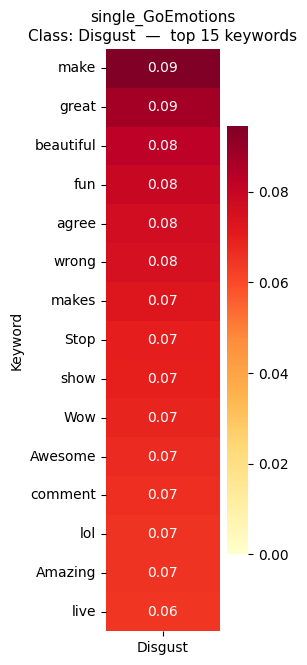

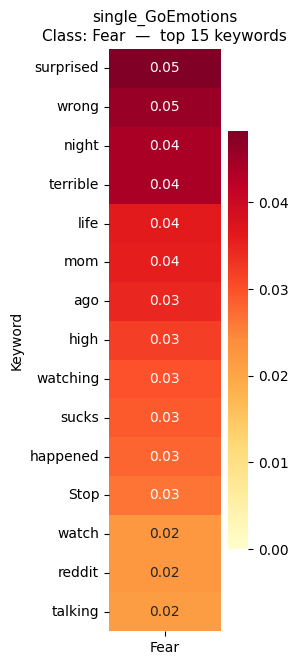

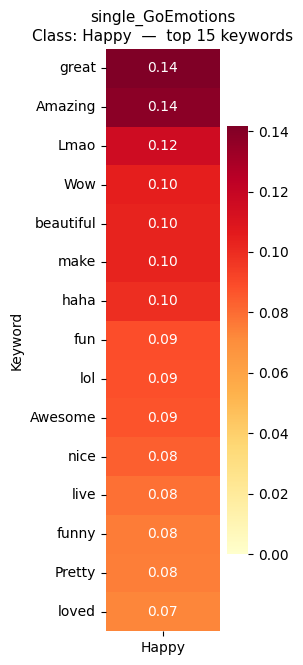

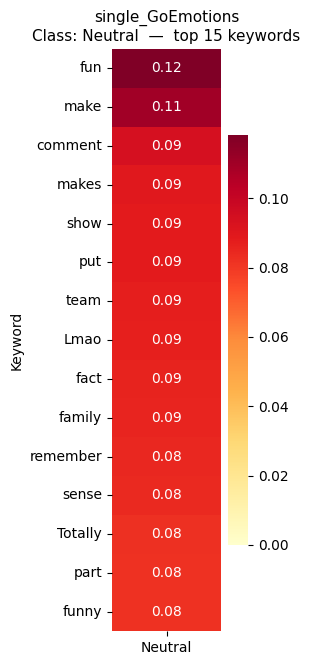

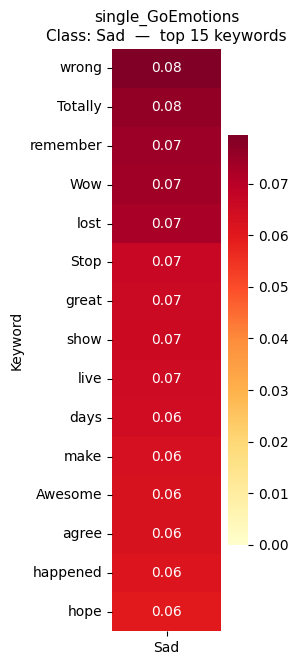

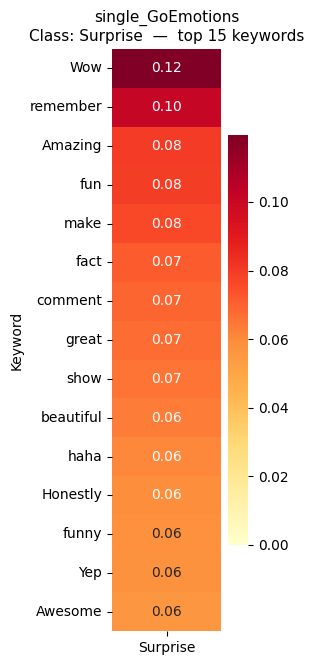

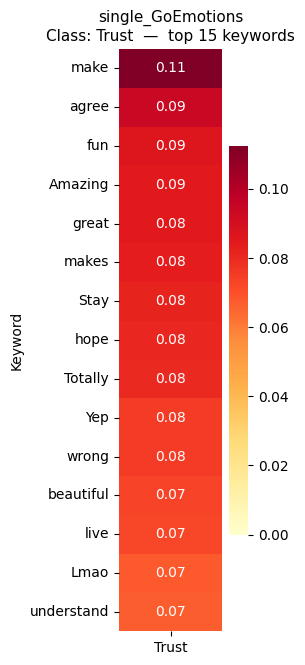


Done: single_GoEmotions — 198 keywords, BEE shape (198, 9)


In [50]:
all_bee_results["single_GoEmotions"] = full_bee_pipeline(
    "single_GoEmotions",
    "/content/drive/MyDrive/UPDATED_DATASETS/GoEmotions_mapped.csv",
)

---
## Single Dataset: XED & SMED


PIPELINE: single_XED_SMED
Loaded 92,978 samples from /content/drive/MyDrive/UPDATED_DATASETS/XED_and_SMED.csv
Label distribution:
label
Happy           25088
Neutral         23508
Sad             18257
Angry           13031
Surprise         4265
Anticipation     2706
Trust            2686
Fear             1797
Disgust          1640
Name: count, dtype: int64

--- Training CLM for single_XED_SMED ---


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

Map:   0%|          | 0/92978 [00:00<?, ? examples/s]

Step,Training Loss
100,5.369524
200,5.180454
300,5.142791
400,5.049158
500,5.023737
600,4.931489
700,4.930699
800,4.909823
900,4.905710
1000,4.868599


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- Training Classification Head for single_XED_SMED ---


Loading weights:   0%|          | 0/75 [00:00<?, ?it/s]

GPTNeoXForSequenceClassification LOAD REPORT from: ./clm_single_XED_SMED
Key              | Status     | 
-----------------+------------+-
embed_out.weight | UNEXPECTED | 
score.weight     | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Map:   0%|          | 0/92978 [00:00<?, ? examples/s]

Step,Training Loss
100,3.941542
200,1.822129
300,1.637006
400,1.646935
500,1.553554
600,1.471259
700,1.406246
800,1.385086
900,1.351238
1000,1.380427


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]


--- BEE Analysis for single_XED_SMED ---


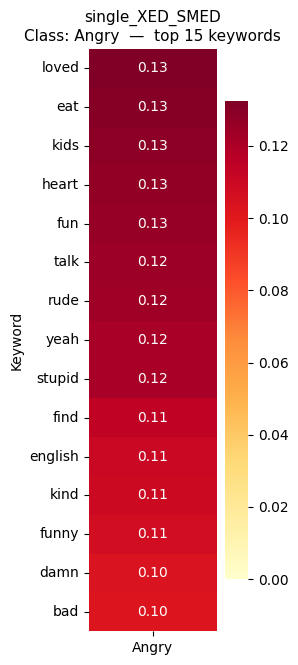

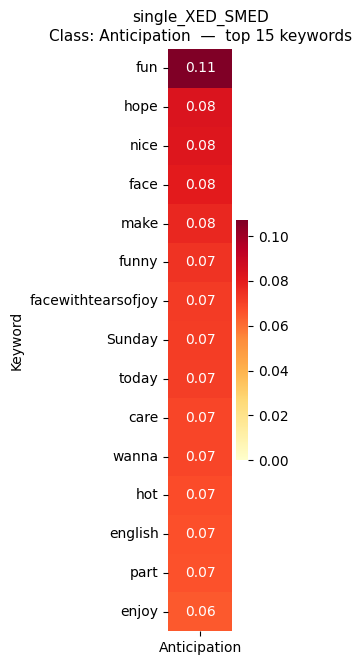

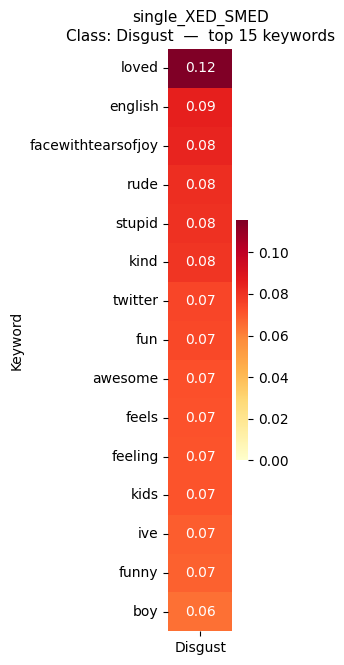

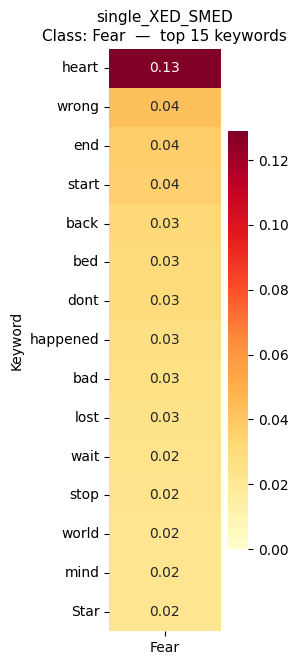

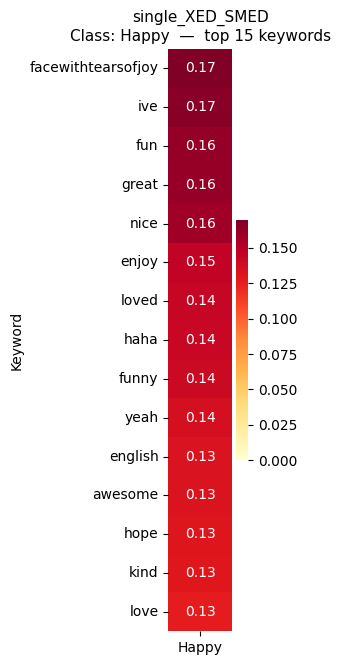

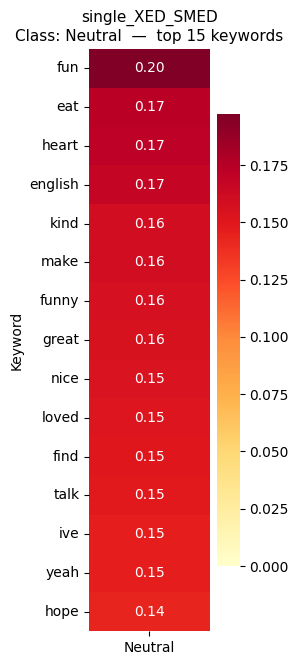

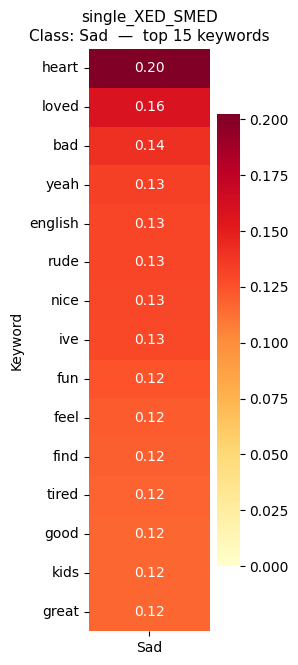

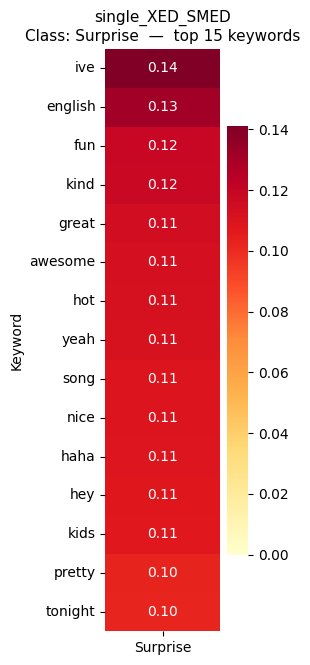

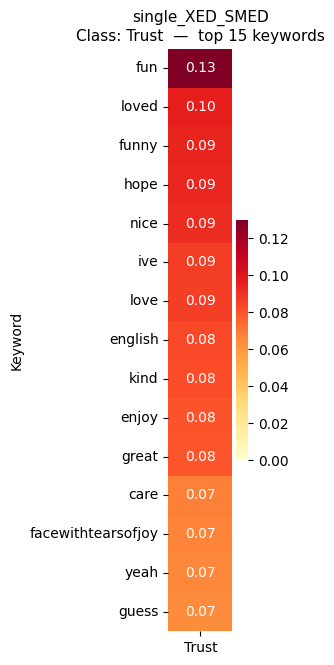


Done: single_XED_SMED — 197 keywords, BEE shape (197, 9)


In [51]:
all_bee_results["single_XED_SMED"] = full_bee_pipeline(
    "single_XED_SMED",
    "/content/drive/MyDrive/UPDATED_DATASETS/XED_and_SMED.csv",
)

---
# Diagnostic Analysis

Compute the diagnostic matrix:
- `a_{n\1,i} = linearize(alpha_n - alpha_{n-1,i})` — what dataset i contributes
- `a_{1,i} = linearize(alpha_{1,i})` — BEE from dataset i alone
- `D[i,j] = cos_sim(a_{1,i}, a_{n\1,j})` — should have largest values on diagonal

In [52]:
# ============================================================================
# Step 1: Align all BEE matrices using union of keywords + zero-fill
# ============================================================================
from sklearn.metrics.pairwise import cosine_similarity as sklearn_cosine_sim

DATASET_NAMES = ["EmoLit", "Emotion20", "GoEmotions", "XED_SMED"]
N1_KEYS = ["n-1_no_EmoLit", "n-1_no_Emotion20", "n-1_no_GoEmotions", "n-1_no_XED_SMED"]
SINGLE_KEYS = ["single_EmoLit", "single_Emotion20", "single_GoEmotions", "single_XED_SMED"]

# The canonical 9-class label order
CANONICAL_LABELS = ["Angry", "Anticipation", "Disgust", "Fear", "Happy", "Neutral", "Sad", "Surprise", "Trust"]
canonical_label_to_idx = {label: i for i, label in enumerate(CANONICAL_LABELS)}

# Collect all unique keywords across all results (alpha_n + 8 classifiers)
all_keywords_set = set()
for key, result in all_bee_results.items():
    all_keywords_set.update(result["keywords"])

# Sort for consistent ordering
all_keywords_union = sorted(all_keywords_set)
keyword_to_idx = {kw: i for i, kw in enumerate(all_keywords_union)}

num_keywords = len(all_keywords_union)
num_classes = 9  # 9 emotion labels

print(f"Union of all keywords: {num_keywords}")
print(f"Classes: {num_classes}")

def align_matrix(result):
    """
    Create an aligned matrix of shape (num_union_keywords, 9).
    Handles classifiers with fewer than 9 classes by mapping columns
    to their correct position using the bee_df column names.
    Zero-fill for missing keywords AND missing classes.
    """
    aligned = np.zeros((num_keywords, num_classes))
    kw_list = result["keywords"]
    bee_df = result["bee_df"]

    # Find which canonical labels are present in this result's bee_df
    present_labels = [col for col in bee_df.columns if col in canonical_label_to_idx]

    for local_kw_idx, kw in enumerate(kw_list):
        global_kw_idx = keyword_to_idx[kw]
        for label in present_labels:
            class_idx = canonical_label_to_idx[label]
            # Get the similarity value from the DataFrame
            aligned[global_kw_idx, class_idx] = bee_df.iloc[local_kw_idx][label]

    return aligned

# Align all matrices
aligned_matrices = {}
for key, result in all_bee_results.items():
    bee_df = result["bee_df"]
    present = [c for c in bee_df.columns if c in canonical_label_to_idx]
    missing = [c for c in CANONICAL_LABELS if c not in present]
    aligned_matrices[key] = align_matrix(result)
    info = f"  Aligned {key}: {aligned_matrices[key].shape}"
    if missing:
        info += f" (missing classes: {missing}, zero-filled)"
    print(info)

print(f"All matrices aligned to shape ({num_keywords}, {num_classes})")

Union of all keywords: 535
Classes: 9
  Aligned alpha_n: (535, 9)
  Aligned n-1_no_EmoLit: (535, 9)
  Aligned n-1_no_Emotion20: (535, 9)
  Aligned n-1_no_GoEmotions: (535, 9)
  Aligned n-1_no_XED_SMED: (535, 9)
  Aligned single_EmoLit: (535, 9)
  Aligned single_Emotion20: (535, 9)
  Aligned single_GoEmotions: (535, 9)
  Aligned single_XED_SMED: (535, 9)
All matrices aligned to shape (535, 9)


In [53]:
# ============================================================================
# Step 2: Compute a_{n\1,i} and a_{1,i}
# ============================================================================

alpha_n_matrix = aligned_matrices["alpha_n"]

# a_{n\1,i} = linearize(alpha_n - alpha_{n-1,i})
# This represents the "contribution" of dataset i (what changes when you add it)
a_n1 = {}
for name, n1_key in zip(DATASET_NAMES, N1_KEYS):
    diff = alpha_n_matrix - aligned_matrices[n1_key]
    a_n1[name] = diff.flatten()  # linearize
    print(f"a_n\\1 for {name}: shape {a_n1[name].shape}, "
          f"norm={np.linalg.norm(a_n1[name]):.4f}")

# a_{1,i} = linearize(alpha_{1,i})
# This is the BEE fingerprint from dataset i alone
a_1 = {}
for name, s_key in zip(DATASET_NAMES, SINGLE_KEYS):
    a_1[name] = aligned_matrices[s_key].flatten()  # linearize
    print(f"a_1 for {name}: shape {a_1[name].shape}, "
          f"norm={np.linalg.norm(a_1[name]):.4f}")

a_n\1 for EmoLit: shape (4815,), norm=1.9115
a_n\1 for Emotion20: shape (4815,), norm=1.5277
a_n\1 for GoEmotions: shape (4815,), norm=1.6346
a_n\1 for XED_SMED: shape (4815,), norm=1.2483
a_1 for EmoLit: shape (4815,), norm=1.6267
a_1 for Emotion20: shape (4815,), norm=2.5711
a_1 for GoEmotions: shape (4815,), norm=1.6477
a_1 for XED_SMED: shape (4815,), norm=2.7088


In [54]:
# ============================================================================
# Step 3: Build the 4x4 Diagnostic Matrix
# ============================================================================

# D[i,j] = cos_sim(a_{1,i}, a_{n\1,j})
# Rows: individual datasets (a_1)
# Columns: leave-one-out gaps (a_{n\1})
# Diagonal should have the largest values

diagnostic_matrix = np.zeros((4, 4))
for i, name_i in enumerate(DATASET_NAMES):
    for j, name_j in enumerate(DATASET_NAMES):
        vec_1 = a_1[name_i].reshape(1, -1)
        vec_n1 = a_n1[name_j].reshape(1, -1)
        diagnostic_matrix[i, j] = sklearn_cosine_sim(vec_1, vec_n1)[0, 0]

diag_df = pd.DataFrame(
    diagnostic_matrix,
    index=[f"a_1({n})" for n in DATASET_NAMES],
    columns=[f"a_n\\1({n})" for n in DATASET_NAMES],
)

print("Diagnostic Matrix (cos_sim between a_1 and a_n\\1):")
print(diag_df.to_string())
print(f"\nDiagonal values: {np.diag(diagnostic_matrix)}")
print(f"Diagonal dominance check: diagonal > all off-diagonal in each row?")
for i, name in enumerate(DATASET_NAMES):
    row = diagnostic_matrix[i]
    diag_val = row[i]
    is_dominant = all(diag_val >= row[j] for j in range(4) if j != i)
    print(f"  {name}: diagonal={diag_val:.4f}, dominant={'YES' if is_dominant else 'NO'}")

Diagnostic Matrix (cos_sim between a_1 and a_n\1):
                 a_n\1(EmoLit)  a_n\1(Emotion20)  a_n\1(GoEmotions)  a_n\1(XED_SMED)
a_1(EmoLit)           0.433976         -0.013277           0.050989         0.093248
a_1(Emotion20)       -0.093754          0.039458          -0.079061         0.122277
a_1(GoEmotions)      -0.037598         -0.063914          -0.029780         0.153285
a_1(XED_SMED)        -0.097779         -0.141999          -0.164422         0.206908

Diagonal values: [ 0.43397585  0.03945785 -0.02978048  0.20690829]
Diagonal dominance check: diagonal > all off-diagonal in each row?
  EmoLit: diagonal=0.4340, dominant=YES
  Emotion20: diagonal=0.0395, dominant=NO
  GoEmotions: diagonal=-0.0298, dominant=NO
  XED_SMED: diagonal=0.2069, dominant=YES


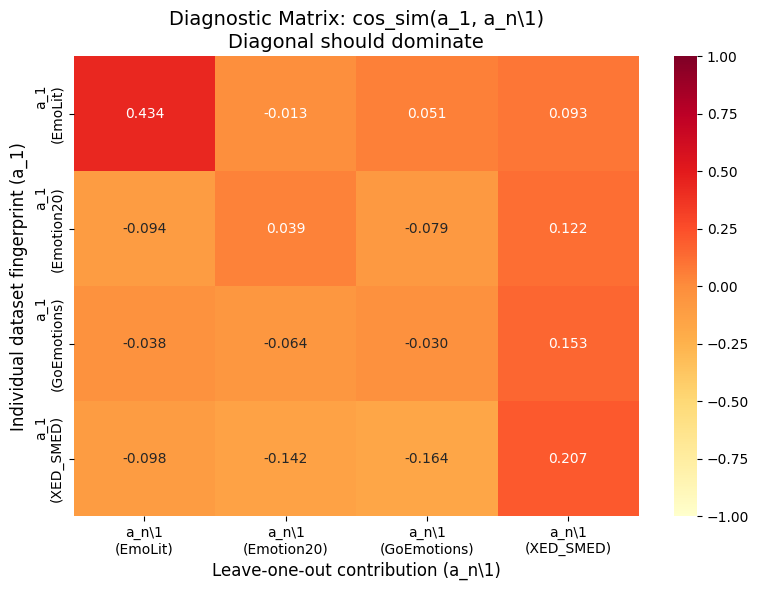

In [55]:
# ============================================================================
# Step 4: Visualize the Diagnostic Matrix
# ============================================================================

fig, ax = plt.subplots(figsize=(8, 6))

sns.heatmap(
    diagnostic_matrix,
    annot=True,
    fmt=".3f",
    cmap="YlOrRd",
    xticklabels=[f"a_n\\1\n({n})" for n in DATASET_NAMES],
    yticklabels=[f"a_1\n({n})" for n in DATASET_NAMES],
    vmin=-1, vmax=1,
    center=0,
    ax=ax,
)
ax.set_title("Diagnostic Matrix: cos_sim(a_1, a_n\\1)\nDiagonal should dominate", fontsize=14)
ax.set_xlabel("Leave-one-out contribution (a_n\\1)", fontsize=12)
ax.set_ylabel("Individual dataset fingerprint (a_1)", fontsize=12)

plt.tight_layout()
plt.show()

---
## Class-Level Diagnostic

Compute cosine similarity per emotion class column (not linearized).
For each class c: `D_c[i,j] = cos_sim(a_1_class_c[i], a_n1_class_c[j])`

In [56]:
# ============================================================================
# Step 5: Class-Level Cosine Similarity
# ============================================================================

# For each class, compute a 4x4 diagnostic matrix using only that class's column
class_diagnostics = {}

for class_idx, class_name in ID2LABEL.items():
    D_class = np.zeros((4, 4))
    for i, name_i in enumerate(DATASET_NAMES):
        for j, name_j in enumerate(DATASET_NAMES):
            # a_1 for class c: the class column from the aligned single-dataset matrix
            vec_1 = aligned_matrices[SINGLE_KEYS[i]][:, class_idx].reshape(1, -1)
            # a_n\1 for class c: alpha_n - alpha_{n-1} for that class column
            vec_n1 = (alpha_n_matrix[:, class_idx] - aligned_matrices[N1_KEYS[j]][:, class_idx]).reshape(1, -1)

            # Handle zero vectors
            if np.linalg.norm(vec_1) < 1e-10 or np.linalg.norm(vec_n1) < 1e-10:
                D_class[i, j] = 0.0
            else:
                D_class[i, j] = sklearn_cosine_sim(vec_1, vec_n1)[0, 0]

    class_diagnostics[class_name] = D_class

print("Class-level diagnostic matrices computed for all 9 emotions.")

Class-level diagnostic matrices computed for all 9 emotions.


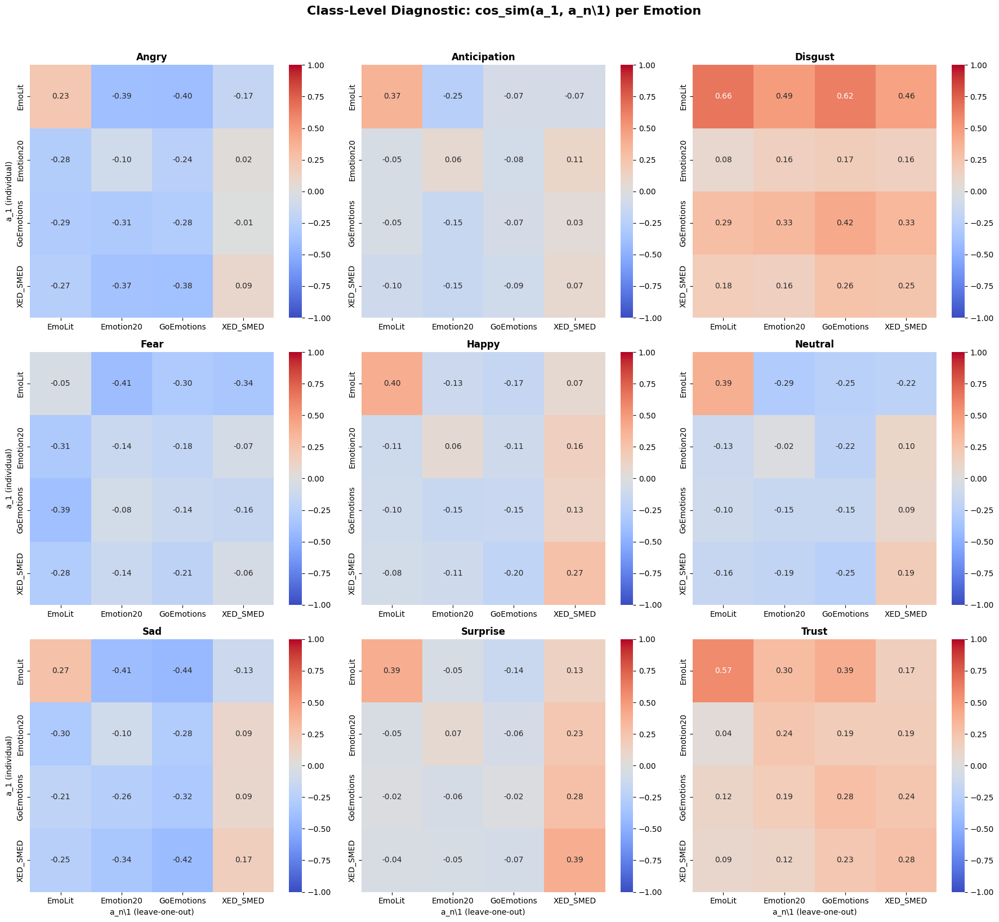

In [57]:
# ============================================================================
# Step 6: Visualize Class-Level Diagnostics (3x3 grid of heatmaps)
# ============================================================================

fig, axes = plt.subplots(3, 3, figsize=(18, 16))

for idx, (class_name, D_class) in enumerate(class_diagnostics.items()):
    row, col = divmod(idx, 3)
    ax = axes[row][col]

    sns.heatmap(
        D_class,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        center=0,
        vmin=-1, vmax=1,
        xticklabels=DATASET_NAMES,
        yticklabels=DATASET_NAMES,
        ax=ax,
    )
    ax.set_title(f"{class_name}", fontsize=12, fontweight='bold')

    # Only label outer axes
    if col > 0:
        ax.set_ylabel("")
    else:
        ax.set_ylabel("a_1 (individual)", fontsize=10)
    if row < 2:
        ax.set_xlabel("")
    else:
        ax.set_xlabel("a_n\\1 (leave-one-out)", fontsize=10)

fig.suptitle("Class-Level Diagnostic: cos_sim(a_1, a_n\\1) per Emotion",
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

In [58]:
# ============================================================================
# Step 7: Summary — diagonal dominance per class
# ============================================================================

print(f"{'CLASS':<15} | {'DIAG MEAN':>10} | {'OFF-DIAG MEAN':>14} | {'DOMINANT?':>10}")
print("-" * 60)

for class_name, D_class in class_diagnostics.items():
    diag_vals = np.diag(D_class)
    mask = ~np.eye(4, dtype=bool)
    off_diag_vals = D_class[mask]
    diag_mean = np.mean(diag_vals)
    off_diag_mean = np.mean(off_diag_vals)
    dominant = diag_mean > off_diag_mean
    print(f"{class_name:<15} | {diag_mean:>10.4f} | {off_diag_mean:>14.4f} | {'YES' if dominant else 'NO':>10}")

print(f"\n{'='*60}")
print("GLOBAL DIAGNOSTIC:")
diag_vals = np.diag(diagnostic_matrix)
mask = ~np.eye(4, dtype=bool)
off_diag_vals = diagnostic_matrix[mask]
print(f"  Diagonal mean:     {np.mean(diag_vals):.4f}")
print(f"  Off-diagonal mean: {np.mean(off_diag_vals):.4f}")
print(f"  Diagonal dominant: {'YES' if np.mean(diag_vals) > np.mean(off_diag_vals) else 'NO'}")

CLASS           |  DIAG MEAN |  OFF-DIAG MEAN |  DOMINANT?
------------------------------------------------------------
Angry           |    -0.0161 |        -0.2577 |        YES
Anticipation    |     0.1087 |        -0.0786 |        YES
Disgust         |     0.3715 |         0.2943 |        YES
Fear            |    -0.0981 |        -0.2404 |        YES
Happy           |     0.1448 |        -0.0667 |        YES
Neutral         |     0.1015 |        -0.1470 |        YES
Sad             |     0.0055 |        -0.2382 |        YES
Surprise        |     0.2081 |         0.0090 |        YES
Trust           |     0.3406 |         0.1889 |        YES

GLOBAL DIAGNOSTIC:
  Diagonal mean:     0.1626
  Off-diagonal mean: -0.0227
  Diagonal dominant: YES


In [59]:
# ============================================================================
# BEE Results for ALL classifiers — union keywords sorted alphabetically (A-Z)
# Styled with color gradients
# ============================================================================

CANONICAL_LABELS = ["Angry", "Anticipation", "Disgust", "Fear", "Happy", "Neutral", "Sad", "Surprise", "Trust"]

all_config_keys = ["alpha_n"] + N1_KEYS + SINGLE_KEYS
all_config_names = ["Full Dataset (alpha_n)"] + \
    [f"N-1: No {n}" for n in DATASET_NAMES] + \
    [f"Single: {n}" for n in DATASET_NAMES]

for config_key, config_name in zip(all_config_keys, all_config_names):
    matrix = aligned_matrices[config_key]  # shape: (num_keywords, 9)

    # Compute bias score
    bias_scores = np.max(matrix, axis=1) - np.min(matrix, axis=1)

    # Build DataFrame
    bee_df_aligned = pd.DataFrame({"Keyword": all_keywords_union, "Bias_Score": bias_scores})
    for class_idx, label in enumerate(CANONICAL_LABELS):
        bee_df_aligned[label] = matrix[:, class_idx]

    # Sort alphabetically by keyword
    bee_df_aligned = bee_df_aligned.sort_values("Keyword", ascending=True).reset_index(drop=True)

    print(f"\n{"="*80}")
    print(f"BEE RESULTS — {config_name} ({len(bee_df_aligned)} keywords, alphabetical)")
    print(f"{"="*80}")

    # Style: color the class columns with coolwarm, bias score with YlOrRd
    styled = bee_df_aligned.style \
        .background_gradient(subset=CANONICAL_LABELS, cmap="coolwarm", axis=None) \
        .background_gradient(subset=["Bias_Score"], cmap="YlOrRd") \
        .format({col: "{:.4f}" for col in CANONICAL_LABELS + ["Bias_Score"]}) \
        .set_caption(f"BEE — {config_name}")

    display(styled)


BEE RESULTS — Full Dataset (alpha_n) (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,Absolutely,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,Amazing,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,America,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,American,0.0720,0.0263,0.0332,0.0695,0.0000,0.0615,0.0720,0.0365,0.0545,0.0631
5,Awesome,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,Canada,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,Change,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,Check,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,Christ,0.0720,0.0263,0.0332,0.0695,0.0000,0.0615,0.0720,0.0365,0.0545,0.0631



BEE RESULTS — N-1: No EmoLit (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,Absolutely,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,Amazing,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,America,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,American,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,Awesome,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,Canada,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,Change,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,Check,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,Christ,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000



BEE RESULTS — N-1: No Emotion20 (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,Absolutely,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,Amazing,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,America,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,American,0.0710,0.0359,0.0326,0.0380,0.0000,0.0368,0.0710,0.0356,0.0406,0.0268
5,Awesome,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,Canada,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,Change,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,Check,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,Christ,0.0579,0.0158,0.0138,0.0097,0.0000,0.0213,0.0579,0.0562,0.0314,0.0240



BEE RESULTS — N-1: No GoEmotions (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,Absolutely,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,Amazing,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,America,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,American,0.0381,0.0114,0.0103,0.0142,0.0055,0.0034,0.0307,0.0187,0.0381,0.0000
5,Awesome,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,Canada,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,Change,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,Check,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,Christ,0.0562,0.0066,0.0000,0.0104,0.0067,0.0233,0.0423,0.0376,0.0422,0.0562



BEE RESULTS — N-1: No XED_SMED (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,Absolutely,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,Amazing,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,America,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,American,0.0911,0.0220,0.0291,0.0510,0.0000,0.0459,0.0911,0.0434,0.0539,0.0506
5,Awesome,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,Canada,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,Change,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,Check,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,Christ,0.0722,0.0038,0.0057,0.0183,0.0000,0.0303,0.0722,0.0390,0.0405,0.0406



BEE RESULTS — Single: EmoLit (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,Absolutely,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,Amazing,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,America,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,American,0.0826,0.0111,0.0198,0.0826,0.0000,0.0342,0.0468,0.0299,0.0157,0.0441
5,Awesome,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,Canada,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,Change,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,Check,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,Christ,0.0636,0.0116,0.0130,0.0636,0.0000,0.0289,0.0469,0.0406,0.0253,0.0497



BEE RESULTS — Single: Emotion20 (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.0872,0.0217,0.0605,0.0599,0.0000,0.0743,0.0802,0.0776,0.0652,0.0872
1,Absolutely,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,Amazing,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,America,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,American,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,Awesome,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,Canada,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,Change,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,Check,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,Christ,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000



BEE RESULTS — Single: GoEmotions (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,Absolutely,0.0463,0.0169,0.0326,0.0212,0.0000,0.0439,0.0463,0.0455,0.0269,0.0305
2,Amazing,0.1381,0.0102,0.0720,0.0651,0.0000,0.1381,0.0720,0.0264,0.0802,0.0851
3,America,0.0483,0.0293,0.0118,0.0115,0.0000,0.0125,0.0483,0.0095,0.0177,0.0158
4,American,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,Awesome,0.0872,0.0495,0.0550,0.0669,0.0000,0.0872,0.0547,0.0625,0.0563,0.0389
6,Canada,0.0496,0.0164,0.0098,0.0121,0.0080,0.0000,0.0496,0.0077,0.0083,0.0137
7,Change,0.0775,0.0434,0.0454,0.0346,0.0000,0.0236,0.0775,0.0288,0.0394,0.0498
8,Check,0.0815,0.0519,0.0711,0.0487,0.0000,0.0437,0.0815,0.0341,0.0518,0.0645
9,Christ,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000



BEE RESULTS — Single: XED_SMED (535 keywords, alphabetical)


,Keyword,Bias_Score,Angry,Anticipation,Disgust,Fear,Happy,Neutral,Sad,Surprise,Trust
0,ASAP,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,Absolutely,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,Amazing,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,America,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,American,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,Awesome,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,Canada,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,Change,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,Check,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,Christ,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


In [60]:
# ============================================================================
# Export ALL BEE tables to a single colored Excel file
# One sheet per classifier + one "Side by Side" sheet
# ============================================================================
!pip install -q openpyxl

import openpyxl
from openpyxl.styles import PatternFill, Font, Alignment, Border, Side
from openpyxl.utils import get_column_letter
import colorsys

CANONICAL_LABELS = ["Angry", "Anticipation", "Disgust", "Fear", "Happy", "Neutral", "Sad", "Surprise", "Trust"]

all_config_keys = ["alpha_n"] + N1_KEYS + SINGLE_KEYS
all_config_names = ["Full (alpha_n)", "N-1 No EmoLit", "N-1 No Emotion20", "N-1 No GoEmotions", "N-1 No XED_SMED",
                    "Single EmoLit", "Single Emotion20", "Single GoEmotions", "Single XED_SMED"]

def value_to_coolwarm_hex(val, vmin, vmax):
    """Map a value to a coolwarm color (blue=low, white=mid, red=high)."""
    if vmax == vmin:
        return "FFFFFF"
    t = (val - vmin) / (vmax - vmin)  # 0 to 1
    # Blue (0) -> White (0.5) -> Red (1)
    if t < 0.5:
        r = int(255 * (2 * t) + 59 * (1 - 2 * t))
        g = int(255 * (2 * t) + 76 * (1 - 2 * t))
        b = int(255 * (2 * t) + 192 * (1 - 2 * t) + 255 * (1 - 2 * t) * 0)
        b = min(255, int(192 + (255 - 192) * (1 - 2 * t)))
        r = min(255, int(59 + (255 - 59) * (2 * t)))
        g = min(255, int(76 + (255 - 76) * (2 * t)))
    else:
        t2 = (t - 0.5) * 2
        r = 255
        g = int(255 * (1 - t2))
        b = int(255 * (1 - t2))
    return f"{min(255,max(0,r)):02X}{min(255,max(0,g)):02X}{min(255,max(0,b)):02X}"

def value_to_ylorrd_hex(val, vmin, vmax):
    """Map a value to YlOrRd (yellow=low, red=high)."""
    if vmax == vmin:
        return "FFFFB2"
    t = (val - vmin) / (vmax - vmin)
    r = 255
    g = int(255 * (1 - t * 0.7))
    b = int(178 * (1 - t))
    return f"{min(255,max(0,r)):02X}{min(255,max(0,g)):02X}{min(255,max(0,b)):02X}"

# Build all DataFrames (alphabetical order)
all_dfs = {}
for config_key, config_name in zip(all_config_keys, all_config_names):
    matrix = aligned_matrices[config_key]
    bias_scores = np.max(matrix, axis=1) - np.min(matrix, axis=1)
    df = pd.DataFrame({"Keyword": all_keywords_union, "Bias_Score": bias_scores})
    for class_idx, label in enumerate(CANONICAL_LABELS):
        df[label] = matrix[:, class_idx]
    df = df.sort_values("Keyword", ascending=True).reset_index(drop=True)
    all_dfs[config_name] = df

# --- Create Excel workbook ---
wb = openpyxl.Workbook()
wb.remove(wb.active)

header_font = Font(bold=True, size=11)
thin_border = Border(
    left=Side(style="thin"), right=Side(style="thin"),
    top=Side(style="thin"), bottom=Side(style="thin")
)

# Get global min/max for consistent coloring across sheets
all_class_vals = []
all_bias_vals = []
for df in all_dfs.values():
    all_class_vals.extend(df[CANONICAL_LABELS].values.flatten().tolist())
    all_bias_vals.extend(df["Bias_Score"].values.tolist())
class_vmin, class_vmax = min(all_class_vals), max(all_class_vals)
bias_vmin, bias_vmax = min(all_bias_vals), max(all_bias_vals)

# --- Individual sheets ---
for config_name, df in all_dfs.items():
    sheet_name = config_name[:31]  # Excel sheet name limit
    ws = wb.create_sheet(title=sheet_name)
    cols = list(df.columns)

    # Header row
    for col_idx, col_name in enumerate(cols, 1):
        cell = ws.cell(row=1, column=col_idx, value=col_name)
        cell.font = header_font
        cell.border = thin_border
        cell.fill = PatternFill(start_color="D9E1F2", end_color="D9E1F2", fill_type="solid")

    # Data rows
    for row_idx, (_, row) in enumerate(df.iterrows(), 2):
        for col_idx, col_name in enumerate(cols, 1):
            val = row[col_name]
            cell = ws.cell(row=row_idx, column=col_idx, value=val)
            cell.border = thin_border

            if col_name in CANONICAL_LABELS:
                cell.number_format = "0.0000"
                color = value_to_coolwarm_hex(val, class_vmin, class_vmax)
                cell.fill = PatternFill(start_color=color, end_color=color, fill_type="solid")
            elif col_name == "Bias_Score":
                cell.number_format = "0.0000"
                color = value_to_ylorrd_hex(val, bias_vmin, bias_vmax)
                cell.fill = PatternFill(start_color=color, end_color=color, fill_type="solid")

    # Auto-width
    for col_idx in range(1, len(cols) + 1):
        ws.column_dimensions[get_column_letter(col_idx)].width = 14
    ws.column_dimensions["A"].width = 20

# --- Side by Side sheet ---
ws_sbs = wb.create_sheet(title="Side by Side", index=0)

# For side-by-side: each classifier gets Keyword + 9 class columns, separated by a gap
block_width = 1 + len(CANONICAL_LABELS)  # Keyword + 9 classes
gap = 1
start_col = 1

for cfg_idx, (config_name, df) in enumerate(all_dfs.items()):
    col_offset = start_col + cfg_idx * (block_width + gap)

    # Title row
    title_cell = ws_sbs.cell(row=1, column=col_offset, value=config_name)
    title_cell.font = Font(bold=True, size=12)

    # Header row
    headers = ["Keyword"] + CANONICAL_LABELS
    for h_idx, h_name in enumerate(headers):
        cell = ws_sbs.cell(row=2, column=col_offset + h_idx, value=h_name)
        cell.font = header_font
        cell.border = thin_border
        cell.fill = PatternFill(start_color="D9E1F2", end_color="D9E1F2", fill_type="solid")

    # Data
    for row_idx, (_, row) in enumerate(df.iterrows(), 3):
        # Keyword
        cell = ws_sbs.cell(row=row_idx, column=col_offset, value=row["Keyword"])
        cell.border = thin_border

        # Class values
        for c_idx, label in enumerate(CANONICAL_LABELS):
            val = row[label]
            cell = ws_sbs.cell(row=row_idx, column=col_offset + 1 + c_idx, value=val)
            cell.number_format = "0.0000"
            cell.border = thin_border
            color = value_to_coolwarm_hex(val, class_vmin, class_vmax)
            cell.fill = PatternFill(start_color=color, end_color=color, fill_type="solid")

    # Column widths
    ws_sbs.column_dimensions[get_column_letter(col_offset)].width = 18
    for c_idx in range(len(CANONICAL_LABELS)):
        ws_sbs.column_dimensions[get_column_letter(col_offset + 1 + c_idx)].width = 13

# Save
excel_path = "/content/BEE_all_classifiers.xlsx"
wb.save(excel_path)
print(f"Saved to {excel_path}")

# Download
from google.colab import files
files.download(excel_path)

Saved to /content/BEE_all_classifiers.xlsx


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [63]:
# ============================================================================
# Export BEE Scores ONLY — PAIRED: n-1 next to single for each dataset
# ============================================================================

all_dfs_bias = {}
for config_key, config_name in zip(all_config_keys_ordered, all_config_names_ordered):
    matrix = aligned_matrices[config_key]
    bias_scores = np.max(matrix, axis=1) - np.min(matrix, axis=1)
    df = pd.DataFrame({"Keyword": all_keywords_union, "Bias_Score": bias_scores})
    df = df.sort_values("Keyword", ascending=True).reset_index(drop=True)
    all_dfs_bias[config_name] = df

all_bias_vals = []
for df in all_dfs_bias.values():
    all_bias_vals.extend(df["Bias_Score"].values.tolist())
bias_vmin_b, bias_vmax_b = min(all_bias_vals), max(all_bias_vals)

wb2 = openpyxl.Workbook()
wb2.remove(wb2.active)

bias_block_width = 2  # Keyword + Bias_Score

def write_bias_block(ws, col_offset, start_row, title, df):
    cell = ws.cell(row=start_row, column=col_offset, value=title)
    cell.font = Font(bold=True, size=12)

    for h_idx, h_name in enumerate(["Keyword", "Bias_Score"]):
        cell = ws.cell(row=start_row + 1, column=col_offset + h_idx, value=h_name)
        cell.font = header_font
        cell.border = thin_border
        cell.fill = PatternFill(start_color="D9E1F2", end_color="D9E1F2", fill_type="solid")

    for row_idx, (_, row_data) in enumerate(df.iterrows(), start_row + 2):
        cell = ws.cell(row=row_idx, column=col_offset, value=row_data["Keyword"])
        cell.border = thin_border

        val = row_data["Bias_Score"]
        cell = ws.cell(row=row_idx, column=col_offset + 1, value=val)
        cell.number_format = "0.0000"
        cell.border = thin_border
        color = value_to_ylorrd_hex(val, bias_vmin_b, bias_vmax_b)
        cell.fill = PatternFill(start_color=color, end_color=color, fill_type="solid")

    ws.column_dimensions[get_column_letter(col_offset)].width = 18
    ws.column_dimensions[get_column_letter(col_offset + 1)].width = 14

n1_names = [f"N-1 No {n}" for n in DATASET_NAMES]
single_names = [f"Single {n}" for n in DATASET_NAMES]

# --- Sheet 1: Paired ---
ws_p = wb2.create_sheet(title="Paired (n-1 vs single)", index=0)

for ds_idx, ds_name in enumerate(DATASET_NAMES):
    pair_offset = ds_idx * (2 * bias_block_width + 3)
    col_left = 1 + pair_offset
    col_right = col_left + bias_block_width + 1

    write_bias_block(ws_p, col_left, 1, f"N-1 (no {ds_name})", all_dfs_bias[n1_names[ds_idx]])
    write_bias_block(ws_p, col_right, 1, f"Single ({ds_name})", all_dfs_bias[single_names[ds_idx]])

# --- Sheet 2: All ---
ws_a = wb2.create_sheet(title="All classifiers")
for cfg_idx, (config_name, df) in enumerate(all_dfs_bias.items()):
    col_offset = 1 + cfg_idx * (bias_block_width + 1)
    write_bias_block(ws_a, col_offset, 1, config_name, df)

# --- Individual pair sheets ---
for ds_idx, ds_name in enumerate(DATASET_NAMES):
    ws = wb2.create_sheet(title=f"{ds_name}"[:31])
    write_bias_block(ws, 1, 1, f"N-1 (no {ds_name})", all_dfs_bias[n1_names[ds_idx]])
    write_bias_block(ws, bias_block_width + 2, 1, f"Single ({ds_name})", all_dfs_bias[single_names[ds_idx]])
    write_bias_block(ws, 2 * (bias_block_width + 1) + 1, 1, "Full (alpha_n)", all_dfs_bias["Full (alpha_n)"])

excel_path2 = "/content/BEE_bias_scores_paired.xlsx"
wb2.save(excel_path2)
print(f"Saved to {excel_path2}")

from google.colab import files
files.download(excel_path2)

Saved to /content/BEE_bias_scores_paired.xlsx


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [62]:
# ============================================================================
# Export BEE Cosine Similarities — PAIRED: n-1 next to single for each dataset
# ============================================================================

CANONICAL_LABELS = ["Angry", "Anticipation", "Disgust", "Fear", "Happy", "Neutral", "Sad", "Surprise", "Trust"]

# Build all DataFrames
all_dfs = {}
all_config_keys_ordered = ["alpha_n"] + N1_KEYS + SINGLE_KEYS
all_config_names_ordered = ["Full (alpha_n)"] + \
    [f"N-1 No {n}" for n in DATASET_NAMES] + \
    [f"Single {n}" for n in DATASET_NAMES]

for config_key, config_name in zip(all_config_keys_ordered, all_config_names_ordered):
    matrix = aligned_matrices[config_key]
    bias_scores = np.max(matrix, axis=1) - np.min(matrix, axis=1)
    df = pd.DataFrame({"Keyword": all_keywords_union, "Bias_Score": bias_scores})
    for class_idx, label in enumerate(CANONICAL_LABELS):
        df[label] = matrix[:, class_idx]
    df = df.sort_values("Keyword", ascending=True).reset_index(drop=True)
    all_dfs[config_name] = df

# Global min/max for consistent coloring
all_class_vals = []
all_bias_vals = []
for df in all_dfs.values():
    all_class_vals.extend(df[CANONICAL_LABELS].values.flatten().tolist())
    all_bias_vals.extend(df["Bias_Score"].values.tolist())
class_vmin, class_vmax = min(all_class_vals), max(all_class_vals)
bias_vmin, bias_vmax = min(all_bias_vals), max(all_bias_vals)

wb = openpyxl.Workbook()
wb.remove(wb.active)

cols_per_block = 1 + 1 + len(CANONICAL_LABELS)  # Keyword + Bias_Score + 9 classes = 11
gap = 1

def write_block(ws, col_offset, start_row, title, df):
    """Write one classifier block at the given column offset."""
    # Title
    cell = ws.cell(row=start_row, column=col_offset, value=title)
    cell.font = Font(bold=True, size=12)

    # Headers
    headers = ["Keyword", "Bias_Score"] + CANONICAL_LABELS
    for h_idx, h_name in enumerate(headers):
        cell = ws.cell(row=start_row + 1, column=col_offset + h_idx, value=h_name)
        cell.font = header_font
        cell.border = thin_border
        cell.fill = PatternFill(start_color="D9E1F2", end_color="D9E1F2", fill_type="solid")

    # Data rows
    for row_idx, (_, row_data) in enumerate(df.iterrows(), start_row + 2):
        for h_idx, col_name in enumerate(headers):
            val = row_data[col_name]
            cell = ws.cell(row=row_idx, column=col_offset + h_idx, value=val)
            cell.border = thin_border
            if col_name in CANONICAL_LABELS:
                cell.number_format = "0.0000"
                color = value_to_coolwarm_hex(val, class_vmin, class_vmax)
                cell.fill = PatternFill(start_color=color, end_color=color, fill_type="solid")
            elif col_name == "Bias_Score":
                cell.number_format = "0.0000"
                color = value_to_ylorrd_hex(val, bias_vmin, bias_vmax)
                cell.fill = PatternFill(start_color=color, end_color=color, fill_type="solid")

    # Column widths
    ws.column_dimensions[get_column_letter(col_offset)].width = 18
    for h_idx in range(1, len(headers)):
        ws.column_dimensions[get_column_letter(col_offset + h_idx)].width = 13

# --- Sheet 1: "Paired" — for each dataset: N-1 | Single side by side ---
ws_paired = wb.create_sheet(title="Paired (n-1 vs single)", index=0)

n1_names = [f"N-1 No {n}" for n in DATASET_NAMES]
single_names = [f"Single {n}" for n in DATASET_NAMES]

for ds_idx, ds_name in enumerate(DATASET_NAMES):
    # Each pair takes 2 blocks + 1 gap between them + 2 gap to next pair
    pair_offset = ds_idx * (2 * cols_per_block + 3)
    col_left = 1 + pair_offset
    col_right = col_left + cols_per_block + gap

    write_block(ws_paired, col_left, 1, f"N-1 (no {ds_name})", all_dfs[n1_names[ds_idx]])
    write_block(ws_paired, col_right, 1, f"Single ({ds_name})", all_dfs[single_names[ds_idx]])

# --- Sheet 2: "All" — alpha_n + all 8 classifiers ---
ws_all = wb.create_sheet(title="All classifiers")

for cfg_idx, (config_name, df) in enumerate(all_dfs.items()):
    col_offset = 1 + cfg_idx * (cols_per_block + gap)
    write_block(ws_all, col_offset, 1, config_name, df)

# --- Individual sheets for each pair ---
for ds_idx, ds_name in enumerate(DATASET_NAMES):
    ws = wb.create_sheet(title=f"{ds_name}"[:31])
    write_block(ws, 1, 1, f"N-1 (no {ds_name})", all_dfs[n1_names[ds_idx]])
    write_block(ws, cols_per_block + 2, 1, f"Single ({ds_name})", all_dfs[single_names[ds_idx]])
    # Also add alpha_n for reference
    write_block(ws, 2 * (cols_per_block + 1) + 1, 1, "Full (alpha_n)", all_dfs["Full (alpha_n)"])

excel_path = "/content/BEE_cosine_paired.xlsx"
wb.save(excel_path)
print(f"Saved to {excel_path}")

from google.colab import files
files.download(excel_path)

Saved to /content/BEE_cosine_paired.xlsx


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Top 15 keywords (alphabetical from union): ['Amazing', 'American', 'Christ', 'Christian', 'English', 'French', 'German', 'Heaven', 'Indian', 'Joy', 'Lmao', 'Lord', 'Mary', 'Stop', 'Ugh']


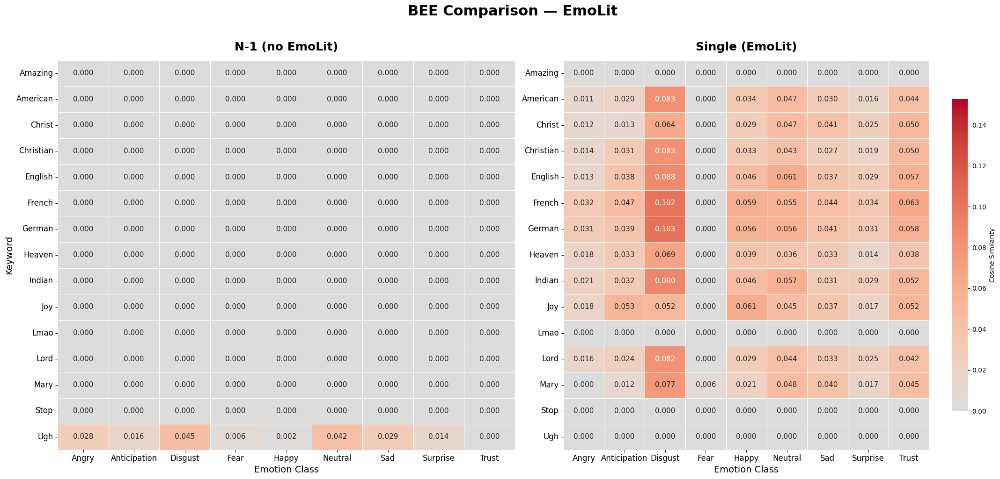

Saved: BEE_paired_EmoLit.png


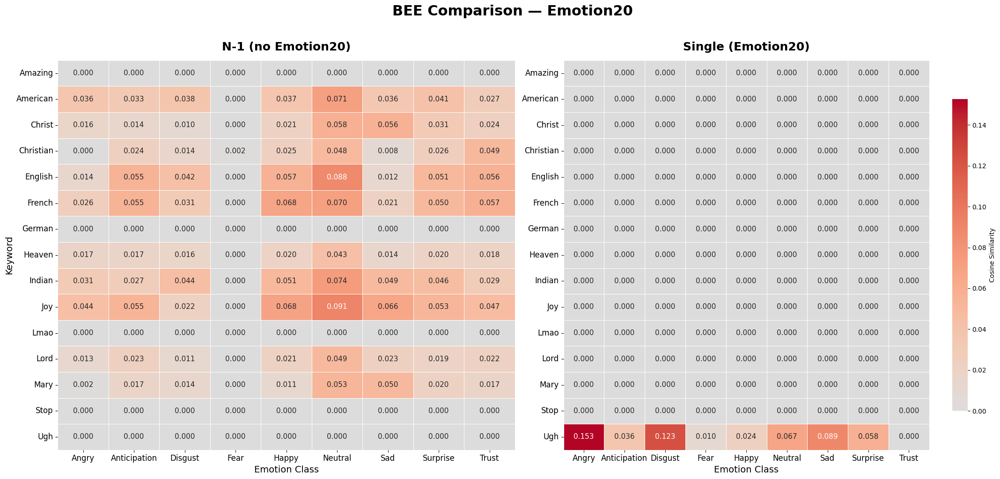

Saved: BEE_paired_Emotion20.png


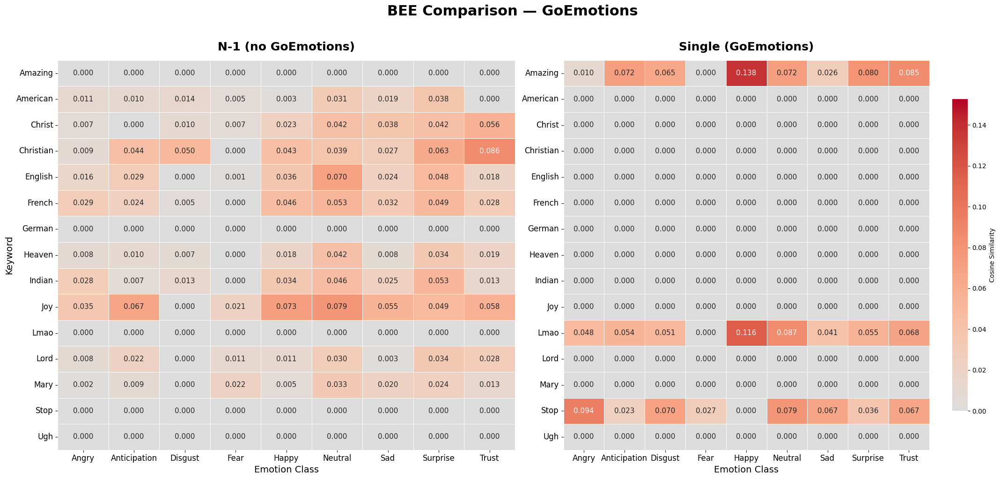

Saved: BEE_paired_GoEmotions.png


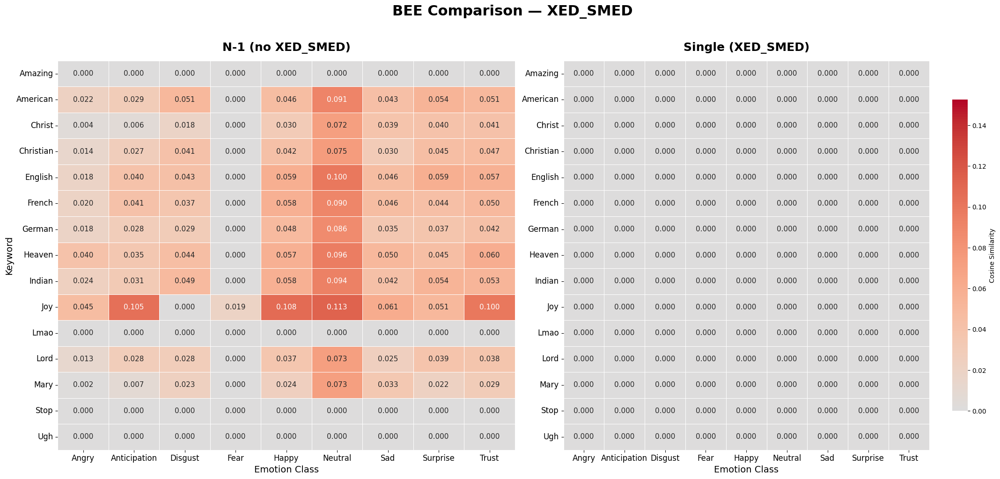

Saved: BEE_paired_XED_SMED.png


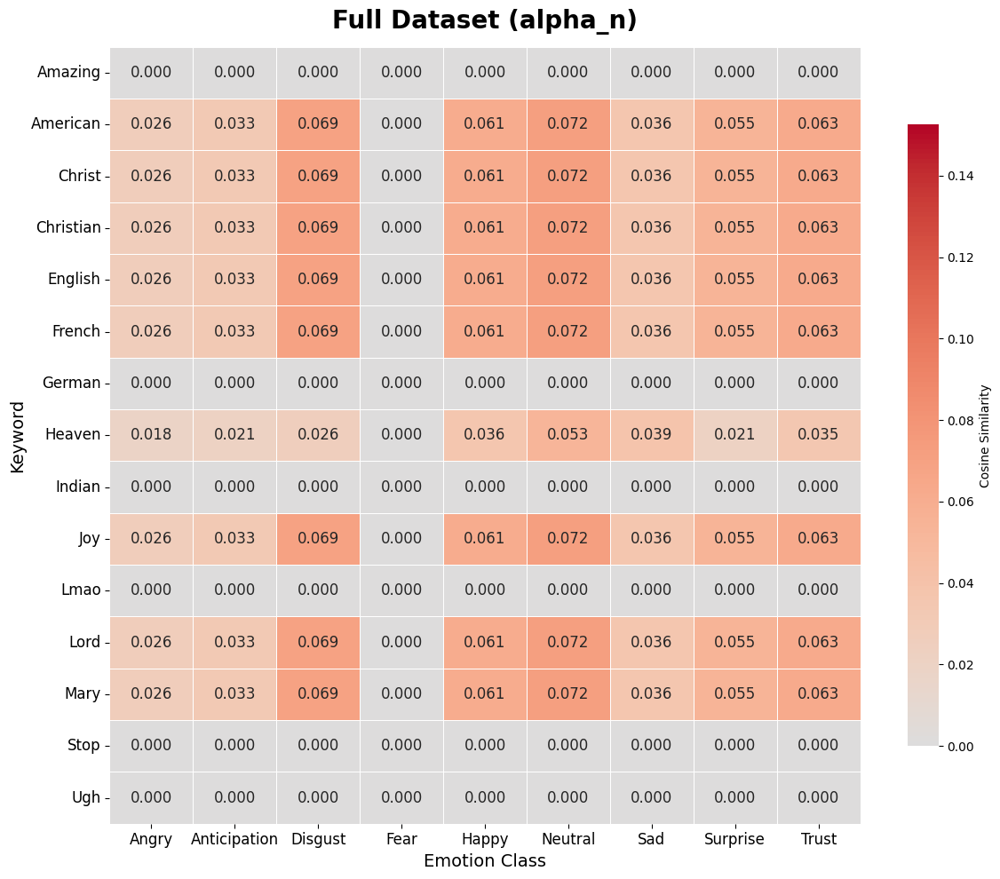

Saved: BEE_alpha_n_reference.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [64]:
# ============================================================================
# Paired BEE Heatmap Plots: N-1 vs Single for each dataset
# Same 15 keywords across all plots (top 15 union, alphabetically first 15)
# ============================================================================

CANONICAL_LABELS = ["Angry", "Anticipation", "Disgust", "Fear", "Happy", "Neutral", "Sad", "Surprise", "Trust"]

# Step 1: Collect top 15 keywords by BEE score from each classifier
top_keywords_set = set()
for config_key in ["alpha_n"] + N1_KEYS + SINGLE_KEYS:
    matrix = aligned_matrices[config_key]
    bias_scores = np.max(matrix, axis=1) - np.min(matrix, axis=1)
    top_indices = np.argsort(bias_scores)[::-1][:15]
    for idx in top_indices:
        top_keywords_set.add(all_keywords_union[idx])

# Step 2: Sort alphabetically, take first 15
plot_keywords = sorted(top_keywords_set)[:15]
plot_kw_indices = [all_keywords_union.index(kw) for kw in plot_keywords]

print(f"Top 15 keywords (alphabetical from union): {plot_keywords}")

# Step 3: Global min/max for consistent color scale across all plots
all_vals = []
for config_key in ["alpha_n"] + N1_KEYS + SINGLE_KEYS:
    matrix = aligned_matrices[config_key]
    sub = matrix[plot_kw_indices]
    all_vals.extend(sub.flatten().tolist())
vmin_global, vmax_global = min(all_vals), max(all_vals)

# Step 4: Make paired plots
for ds_idx, ds_name in enumerate(DATASET_NAMES):
    n1_key = N1_KEYS[ds_idx]
    single_key = SINGLE_KEYS[ds_idx]

    n1_matrix = aligned_matrices[n1_key][plot_kw_indices]  # (15, 9)
    single_matrix = aligned_matrices[single_key][plot_kw_indices]  # (15, 9)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(22, 10), sharey=False)

    # Left: N-1
    sns.heatmap(
        n1_matrix,
        annot=True, fmt=".3f", annot_kws={"size": 11},
        cmap="coolwarm", center=0, vmin=vmin_global, vmax=vmax_global,
        xticklabels=CANONICAL_LABELS, yticklabels=plot_keywords,
        ax=ax1, linewidths=0.5, linecolor="white",
        cbar=False,
    )
    ax1.set_title(f"N-1 (no {ds_name})", fontsize=18, fontweight="bold", pad=15)
    ax1.set_xlabel("Emotion Class", fontsize=14)
    ax1.set_ylabel("Keyword", fontsize=14)
    ax1.tick_params(labelsize=12)

    # Right: Single
    sns.heatmap(
        single_matrix,
        annot=True, fmt=".3f", annot_kws={"size": 11},
        cmap="coolwarm", center=0, vmin=vmin_global, vmax=vmax_global,
        xticklabels=CANONICAL_LABELS, yticklabels=plot_keywords,
        ax=ax2, linewidths=0.5, linecolor="white",
        cbar_kws={"shrink": 0.8, "label": "Cosine Similarity"},
    )
    ax2.set_title(f"Single ({ds_name})", fontsize=18, fontweight="bold", pad=15)
    ax2.set_xlabel("Emotion Class", fontsize=14)
    ax2.tick_params(labelsize=12)

    fig.suptitle(f"BEE Comparison — {ds_name}", fontsize=22, fontweight="bold", y=1.02)
    plt.tight_layout()

    fname = f"BEE_paired_{ds_name}.png"
    plt.savefig(fname, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: {fname}")

# Also make one with alpha_n for reference
fig, ax = plt.subplots(figsize=(12, 10))
alpha_n_matrix = aligned_matrices["alpha_n"][plot_kw_indices]
sns.heatmap(
    alpha_n_matrix,
    annot=True, fmt=".3f", annot_kws={"size": 12},
    cmap="coolwarm", center=0, vmin=vmin_global, vmax=vmax_global,
    xticklabels=CANONICAL_LABELS, yticklabels=plot_keywords,
    ax=ax, linewidths=0.5, linecolor="white",
    cbar_kws={"shrink": 0.8, "label": "Cosine Similarity"},
)
ax.set_title("Full Dataset (alpha_n)", fontsize=20, fontweight="bold", pad=15)
ax.set_xlabel("Emotion Class", fontsize=14)
ax.set_ylabel("Keyword", fontsize=14)
ax.tick_params(labelsize=12)
plt.tight_layout()
plt.savefig("BEE_alpha_n_reference.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: BEE_alpha_n_reference.png")

# Download all
from google.colab import files
for ds_name in DATASET_NAMES:
    files.download(f"BEE_paired_{ds_name}.png")
files.download("BEE_alpha_n_reference.png")

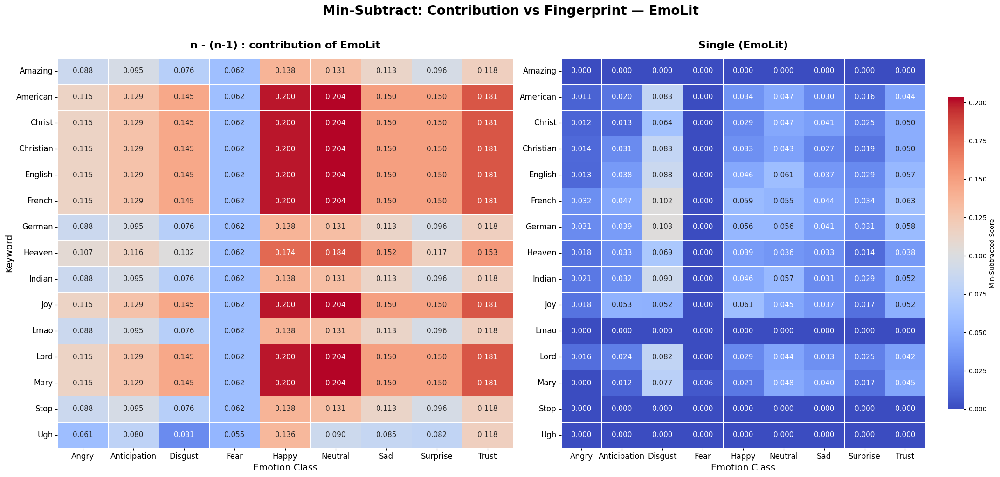

Saved: BEE_minsub_paired_EmoLit.png


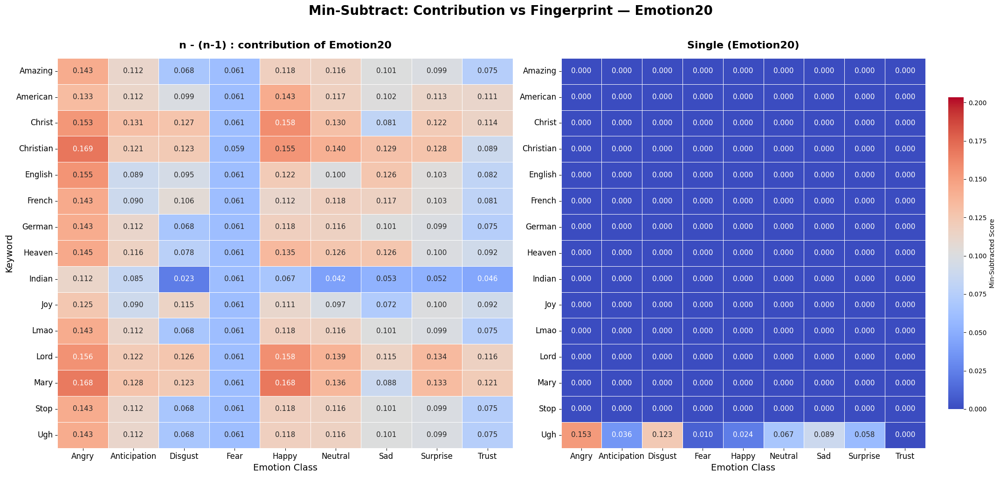

Saved: BEE_minsub_paired_Emotion20.png


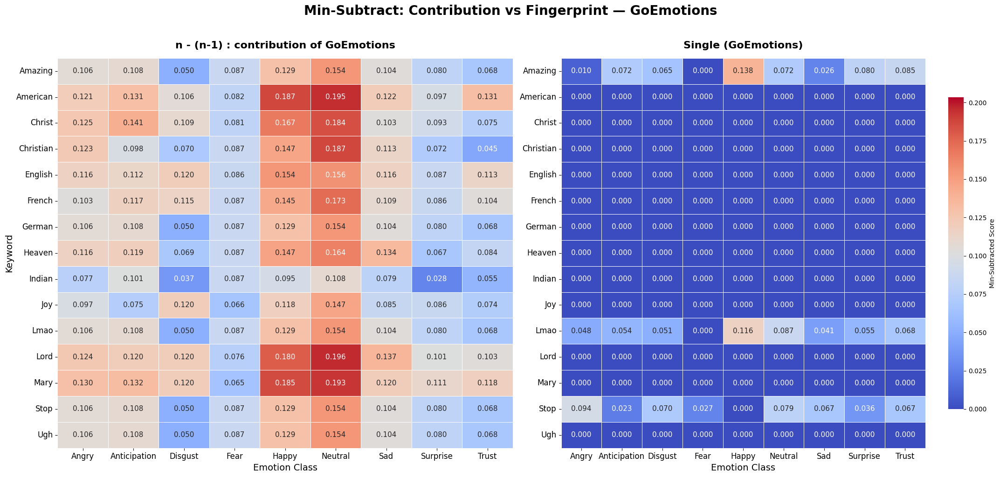

Saved: BEE_minsub_paired_GoEmotions.png


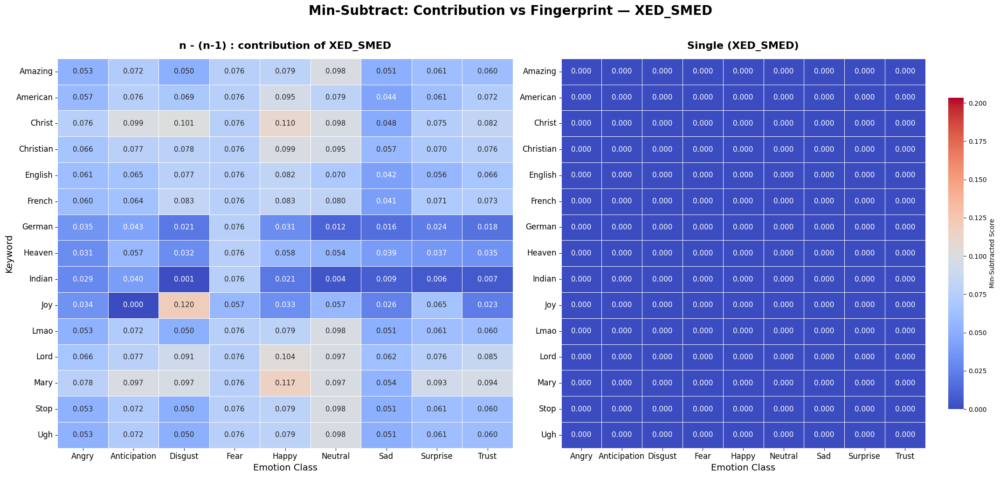

Saved: BEE_minsub_paired_XED_SMED.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [65]:
# ============================================================================
# Paired Heatmaps using MIN-SUBTRACT-PER-CLASS scoring
# Left:  a_{n\1,i} = alpha_n - alpha_{n-1,i}  (contribution of dataset i)
# Right: a_{1,i}   = alpha_{1,i}               (single dataset fingerprint)
# Both transformed with min-subtract-per-class before plotting
# ============================================================================

def min_subtract_per_class(matrix, emotion_cols):
    """
    For each class (column), subtract the minimum across all keywords.
    score(class, keyword) = sim(class, keyword) - min_keyword(sim(class))
    """
    import pandas as pd
    df = pd.DataFrame(matrix, columns=emotion_cols)
    col_mins = df.min(axis=0)
    return (df.subtract(col_mins, axis=1)).values

# Compute (alpha_n - alpha_{n-1}) for each dataset, then apply min-subtract
alpha_n_matrix = aligned_matrices["alpha_n"]  # (num_kw, 9)

aligned_matrices_minsub_left = {}   # n - (n-1)
aligned_matrices_minsub_right = {}  # single

for ds_idx, ds_name in enumerate(DATASET_NAMES):
    n1_key = N1_KEYS[ds_idx]
    single_key = SINGLE_KEYS[ds_idx]

    # Left: contribution = alpha_n - alpha_{n-1}
    diff_matrix = alpha_n_matrix - aligned_matrices[n1_key]
    aligned_matrices_minsub_left[ds_name] = min_subtract_per_class(diff_matrix, CANONICAL_LABELS)

    # Right: single dataset fingerprint
    aligned_matrices_minsub_right[ds_name] = min_subtract_per_class(aligned_matrices[single_key], CANONICAL_LABELS)

# Global min/max for consistent color scale
all_vals_ms = []
for ds_name in DATASET_NAMES:
    sub_l = aligned_matrices_minsub_left[ds_name][plot_kw_indices]
    sub_r = aligned_matrices_minsub_right[ds_name][plot_kw_indices]
    all_vals_ms.extend(sub_l.flatten().tolist())
    all_vals_ms.extend(sub_r.flatten().tolist())
vmin_ms, vmax_ms = min(all_vals_ms), max(all_vals_ms)

# Paired plots
for ds_idx, ds_name in enumerate(DATASET_NAMES):
    left_matrix = aligned_matrices_minsub_left[ds_name][plot_kw_indices]   # (15, 9)
    right_matrix = aligned_matrices_minsub_right[ds_name][plot_kw_indices]  # (15, 9)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(22, 10), sharey=False)

    # Left: n - (n-1)
    sns.heatmap(
        left_matrix,
        annot=True, fmt=".3f", annot_kws={"size": 11},
        cmap="coolwarm", vmin=vmin_ms, vmax=vmax_ms,
        xticklabels=CANONICAL_LABELS, yticklabels=plot_keywords,
        ax=ax1, linewidths=0.5, linecolor="white",
        cbar=False,
    )
    ax1.set_title(f"n - (n-1) : contribution of {ds_name}", fontsize=16, fontweight="bold", pad=15)
    ax1.set_xlabel("Emotion Class", fontsize=14)
    ax1.set_ylabel("Keyword", fontsize=14)
    ax1.tick_params(labelsize=12)

    # Right: Single
    sns.heatmap(
        right_matrix,
        annot=True, fmt=".3f", annot_kws={"size": 11},
        cmap="coolwarm", vmin=vmin_ms, vmax=vmax_ms,
        xticklabels=CANONICAL_LABELS, yticklabels=plot_keywords,
        ax=ax2, linewidths=0.5, linecolor="white",
        cbar_kws={"shrink": 0.8, "label": "Min-Subtracted Score"},
    )
    ax2.set_title(f"Single ({ds_name})", fontsize=16, fontweight="bold", pad=15)
    ax2.set_xlabel("Emotion Class", fontsize=14)
    ax2.tick_params(labelsize=12)

    fig.suptitle(f"Min-Subtract: Contribution vs Fingerprint — {ds_name}", fontsize=20, fontweight="bold", y=1.02)
    plt.tight_layout()

    fname = f"BEE_minsub_paired_{ds_name}.png"
    plt.savefig(fname, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: {fname}")

# Download all
from google.colab import files
for ds_name in DATASET_NAMES:
    files.download(f"BEE_minsub_paired_{ds_name}.png")

In [68]:
df = pd.read_csv("/content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv")
dataset = Dataset.from_pandas(df)

total_tokens = sum(len(tokenizer(text)["input_ids"]) for text in dataset["text"])
print(f"Total tokens: {total_tokens}")

Total tokens: 9069283


---
# Corrected BEE Analysis — Union Keywords, No Zero-Fill

**Key fix**: Instead of extracting keywords per model and zero-filling missing ones,
we extract YAKE keywords from each training set independently, take the union,
then embed ALL union keywords in each model's own embedding space.
This gives every model real BEE scores for every keyword.

In [ ]:
# ============================================================================
# Step 1: Unzip classifier models from Google Drive
# ============================================================================
import zipfile
import os
import gc

DRIVE_MODEL_DIR = "/content/drive/MyDrive/modele pythia finetunate emotii"
LOCAL_MODEL_DIR = "/content/models_bee_corrected"
os.makedirs(LOCAL_MODEL_DIR, exist_ok=True)

# Map config names to zip file names on Drive
MODEL_ZIPS = {
    "alpha_n":             "target_victim_model.zip",
    "n-1_no_EmoLit":       "clf_n-1_no_Emolit (1).zip",
    "n-1_no_Emotion20":    "clf_n-1_no_Emotion20 (1).zip",
    "n-1_no_GoEmotions":   "clf_n-1_no_GoEmotions (1).zip",
    "n-1_no_XED_SMED":     "clf_n-1_no_XED_SMED (1).zip",
    "single_EmoLit":       "clf_single_EmoLit (1).zip",
    "single_Emotion20":    "clf_single_Emotion20 (1).zip",
    "single_GoEmotions":   "clf_single_GoEmotions (1).zip",
    "single_XED_SMED":     "clf_single_XED_SMED (1).zip",
}

# Clean up any previous empty extractions
import shutil
for config_name in MODEL_ZIPS:
    d = os.path.join(LOCAL_MODEL_DIR, config_name)
    if os.path.isdir(d) and not any(f.endswith(".json") for r, _, fs in os.walk(d) for f in fs):
        shutil.rmtree(d)
        print(f"Cleaned empty dir: {config_name}")

model_paths = {}
for config_name, zip_name in MODEL_ZIPS.items():
    zip_path = os.path.join(DRIVE_MODEL_DIR, zip_name)
    extract_dir = os.path.join(LOCAL_MODEL_DIR, config_name)

    # Always create the target directory first
    os.makedirs(extract_dir, exist_ok=True)

    if not any(f.endswith(".json") for f in os.listdir(extract_dir)):
        print(f"Extracting {zip_name}...")
        with zipfile.ZipFile(zip_path, 'r') as zf:
            zf.extractall(extract_dir)
    else:
        print(f"Already extracted: {config_name}")

    # Find where config.json actually lives (could be nested)
    # Check top level first
    if os.path.exists(os.path.join(extract_dir, "config.json")):
        model_paths[config_name] = extract_dir
    else:
        # Search subdirectories (one level deep)
        found = False
        for item in os.listdir(extract_dir):
            sub = os.path.join(extract_dir, item)
            if os.path.isdir(sub) and os.path.exists(os.path.join(sub, "config.json")):
                model_paths[config_name] = sub
                found = True
                break
        if not found:
            # Maybe two levels deep
            for item in os.listdir(extract_dir):
                sub = os.path.join(extract_dir, item)
                if os.path.isdir(sub):
                    for item2 in os.listdir(sub):
                        sub2 = os.path.join(sub, item2)
                        if os.path.isdir(sub2) and os.path.exists(os.path.join(sub2, "config.json")):
                            model_paths[config_name] = sub2
                            found = True
                            break
                if found:
                    break
            if not found:
                print(f"  WARNING: Could not find config.json for {config_name}")
                # List what was extracted for debugging
                for root, dirs, files in os.walk(extract_dir):
                    for f in files:
                        print(f"    {os.path.join(root, f)}")
                model_paths[config_name] = extract_dir

print(f"\nAll {len(model_paths)} models extracted.")
for k, v in model_paths.items():
    print(f"  {k}: {v}")

In [ ]:
# Debug: check what's inside the alpha_n zip and extracted folder
import os

# List contents of the zip
zip_path = os.path.join(DRIVE_MODEL_DIR, "pythia-emotion-classifier-weighted (1).zip")
with zipfile.ZipFile(zip_path, 'r') as zf:
    print("Contents of pythia-emotion-classifier-weighted (1).zip:")
    for name in zf.namelist()[:30]:
        print(f"  {name}")

print()

# List what was extracted
extract_dir = os.path.join(LOCAL_MODEL_DIR, "alpha_n")
print(f"Contents of {extract_dir}:")
for root, dirs, files in os.walk(extract_dir):
    for f in files:
        print(f"  {os.path.relpath(os.path.join(root, f), extract_dir)}")

# Also list what zips are available on Drive in case we need a different one
print(f"\nAll zips on Drive:")
for f in sorted(os.listdir(DRIVE_MODEL_DIR)):
    print(f"  {f}")

In [ ]:
# ============================================================================
# Step 2: Extract YAKE keywords independently from each training set, then union
# Saves/loads from JSON to avoid re-running YAKE every time
# ============================================================================
import pandas as pd
import yake
import nltk
import json as _json
nltk.download('stopwords', quiet=True)
nltk.download('punkt', quiet=True)

DATASET_BASE = "/content/drive/MyDrive/UPDATED_DATASETS"
YAKE_CACHE_PATH = "/content/drive/MyDrive/UPDATED_DATASETS/yake_keywords_cache.json"

# Map each config to its training dataset
DATASET_FOR_CONFIG = {
    "alpha_n":             os.path.join(DATASET_BASE, "all_4_datasets.csv"),
    "n-1_no_EmoLit":       os.path.join(DATASET_BASE, "no_EmoLit.csv"),
    "n-1_no_Emotion20":    os.path.join(DATASET_BASE, "no_EmotionDataset20.csv"),
    "n-1_no_GoEmotions":   os.path.join(DATASET_BASE, "no_GoEmotions.csv"),
    "n-1_no_XED_SMED":     os.path.join(DATASET_BASE, "no_XED_SMED.csv"),
    "single_EmoLit":       os.path.join(DATASET_BASE, "EmoLit_mapped.csv"),
    "single_Emotion20":    os.path.join(DATASET_BASE, "EmotionDataset20_mapped.csv"),
    "single_GoEmotions":   os.path.join(DATASET_BASE, "GoEmotions_mapped.csv"),
    "single_XED_SMED":     os.path.join(DATASET_BASE, "XED_and_SMED.csv"),
}

ID2LABEL = {
    0: "Angry", 1: "Anticipation", 2: "Disgust", 3: "Fear",
    4: "Happy", 5: "Neutral", 6: "Sad", 7: "Surprise", 8: "Trust"
}
LABEL_NAMES = list(ID2LABEL.values())
CANONICAL_LABELS = list(ID2LABEL.values())

filter_words = set(w.lower() for w in LABEL_NAMES)

def extract_yake_keywords(texts, top=200):
    sample_text = " ".join(str(t) for t in texts)
    extractor = yake.KeywordExtractor(lan="en", n=1, dedupLim=0.9, top=top, features=None)
    return [k[0] for k in extractor.extract_keywords(sample_text)]

# Try loading from cache first
if os.path.exists(YAKE_CACHE_PATH):
    print(f"Loading YAKE keywords from cache: {YAKE_CACHE_PATH}")
    with open(YAKE_CACHE_PATH, 'r') as f:
        per_config_keywords = _json.load(f)
    for config_name, kws in per_config_keywords.items():
        print(f"  {config_name}: {len(kws)} keywords")
else:
    print("No cache found. Extracting YAKE keywords...")
    per_config_keywords = {}
    for config_name, dataset_path in DATASET_FOR_CONFIG.items():
        df_tmp = pd.read_csv(dataset_path)
        df_tmp = df_tmp.dropna(subset=['text'])
        raw_kws = extract_yake_keywords(df_tmp['text'].tolist(), top=200)
        clean_kws = [str(k).strip() for k in raw_kws
                     if str(k).lower() not in filter_words and len(str(k).strip()) > 0]
        per_config_keywords[config_name] = clean_kws
        print(f"  {config_name}: {len(clean_kws)} keywords")

    # Save to cache
    with open(YAKE_CACHE_PATH, 'w') as f:
        _json.dump(per_config_keywords, f)
    print(f"\nSaved YAKE keywords to: {YAKE_CACHE_PATH}")

# Union of all keywords
union_keywords = sorted(set(kw for kws in per_config_keywords.values() for kw in kws))
print(f"\nUnion keyword count: {len(union_keywords)}")
print(f"Example union keywords: {union_keywords[:10]}")

In [ ]:
# ============================================================================
# Step 3: For each model, embed ALL union keywords + compute BEE scores
# ============================================================================
import torch
import numpy as np
from transformers import AutoModelForSequenceClassification, AutoTokenizer

device = "cuda" if torch.cuda.is_available() else "cpu"

def normalize_embeddings(embeddings):
    return embeddings / np.maximum(np.linalg.norm(embeddings, axis=1, keepdims=True), 1e-8)

def embed_text_list_batched(text_list, model, tokenizer, batch_size=64):
    model.eval()
    all_embeddings = []
    for i in range(0, len(text_list), batch_size):
        batch_texts = text_list[i : i + batch_size]
        inputs = tokenizer(batch_texts, padding=True, truncation=True,
                           max_length=128, return_tensors="pt")
        inputs = {k: v.to(model.device) for k, v in inputs.items()}
        if inputs['input_ids'].shape[1] == 0:
            continue
        with torch.no_grad():
            outputs = model(**inputs, output_hidden_states=True)
            last_hidden = outputs.hidden_states[-1]
            mask = inputs['attention_mask']
            seq_lens = (mask.sum(dim=1) - 1).clamp(min=0)
            embeddings = last_hidden[
                torch.arange(last_hidden.size(0), device=last_hidden.device), seq_lens
            ]
            all_embeddings.append(embeddings.cpu().numpy())
    return np.vstack(all_embeddings)

# Store corrected BEE results — no zero-filling
corrected_bee = {}          # config -> {"bee_df": ..., "matrix": (num_union_kw, 9)}
corrected_matrices = {}     # config -> np.array (num_union_kw, 9) of SC scores

num_classes = len(ID2LABEL)

for config_name, mpath in model_paths.items():
    print(f"\n{'='*70}")
    print(f"Processing: {config_name}")
    print(f"{'='*70}")

    # Load model
    tokenizer = AutoTokenizer.from_pretrained(mpath)
    tokenizer.pad_token = tokenizer.eos_token
    clf_model = AutoModelForSequenceClassification.from_pretrained(mpath)
    clf_model.to(device)
    clf_model.eval()

    # Extract classifier weights
    classifier_weights = clf_model.score.weight.detach().cpu().numpy()
    classifier_weights_norm = normalize_embeddings(classifier_weights)
    print(f"  Classifier weights: {classifier_weights_norm.shape}")

    # Embed ALL union keywords in this model's embedding space
    kw_embeddings = embed_text_list_batched(union_keywords, clf_model, tokenizer)
    kw_embeddings_norm = normalize_embeddings(kw_embeddings)
    print(f"  Keyword embeddings: {kw_embeddings_norm.shape}")

    # Compute BEE SC scores: s+_{k,i} = sim(w_k, M(c_i)) - min_{k'}(sim(w_{k'}, M(c_i)))
    raw_sims = classifier_weights_norm @ kw_embeddings_norm.T   # (num_classes, num_keywords)
    min_sim = raw_sims.min(axis=0, keepdims=True)
    sc_scores = raw_sims - min_sim                               # all >= 0

    # Build matrix: (num_keywords, num_classes) — columns in canonical order
    # Handle models with fewer classes by mapping to canonical positions
    model_num_labels = clf_model.config.num_labels
    bee_matrix = np.zeros((len(union_keywords), num_classes))

    if model_num_labels == num_classes:
        bee_matrix = sc_scores.T  # (num_keywords, num_classes)
    else:
        # Model has fewer classes — map using its id2label
        model_id2label = clf_model.config.id2label
        for model_idx, label_name in model_id2label.items():
            model_idx = int(model_idx)
            if label_name in CANONICAL_LABELS:
                canon_idx = CANONICAL_LABELS.index(label_name)
                bee_matrix[:, canon_idx] = sc_scores[model_idx, :]

    corrected_matrices[config_name] = bee_matrix

    # Build DataFrame
    bias_scores = np.max(bee_matrix, axis=1) - np.min(bee_matrix, axis=1)
    bee_df = pd.DataFrame({"Keyword": union_keywords, "Bias_Score": bias_scores})
    for class_idx, label in enumerate(CANONICAL_LABELS):
        bee_df[label] = bee_matrix[:, class_idx]

    corrected_bee[config_name] = {"bee_df": bee_df, "matrix": bee_matrix}
    print(f"  BEE matrix shape: {bee_matrix.shape}")
    print(f"  Top 5 by bias score: {bee_df.nlargest(5, 'Bias_Score')['Keyword'].tolist()}")

    # Free memory
    del clf_model, tokenizer
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

print(f"\nDone! All {len(corrected_matrices)} models processed.")
print(f"All matrices shape: ({len(union_keywords)}, {num_classes}) — no zero-filling!")

---
## BEE Correlation Matrix (Cosine Similarity + Pearson)

Flatten each model's BEE matrix into a single vector and compute pairwise
cosine similarity and Pearson correlation across all 9 models.

In [ ]:
# ============================================================================
# Step 4: Build 9x9 Correlation Matrices — Cosine Similarity + Pearson
# ============================================================================
from sklearn.metrics.pairwise import cosine_similarity as sklearn_cosine_sim
import matplotlib.pyplot as plt
import seaborn as sns

DATASET_NAMES = ["EmoLit", "Emotion20", "GoEmotions", "XED_SMED"]
N1_KEYS = ["n-1_no_EmoLit", "n-1_no_Emotion20", "n-1_no_GoEmotions", "n-1_no_XED_SMED"]
SINGLE_KEYS = ["single_EmoLit", "single_Emotion20", "single_GoEmotions", "single_XED_SMED"]

# Order: alpha_n, then n-1 models, then single models
ALL_KEYS = ["alpha_n"] + N1_KEYS + SINGLE_KEYS
ALL_LABELS = ["Full (alpha_n)"] + \
    [f"N-1 no {n}" for n in DATASET_NAMES] + \
    [f"Single {n}" for n in DATASET_NAMES]

num_models = len(ALL_KEYS)

# Flatten each model's BEE matrix into a 1-D vector
flat_vectors = {}
for key in ALL_KEYS:
    flat_vectors[key] = corrected_matrices[key].flatten()

# ── 9x9 Cosine Similarity Matrix ──
cosine_matrix = np.zeros((num_models, num_models))
for i, ki in enumerate(ALL_KEYS):
    for j, kj in enumerate(ALL_KEYS):
        cosine_matrix[i, j] = sklearn_cosine_sim(
            flat_vectors[ki].reshape(1, -1),
            flat_vectors[kj].reshape(1, -1)
        )[0, 0]

cosine_df = pd.DataFrame(cosine_matrix, index=ALL_LABELS, columns=ALL_LABELS)

print("BEE Cosine Similarity Matrix (9x9):")
print(cosine_df.to_string(float_format="{:.4f}".format))

# ── 9x9 Pearson Correlation Matrix ──
pearson_matrix = np.zeros((num_models, num_models))
for i, ki in enumerate(ALL_KEYS):
    for j, kj in enumerate(ALL_KEYS):
        pearson_matrix[i, j] = np.corrcoef(flat_vectors[ki], flat_vectors[kj])[0, 1]

pearson_df = pd.DataFrame(pearson_matrix, index=ALL_LABELS, columns=ALL_LABELS)

print("\nBEE Pearson Correlation Matrix (9x9):")
print(pearson_df.to_string(float_format="{:.4f}".format))

In [ ]:
# ============================================================================
# Step 5: Visualize BEE Correlation Matrices
# ============================================================================

fig, axes = plt.subplots(1, 2, figsize=(24, 10))

# Cosine similarity heatmap
sns.heatmap(
    cosine_matrix, annot=True, fmt=".3f", cmap="YlOrRd",
    xticklabels=ALL_LABELS, yticklabels=ALL_LABELS,
    vmin=0, vmax=1, ax=axes[0],
    linewidths=0.5, linecolor="white",
)
axes[0].set_title("BEE Cosine Similarity (No Zero-Fill)", fontsize=14, fontweight="bold")
axes[0].tick_params(axis='x', rotation=45)
axes[0].tick_params(axis='y', rotation=0)

# Pearson correlation heatmap
sns.heatmap(
    pearson_matrix, annot=True, fmt=".3f", cmap="coolwarm",
    xticklabels=ALL_LABELS, yticklabels=ALL_LABELS,
    vmin=-1, vmax=1, center=0, ax=axes[1],
    linewidths=0.5, linecolor="white",
)
axes[1].set_title("BEE Pearson Correlation (No Zero-Fill)", fontsize=14, fontweight="bold")
axes[1].tick_params(axis='x', rotation=45)
axes[1].tick_params(axis='y', rotation=0)

plt.suptitle("BEE Fingerprint Correlation — Union Keywords, Real Embeddings",
             fontsize=16, fontweight="bold", y=1.02)
plt.tight_layout()
plt.savefig("BEE_correlation_matrices_corrected.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: BEE_correlation_matrices_corrected.png")

---
## Corrected Diagnostic Matrix

Using the corrected (no zero-fill) BEE matrices, rebuild the 4x4 diagnostic matrix:
- $a_{n \setminus 1,i} = \text{flatten}(\alpha_n - \alpha_{n-1,i})$
- $a_{1,i} = \text{flatten}(\alpha_{1,i})$
- $D[i,j] = \cos\_sim(a_{1,i}, a_{n \setminus 1,j})$

In [ ]:
# ============================================================================
# Step 6: Corrected 4x4 Diagnostic Matrix (no zero-fill)
# ============================================================================

alpha_n_mat = corrected_matrices["alpha_n"]

# a_{n\1,i} = flatten(alpha_n - alpha_{n-1,i})
a_n1 = {}
for name, n1_key in zip(DATASET_NAMES, N1_KEYS):
    diff = alpha_n_mat - corrected_matrices[n1_key]
    a_n1[name] = diff.flatten()

# a_{1,i} = flatten(alpha_{1,i})
a_1 = {}
for name, s_key in zip(DATASET_NAMES, SINGLE_KEYS):
    a_1[name] = corrected_matrices[s_key].flatten()

# 4x4 diagnostic matrix
diag_matrix = np.zeros((4, 4))
for i, name_i in enumerate(DATASET_NAMES):
    for j, name_j in enumerate(DATASET_NAMES):
        diag_matrix[i, j] = sklearn_cosine_sim(
            a_1[name_i].reshape(1, -1),
            a_n1[name_j].reshape(1, -1)
        )[0, 0]

diag_df = pd.DataFrame(
    diag_matrix,
    index=[f"a_1({n})" for n in DATASET_NAMES],
    columns=[f"a_n\\1({n})" for n in DATASET_NAMES],
)

print("Corrected Diagnostic Matrix (no zero-fill):")
print(diag_df.to_string(float_format="{:.4f}".format))

print(f"\nDiagonal values: {np.diag(diag_matrix)}")
for i, name in enumerate(DATASET_NAMES):
    row = diag_matrix[i]
    diag_val = row[i]
    is_dominant = all(diag_val >= row[j] for j in range(4) if j != i)
    print(f"  {name}: diagonal={diag_val:.4f}, dominant={'YES' if is_dominant else 'NO'}")

In [ ]:
# ============================================================================
# Step 7: Visualize Corrected Diagnostic Matrix
# ============================================================================

fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(
    diag_matrix, annot=True, fmt=".3f", cmap="YlOrRd",
    xticklabels=[f"a_n\\1\n({n})" for n in DATASET_NAMES],
    yticklabels=[f"a_1\n({n})" for n in DATASET_NAMES],
    vmin=-1, vmax=1, center=0, ax=ax,
    linewidths=0.5, linecolor="white",
)
ax.set_title("Corrected Diagnostic Matrix (No Zero-Fill)\ncos_sim(a_1, a_n\\1) — Diagonal should dominate",
             fontsize=14)
ax.set_xlabel("Leave-one-out contribution (a_n\\1)", fontsize=12)
ax.set_ylabel("Individual dataset fingerprint (a_1)", fontsize=12)
plt.tight_layout()
plt.savefig("BEE_diagnostic_corrected.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: BEE_diagnostic_corrected.png")

In [ ]:
# ============================================================================
# Step 8: Per-Class Diagnostic Matrices (Corrected)
# ============================================================================

class_diagnostics_corrected = {}
for class_idx, class_name in ID2LABEL.items():
    D_class = np.zeros((4, 4))
    for i, name_i in enumerate(DATASET_NAMES):
        for j, name_j in enumerate(DATASET_NAMES):
            vec_1 = corrected_matrices[SINGLE_KEYS[i]][:, class_idx].reshape(1, -1)
            vec_n1 = (alpha_n_mat[:, class_idx] - corrected_matrices[N1_KEYS[j]][:, class_idx]).reshape(1, -1)

            if np.linalg.norm(vec_1) < 1e-10 or np.linalg.norm(vec_n1) < 1e-10:
                D_class[i, j] = 0.0
            else:
                D_class[i, j] = sklearn_cosine_sim(vec_1, vec_n1)[0, 0]

    class_diagnostics_corrected[class_name] = D_class

# Visualize
fig, axes = plt.subplots(3, 3, figsize=(18, 16))
for idx, (class_name, D_class) in enumerate(class_diagnostics_corrected.items()):
    row, col = divmod(idx, 3)
    ax = axes[row][col]
    sns.heatmap(
        D_class, annot=True, fmt=".2f", cmap="coolwarm",
        center=0, vmin=-1, vmax=1,
        xticklabels=DATASET_NAMES, yticklabels=DATASET_NAMES, ax=ax,
    )
    ax.set_title(f"{class_name}", fontsize=12, fontweight='bold')
    if col == 0:
        ax.set_ylabel("a_1 (individual)", fontsize=10)
    else:
        ax.set_ylabel("")
    if row == 2:
        ax.set_xlabel("a_n\\1 (leave-one-out)", fontsize=10)
    else:
        ax.set_xlabel("")

fig.suptitle("Per-Class Diagnostic (Corrected, No Zero-Fill)",
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig("BEE_class_diagnostics_corrected.png", dpi=150, bbox_inches="tight")
plt.show()

# Summary
print(f"{'CLASS':<15} | {'DIAG MEAN':>10} | {'OFF-DIAG MEAN':>14} | {'DOMINANT?':>10}")
print("-" * 60)
for class_name, D_class in class_diagnostics_corrected.items():
    diag_vals = np.diag(D_class)
    mask = ~np.eye(4, dtype=bool)
    off_diag_vals = D_class[mask]
    diag_mean = np.mean(diag_vals)
    off_diag_mean = np.mean(off_diag_vals)
    dominant = diag_mean > off_diag_mean
    print(f"{class_name:<15} | {diag_mean:>10.4f} | {off_diag_mean:>14.4f} | {'YES' if dominant else 'NO':>10}")

In [ ]:
# ============================================================================
# Step 9: Per-Class BEE Correlation Matrices (Cosine + Pearson)
# ============================================================================

# For each emotion class, compute a 9x9 correlation matrix using only
# that class's column from each model's BEE matrix

for class_idx, class_name in ID2LABEL.items():
    # Extract the column for this class from each model
    class_vectors = {}
    for key in ALL_KEYS:
        class_vectors[key] = corrected_matrices[key][:, class_idx]

    # 9x9 cosine similarity
    cos_mat = np.zeros((num_models, num_models))
    pear_mat = np.zeros((num_models, num_models))
    for i, ki in enumerate(ALL_KEYS):
        for j, kj in enumerate(ALL_KEYS):
            vi = class_vectors[ki].reshape(1, -1)
            vj = class_vectors[kj].reshape(1, -1)
            if np.linalg.norm(vi) < 1e-10 or np.linalg.norm(vj) < 1e-10:
                cos_mat[i, j] = 0.0
                pear_mat[i, j] = 0.0
            else:
                cos_mat[i, j] = sklearn_cosine_sim(vi, vj)[0, 0]
                pear_mat[i, j] = np.corrcoef(class_vectors[ki], class_vectors[kj])[0, 1]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(22, 8))

    sns.heatmap(cos_mat, annot=True, fmt=".2f", cmap="YlOrRd",
                xticklabels=ALL_LABELS, yticklabels=ALL_LABELS,
                vmin=0, vmax=1, ax=ax1, linewidths=0.5)
    ax1.set_title(f"Cosine Similarity", fontsize=12)
    ax1.tick_params(axis='x', rotation=45)

    sns.heatmap(pear_mat, annot=True, fmt=".2f", cmap="coolwarm",
                xticklabels=ALL_LABELS, yticklabels=ALL_LABELS,
                vmin=-1, vmax=1, center=0, ax=ax2, linewidths=0.5)
    ax2.set_title(f"Pearson Correlation", fontsize=12)
    ax2.tick_params(axis='x', rotation=45)

    fig.suptitle(f"BEE Correlation — Class: {class_name}",
                 fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()

print("Per-class correlation matrices computed.")

In [ ]:
# ============================================================================
# Correlation Matrix: a_{n-1,i} vs a_{1,i}  (direct, NOT contribution)
# Rows: n-1 models (leave-one-out)   Columns: single-dataset models
# ============================================================================

# Flatten each n-1 and single model's BEE matrix directly
a_n1_direct = {}
a_1_direct = {}
for name, n1_key, s_key in zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS):
    a_n1_direct[name] = corrected_matrices[n1_key].flatten()
    a_1_direct[name] = corrected_matrices[s_key].flatten()

# 4x4 Cosine Similarity: D[i,j] = cos_sim(a_{n-1,i}, a_{1,j})
cos_direct = np.zeros((4, 4))
pear_direct = np.zeros((4, 4))
for i, ni in enumerate(DATASET_NAMES):
    for j, sj in enumerate(DATASET_NAMES):
        vi = a_n1_direct[ni].reshape(1, -1)
        vj = a_1_direct[sj].reshape(1, -1)
        cos_direct[i, j] = sklearn_cosine_sim(vi, vj)[0, 0]
        pear_direct[i, j] = np.corrcoef(a_n1_direct[ni], a_1_direct[sj])[0, 1]

cos_direct_df = pd.DataFrame(
    cos_direct,
    index=[f"a_{{n-1}}({n})" for n in DATASET_NAMES],
    columns=[f"a_1({n})" for n in DATASET_NAMES],
)
pear_direct_df = pd.DataFrame(
    pear_direct,
    index=[f"a_{{n-1}}({n})" for n in DATASET_NAMES],
    columns=[f"a_1({n})" for n in DATASET_NAMES],
)

print("Cosine Similarity: a_{n-1,i} vs a_{1,j}")
print(cos_direct_df.to_string(float_format="{:.4f}".format))
print()
print("Pearson Correlation: a_{n-1,i} vs a_{1,j}")
print(pear_direct_df.to_string(float_format="{:.4f}".format))

# Visualize
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))

sns.heatmap(
    cos_direct, annot=True, fmt=".3f", cmap="YlOrRd",
    xticklabels=[f"a_1\n({n})" for n in DATASET_NAMES],
    yticklabels=[f"a_{{n-1}}\n({n})" for n in DATASET_NAMES],
    vmin=0, vmax=1, ax=ax1, linewidths=0.5, linecolor="white",
)
ax1.set_title("Cosine Similarity", fontsize=13, fontweight="bold")
ax1.set_xlabel("Single-dataset model (a_1)", fontsize=11)
ax1.set_ylabel("Leave-one-out model (a_{n-1})", fontsize=11)

sns.heatmap(
    pear_direct, annot=True, fmt=".3f", cmap="coolwarm",
    xticklabels=[f"a_1\n({n})" for n in DATASET_NAMES],
    yticklabels=[f"a_{{n-1}}\n({n})" for n in DATASET_NAMES],
    vmin=-1, vmax=1, center=0, ax=ax2, linewidths=0.5, linecolor="white",
)
ax2.set_title("Pearson Correlation", fontsize=13, fontweight="bold")
ax2.set_xlabel("Single-dataset model (a_1)", fontsize=11)
ax2.set_ylabel("Leave-one-out model (a_{n-1})", fontsize=11)

fig.suptitle("BEE Correlation: a_{n-1,i} vs a_{1,j} (Direct, No Subtraction)",
             fontsize=15, fontweight="bold", y=1.02)
plt.tight_layout()
plt.savefig("BEE_correlation_direct_n1_vs_single.png", dpi=150, bbox_inches="tight")
plt.show()

# Diagonal dominance check
print("\nDiagonal dominance (cosine):")
for i, name in enumerate(DATASET_NAMES):
    row = cos_direct[i]
    diag_val = row[i]
    is_dominant = all(diag_val >= row[j] for j in range(4) if j != i)
    print(f"  {name}: diagonal={diag_val:.4f}, dominant={'YES' if is_dominant else 'NO'}")

In [ ]:
# ============================================================================
# Reference Model (no finetune) vs Single-Dataset Models (alpha_{1,i})
# Per-emotion cosine similarity
# ============================================================================

# Load the reference model and compute its BEE matrix on union keywords
import zipfile

ref_zip = os.path.join(DRIVE_MODEL_DIR, "MIA_Reference_Model_Base.zip")
ref_dir = os.path.join(LOCAL_MODEL_DIR, "reference")
os.makedirs(ref_dir, exist_ok=True)

if not any(f.endswith(".json") for r, _, fs in os.walk(ref_dir) for f in fs):
    print("Extracting MIA_Reference_Model_Base.zip...")
    with zipfile.ZipFile(ref_zip, 'r') as zf:
        zf.extractall(ref_dir)

# Find config.json
ref_path = ref_dir
if not os.path.exists(os.path.join(ref_dir, "config.json")):
    for item in os.listdir(ref_dir):
        sub = os.path.join(ref_dir, item)
        if os.path.isdir(sub) and os.path.exists(os.path.join(sub, "config.json")):
            ref_path = sub
            break

print(f"Reference model path: {ref_path}")

# Load, embed, compute BEE
ref_tokenizer = AutoTokenizer.from_pretrained(ref_path)
ref_tokenizer.pad_token = ref_tokenizer.eos_token
ref_model = AutoModelForSequenceClassification.from_pretrained(ref_path)
ref_model.to(device)
ref_model.eval()

ref_weights = ref_model.score.weight.detach().cpu().numpy()
ref_weights_norm = normalize_embeddings(ref_weights)

ref_kw_embs = embed_text_list_batched(union_keywords, ref_model, ref_tokenizer)
ref_kw_embs_norm = normalize_embeddings(ref_kw_embs)

ref_raw_sims = ref_weights_norm @ ref_kw_embs_norm.T
ref_sc = ref_raw_sims - ref_raw_sims.min(axis=0, keepdims=True)

# Map to canonical classes (reference model may have fewer)
ref_num_labels = ref_model.config.num_labels
ref_bee_matrix = np.zeros((len(union_keywords), len(CANONICAL_LABELS)))

if ref_num_labels == len(CANONICAL_LABELS):
    ref_bee_matrix = ref_sc.T
else:
    ref_id2label = ref_model.config.id2label
    for model_idx, label_name in ref_id2label.items():
        model_idx = int(model_idx)
        if label_name in CANONICAL_LABELS:
            canon_idx = CANONICAL_LABELS.index(label_name)
            ref_bee_matrix[:, canon_idx] = ref_sc[model_idx, :]

print(f"Reference BEE matrix: {ref_bee_matrix.shape}")

del ref_model, ref_tokenizer
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# Per-emotion cosine similarity: Reference vs each single-dataset model
num_emotions = len(CANONICAL_LABELS)
ref_vs_single = np.zeros((num_emotions, len(DATASET_NAMES)))

for c_idx, c_name in enumerate(CANONICAL_LABELS):
    ref_col = ref_bee_matrix[:, c_idx].reshape(1, -1)
    for d_idx, d_name in enumerate(DATASET_NAMES):
        single_col = corrected_matrices[SINGLE_KEYS[d_idx]][:, c_idx].reshape(1, -1)
        if np.linalg.norm(ref_col) < 1e-10 or np.linalg.norm(single_col) < 1e-10:
            ref_vs_single[c_idx, d_idx] = 0.0
        else:
            ref_vs_single[c_idx, d_idx] = sklearn_cosine_sim(ref_col, single_col)[0, 0]

ref_vs_single_df = pd.DataFrame(
    ref_vs_single,
    index=CANONICAL_LABELS,
    columns=[f"Single {n}" for n in DATASET_NAMES],
)

print("\nReference vs Single-Dataset Models — Per-Emotion Cosine Similarity:")
print(ref_vs_single_df.to_string(float_format="{:.4f}".format))

# Visualize
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(
    ref_vs_single, annot=True, fmt=".3f", cmap="YlOrRd",
    xticklabels=[f"Single\n{n}" for n in DATASET_NAMES],
    yticklabels=CANONICAL_LABELS,
    vmin=0, vmax=1, ax=ax, linewidths=0.5, linecolor="white",
)
ax.set_title("Reference Model (no finetune) vs Single-Dataset Models\nPer-Emotion BEE Cosine Similarity",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Single-dataset model", fontsize=12)
ax.set_ylabel("Emotion class", fontsize=12)
plt.tight_layout()
plt.savefig("BEE_reference_vs_single_per_emotion.png", dpi=150, bbox_inches="tight")
plt.show()

# Summary: which single model is most similar to reference per emotion
print("\nMost similar single-dataset model to Reference per emotion:")
for c_idx, c_name in enumerate(CANONICAL_LABELS):
    best_idx = np.argmax(ref_vs_single[c_idx])
    print(f"  {c_name}: {DATASET_NAMES[best_idx]} (cos_sim={ref_vs_single[c_idx, best_idx]:.4f})")

In [ ]:
# ============================================================================
# Target Model (alpha_n, finetuned on all) vs N-1 Models (alpha_{n-1,i})
# Per-emotion cosine similarity
# ============================================================================

alpha_n_mat = corrected_matrices["alpha_n"]
num_emotions = len(CANONICAL_LABELS)

target_vs_n1 = np.zeros((num_emotions, len(DATASET_NAMES)))

for c_idx, c_name in enumerate(CANONICAL_LABELS):
    target_col = alpha_n_mat[:, c_idx].reshape(1, -1)
    for d_idx, d_name in enumerate(DATASET_NAMES):
        n1_col = corrected_matrices[N1_KEYS[d_idx]][:, c_idx].reshape(1, -1)
        if np.linalg.norm(target_col) < 1e-10 or np.linalg.norm(n1_col) < 1e-10:
            target_vs_n1[c_idx, d_idx] = 0.0
        else:
            target_vs_n1[c_idx, d_idx] = sklearn_cosine_sim(target_col, n1_col)[0, 0]

target_vs_n1_df = pd.DataFrame(
    target_vs_n1,
    index=CANONICAL_LABELS,
    columns=[f"N-1 no {n}" for n in DATASET_NAMES],
)

print("Target (alpha_n) vs N-1 Models — Per-Emotion Cosine Similarity:")
print(target_vs_n1_df.to_string(float_format="{:.4f}".format))

# Visualize
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(
    target_vs_n1, annot=True, fmt=".3f", cmap="YlOrRd",
    xticklabels=[f"N-1\nno {n}" for n in DATASET_NAMES],
    yticklabels=CANONICAL_LABELS,
    vmin=0, vmax=1, ax=ax, linewidths=0.5, linecolor="white",
)
ax.set_title("Target Model (all data) vs N-1 Models\nPer-Emotion BEE Cosine Similarity",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Leave-one-out model (N-1)", fontsize=12)
ax.set_ylabel("Emotion class", fontsize=12)
plt.tight_layout()
plt.savefig("BEE_target_vs_n1_per_emotion.png", dpi=150, bbox_inches="tight")
plt.show()

# Summary: which n-1 model is most/least similar to target per emotion
print("\nLeast similar N-1 model to Target per emotion (= largest contribution):")
for c_idx, c_name in enumerate(CANONICAL_LABELS):
    worst_idx = np.argmin(target_vs_n1[c_idx])
    print(f"  {c_name}: N-1 no {DATASET_NAMES[worst_idx]} (cos_sim={target_vs_n1[c_idx, worst_idx]:.4f})")

print("\nInterpretation: Low similarity between target and N-1 no X means")
print("dataset X has the biggest impact on that emotion's BEE fingerprint.")

---
## Build Zero-Fill Aligned Matrices

Reconstruct `aligned_matrices` from `corrected_matrices` + `per_config_keywords`:
- For each model, zero out BEE scores for keywords NOT in that model's own YAKE set
- This preserves the structural signal: which keywords each training config produces

In [ ]:
# ============================================================================
# Build aligned_matrices (zero-fill) — proper per-model BEE recomputation
# Saves/loads from .npz cache to avoid recomputing every time
# ============================================================================

import torch
import numpy as np
import gc
import os
from transformers import AutoModelForSequenceClassification, AutoTokenizer

device = "cuda" if torch.cuda.is_available() else "cpu"

ALIGNED_CACHE_PATH = "/content/drive/MyDrive/UPDATED_DATASETS/aligned_matrices_pearson_cache.npz"

def normalize_embeddings(embeddings):
    return embeddings / np.maximum(np.linalg.norm(embeddings, axis=1, keepdims=True), 1e-8)

def embed_text_list_batched(text_list, model, tokenizer, batch_size=64):
    model.eval()
    all_embeddings = []
    for i in range(0, len(text_list), batch_size):
        batch_texts = text_list[i : i + batch_size]
        inputs = tokenizer(batch_texts, padding=True, truncation=True,
                           max_length=128, return_tensors="pt")
        inputs = {k: v.to(model.device) for k, v in inputs.items()}
        if inputs['input_ids'].shape[1] == 0:
            continue
        with torch.no_grad():
            outputs = model(**inputs, output_hidden_states=True)
            last_hidden = outputs.hidden_states[-1]
            mask = inputs['attention_mask']
            seq_lens = (mask.sum(dim=1) - 1).clamp(min=0)
            embeddings = last_hidden[
                torch.arange(last_hidden.size(0), device=last_hidden.device), seq_lens
            ]
            all_embeddings.append(embeddings.cpu().numpy())
    return np.vstack(all_embeddings)

keyword_to_idx = {kw: i for i, kw in enumerate(union_keywords)}

if os.path.exists(ALIGNED_CACHE_PATH):
    print(f"Loading aligned_matrices from cache: {ALIGNED_CACHE_PATH}")
    cached = np.load(ALIGNED_CACHE_PATH)
    aligned_matrices = {key: cached[key] for key in cached.files}
    for config_name, mat in aligned_matrices.items():
        nonzero_rows = np.any(mat != 0, axis=1).sum()
        print(f"  {config_name:25s}  shape={mat.shape}  nonzero_rows={nonzero_rows}")
    print(f"\nLoaded {len(aligned_matrices)} matrices from cache.")
else:
    print("No cache found. Computing aligned_matrices...")
    aligned_matrices = {}

    for config_name, mpath in model_paths.items():
        own_keywords = per_config_keywords[config_name]
        print(f"\n{'='*60}")
        print(f"Processing: {config_name} ({len(own_keywords)} own keywords)")
        print(f"{'='*60}")

        # Load model
        tokenizer = AutoTokenizer.from_pretrained(mpath)
        tokenizer.pad_token = tokenizer.eos_token
        clf_model = AutoModelForSequenceClassification.from_pretrained(mpath)
        clf_model.to(device)
        clf_model.eval()

        # Extract classifier weights (raw, no normalization — using Pearson not cosine)
        classifier_weights = clf_model.score.weight.detach().cpu().numpy()

        # Embed only this model's OWN keywords (raw embeddings)
        kw_embeddings = embed_text_list_batched(own_keywords, clf_model, tokenizer)

        # Compute BEE using Pearson correlation: pearson(W_c, M(k))
        num_classes_model = classifier_weights.shape[0]
        num_kw = kw_embeddings.shape[0]
        raw_sims = np.zeros((num_classes_model, num_kw))
        for c in range(num_classes_model):
            w_c = classifier_weights[c]
            if np.std(w_c) < 1e-10:
                continue
            w_centered = w_c - w_c.mean()
            w_norm = np.linalg.norm(w_centered)
            for k in range(num_kw):
                m_k = kw_embeddings[k]
                if np.std(m_k) < 1e-10:
                    continue
                m_centered = m_k - m_k.mean()
                raw_sims[c, k] = np.dot(w_centered, m_centered) / (w_norm * np.linalg.norm(m_centered))
        min_sim = raw_sims.min(axis=0, keepdims=True)
        sc_scores = raw_sims - min_sim  # all >= 0

        # Map to canonical label order
        model_num_labels = clf_model.config.num_labels
        num_own = len(own_keywords)
        own_bee = np.zeros((num_own, len(CANONICAL_LABELS)))

        if model_num_labels == len(CANONICAL_LABELS):
            own_bee = sc_scores.T  # (num_own_kw, 9)
        else:
            model_id2label = clf_model.config.id2label
            for model_idx, label_name in model_id2label.items():
                model_idx = int(model_idx)
                if label_name in CANONICAL_LABELS:
                    canon_idx = CANONICAL_LABELS.index(label_name)
                    own_bee[:, canon_idx] = sc_scores[model_idx, :]

        # Zero-fill into union structure
        aligned = np.zeros((len(union_keywords), len(CANONICAL_LABELS)))
        for local_idx, kw in enumerate(own_keywords):
            if kw in keyword_to_idx:
                aligned[keyword_to_idx[kw], :] = own_bee[local_idx, :]

        aligned_matrices[config_name] = aligned

        nonzero_rows = np.any(aligned != 0, axis=1).sum()
        print(f"  BEE computed over {num_own} own keywords, zero-filled into {aligned.shape}")
        print(f"  Non-zero rows: {nonzero_rows}/{len(union_keywords)}")

        # Free memory
        del clf_model, tokenizer
        gc.collect()
        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    # Save to cache
    np.savez(ALIGNED_CACHE_PATH, **aligned_matrices)
    print(f"\nSaved aligned_matrices to: {ALIGNED_CACHE_PATH}")

print(f"\nDone! {len(aligned_matrices)} models, shape: {aligned_matrices['alpha_n'].shape}")

---
## Cell 1: Leave-One-Out MIA with ROC/AUC (Zero-Fill BEE)

Uses `aligned_matrices` (zero-fill) for stronger structural signal:
- Each model only has scores for its OWN keywords, zeros elsewhere
- **Member**: `cos_sim(alpha_n, single_i)` — trained WITH dataset_i
- **Non-member**: `cos_sim(alpha_{n-1,no_i}, single_i)` — trained WITHOUT dataset_i

In [ ]:
# ============================================================================
# Leave-One-Out MIA — ROC / AUC  (Zero-Fill BEE, Pearson)
# ============================================================================

from sklearn.metrics import roc_curve, auc

alpha_n_zf = aligned_matrices["alpha_n"]

def pearson_flat(a, b):
    """Pearson correlation between two 1-D arrays."""
    if np.std(a) < 1e-10 or np.std(b) < 1e-10:
        return 0.0
    return np.corrcoef(a, b)[0, 1]

# ── (A) Per-dataset flat scores ──
print("="*65)
print("Leave-One-Out MIA — Zero-Fill BEE Pearson Correlation")
print("="*65)
print(f"{'Dataset':<16} {'Member':>10} {'Non-member':>12} {'Delta':>8} {'Hit':>5}")
print("-"*55)

member_flat = []
nonmember_flat = []
for name, n1_key, s_key in zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS):
    single_f = aligned_matrices[s_key].flatten()
    alpha_f  = alpha_n_zf.flatten()
    n1_f     = aligned_matrices[n1_key].flatten()

    m_score  = pearson_flat(alpha_f, single_f)
    nm_score = pearson_flat(n1_f, single_f)
    member_flat.append(m_score)
    nonmember_flat.append(nm_score)

    hit = "Y" if m_score > nm_score else " "
    print(f"{name:<16} {m_score:>10.4f} {nm_score:>12.4f} {m_score - nm_score:>+8.4f} {hit:>5}")

flat_accuracy = sum(m > n for m, n in zip(member_flat, nonmember_flat)) / len(DATASET_NAMES)
print(f"\nFlat accuracy: {flat_accuracy:.0%} ({sum(m > n for m, n in zip(member_flat, nonmember_flat))}/{len(DATASET_NAMES)})")

# ── (B) Per-emotion scores → ROC/AUC ──
member_scores = []
nonmember_scores = []

for name, n1_key, s_key in zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS):
    for c_idx in range(len(CANONICAL_LABELS)):
        single_col = aligned_matrices[s_key][:, c_idx]
        alpha_col  = alpha_n_zf[:, c_idx]
        n1_col     = aligned_matrices[n1_key][:, c_idx]

        if np.std(single_col) < 1e-10:
            continue

        m_s  = pearson_flat(alpha_col, single_col)
        nm_s = pearson_flat(n1_col, single_col)
        member_scores.append(m_s)
        nonmember_scores.append(nm_s)

all_member    = member_flat + member_scores
all_nonmember = nonmember_flat + nonmember_scores

scores = np.array(all_member + all_nonmember)
labels = np.array([1]*len(all_member) + [0]*len(all_nonmember))

fpr, tpr, thresholds = roc_curve(labels, scores)
roc_auc = auc(fpr, tpr)

emo_hits = sum(m > n for m, n in zip(member_scores, nonmember_scores))
emo_total = len(member_scores)
print(f"Per-emotion accuracy: {emo_hits/emo_total:.1%} ({emo_hits}/{emo_total})")

# ── (C) Contribution-match score ──
print(f"\n{'='*65}")
print("Contribution Match: pearson(alpha_n - alpha_{n-1,no_i}, single_i)")
print("="*65)
for name, n1_key, s_key in zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS):
    contrib = (alpha_n_zf - aligned_matrices[n1_key]).flatten()
    single  = aligned_matrices[s_key].flatten()
    pr = pearson_flat(contrib, single)
    print(f"  {name}: {pr:.4f}")

# ── Plot ──
fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))

axes[0].plot(fpr, tpr, color="darkorange", lw=2, label=f"Zero-Fill BEE (AUC = {roc_auc:.4f})")
axes[0].plot([0, 1], [0, 1], color="navy", lw=1.5, linestyle="--", label="Random (0.5)")
axes[0].set_xlim([-0.02, 1.02])
axes[0].set_ylim([-0.02, 1.05])
axes[0].set_xlabel("False Positive Rate", fontsize=12)
axes[0].set_ylabel("True Positive Rate", fontsize=12)
axes[0].set_title("ROC — Leave-One-Out BEE MIA\n(Zero-Fill, Pearson)", fontsize=14, fontweight="bold")
axes[0].legend(loc="lower right", fontsize=11)
axes[0].grid(True, alpha=0.3)

x = np.arange(len(DATASET_NAMES))
w = 0.35
axes[1].bar(x - w/2, member_flat, w, label="Member (alpha_n)", color="steelblue")
axes[1].bar(x + w/2, nonmember_flat, w, label="Non-member (N-1)", color="salmon")
axes[1].set_xticks(x)
axes[1].set_xticklabels(DATASET_NAMES, rotation=20, ha="right")
axes[1].set_ylabel("Pearson Correlation to single_i", fontsize=11)
axes[1].set_title("Member vs Non-member BEE Similarity\n(Zero-Fill, Pearson, per dataset)", fontsize=13, fontweight="bold")
axes[1].legend(fontsize=10)
axes[1].grid(True, axis="y", alpha=0.3)

plt.tight_layout()
plt.savefig("BEE_MIA_LOO_ROC_AUC.png", dpi=150, bbox_inches="tight")
plt.show()

print(f"\n{'='*65}")
print(f"Leave-One-Out BEE MIA (Zero-Fill, Pearson)  —  AUC = {roc_auc:.4f}")
print(f"{'='*65}")

---
## Cell 2: Black-Box Softmax BEE (No Weight Extraction)

Eliminates the white-box requirement using softmax probabilities.
- Feed only each model's OWN keywords through `model.forward()` → `softmax`
- Zero-fill the rest (same structure as aligned_matrices)
- Compare with white-box zero-fill BEE and repeat leave-one-out MIA

In [ ]:
# ============================================================================
# Black-Box Softmax BEE — Zero-Fill, No Weight Extraction (Pearson)
# ============================================================================

import torch
import torch.nn.functional as F
import gc

device = "cuda" if torch.cuda.is_available() else "cpu"

keyword_to_idx = {kw: i for i, kw in enumerate(union_keywords)}

def compute_softmax_bee_zerofill(model_path, own_keywords, batch_size=64):
    """
    Black-box BEE with zero-fill: compute softmax only for the model's OWN
    keywords, zero-fill the rest.
    Returns (len(union_keywords), 9) matrix.
    """
    tokenizer = AutoTokenizer.from_pretrained(model_path)
    tokenizer.pad_token = tokenizer.eos_token
    model = AutoModelForSequenceClassification.from_pretrained(model_path)
    model.to(device)
    model.eval()

    model_id2label = model.config.id2label
    num_model_labels = model.config.num_labels

    all_probs = []
    for i in range(0, len(own_keywords), batch_size):
        batch = own_keywords[i : i + batch_size]
        inputs = tokenizer(batch, padding=True, truncation=True,
                           max_length=128, return_tensors="pt")
        inputs = {k: v.to(device) for k, v in inputs.items()}
        with torch.no_grad():
            logits = model(**inputs).logits
            probs = F.softmax(logits, dim=-1).cpu().numpy()
        all_probs.append(probs)

    raw_probs = np.vstack(all_probs)

    # Min-subtract per keyword over classes
    raw_probs = raw_probs - raw_probs.min(axis=1, keepdims=True)

    # Zero-fill into union keyword x canonical label matrix
    softmax_matrix = np.zeros((len(union_keywords), len(CANONICAL_LABELS)))
    for local_idx, kw in enumerate(own_keywords):
        if kw not in keyword_to_idx:
            continue
        global_idx = keyword_to_idx[kw]
        if num_model_labels == len(CANONICAL_LABELS):
            softmax_matrix[global_idx, :] = raw_probs[local_idx, :]
        else:
            for model_class_idx, label_name in model_id2label.items():
                model_class_idx = int(model_class_idx)
                if label_name in CANONICAL_LABELS:
                    canon_idx = CANONICAL_LABELS.index(label_name)
                    softmax_matrix[global_idx, canon_idx] = raw_probs[local_idx, model_class_idx]

    del model, tokenizer
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return softmax_matrix

# ── Compute softmax BEE (zero-fill) for all models ──
print("Computing softmax BEE (zero-fill) for all models...")
softmax_zf = {}

for config_name, mpath in model_paths.items():
    own_kws = per_config_keywords[config_name]
    print(f"  {config_name} ({len(own_kws)} keywords)...")
    softmax_zf[config_name] = compute_softmax_bee_zerofill(mpath, own_kws)

print(f"\nAll softmax BEE matrices computed. Shape: {softmax_zf['alpha_n'].shape}")

# ── Validate: correlation white-box vs softmax (zero-fill) ──
print("\n" + "="*60)
print("Correlation: White-Box vs Softmax BEE (both Zero-Fill)")
print("="*60)
print(f"{'Model':<26} {'Pearson':>8} {'Cosine':>8}")
print("-"*46)

for config_name in model_paths:
    wb_flat = aligned_matrices[config_name].flatten()
    sb_flat = softmax_zf[config_name].flatten()
    if np.std(wb_flat) < 1e-10 or np.std(sb_flat) < 1e-10:
        print(f"  {config_name:<24} {'N/A':>8} {'N/A':>8}")
        continue
    pearson_r = np.corrcoef(wb_flat, sb_flat)[0, 1]
    cos_s = sklearn_cosine_sim(wb_flat.reshape(1, -1), sb_flat.reshape(1, -1))[0, 0]
    print(f"  {config_name:<24} {pearson_r:>8.4f} {cos_s:>8.4f}")

# ── Leave-one-out MIA with softmax zero-fill (Pearson) ──
print("\n" + "="*60)
print("Leave-One-Out MIA — Softmax Zero-Fill BEE (Pearson)")
print("="*60)

def pearson_flat(a, b):
    if np.std(a) < 1e-10 or np.std(b) < 1e-10:
        return 0.0
    return np.corrcoef(a, b)[0, 1]

alpha_sb = softmax_zf["alpha_n"]

sb_member_flat = []
sb_nonmember_flat = []
sb_member_emo = []
sb_nonmember_emo = []

print(f"{'Dataset':<16} {'Member':>10} {'Non-member':>12} {'Delta':>8} {'Hit':>5}")
print("-"*55)

for name, n1_key, s_key in zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS):
    single_sb = softmax_zf[s_key].flatten()
    alpha_sb_flat = alpha_sb.flatten()
    n1_sb = softmax_zf[n1_key].flatten()

    m_s  = pearson_flat(alpha_sb_flat, single_sb)
    nm_s = pearson_flat(n1_sb, single_sb)
    sb_member_flat.append(m_s)
    sb_nonmember_flat.append(nm_s)

    hit = "Y" if m_s > nm_s else " "
    print(f"{name:<16} {m_s:>10.4f} {nm_s:>12.4f} {m_s - nm_s:>+8.4f} {hit:>5}")

    for c_idx in range(len(CANONICAL_LABELS)):
        s_col = softmax_zf[s_key][:, c_idx]
        a_col = alpha_sb[:, c_idx]
        n_col = softmax_zf[n1_key][:, c_idx]
        if np.std(s_col) < 1e-10:
            continue
        sb_member_emo.append(pearson_flat(a_col, s_col))
        sb_nonmember_emo.append(pearson_flat(n_col, s_col))

sb_all_m  = sb_member_flat + sb_member_emo
sb_all_nm = sb_nonmember_flat + sb_nonmember_emo
sb_scores = np.array(sb_all_m + sb_all_nm)
sb_labels = np.array([1]*len(sb_all_m) + [0]*len(sb_all_nm))

sb_fpr, sb_tpr, _ = roc_curve(sb_labels, sb_scores)
sb_auc = auc(sb_fpr, sb_tpr)

sb_flat_acc = sum(m > n for m, n in zip(sb_member_flat, sb_nonmember_flat)) / len(DATASET_NAMES)
sb_emo_hits = sum(m > n for m, n in zip(sb_member_emo, sb_nonmember_emo))
print(f"\nFlat accuracy: {sb_flat_acc:.0%}")
if len(sb_member_emo) > 0:
    print(f"Per-emotion accuracy: {sb_emo_hits/len(sb_member_emo):.1%} ({sb_emo_hits}/{len(sb_member_emo)})")

# ── Plot both ROC curves ──
fig, ax = plt.subplots(figsize=(7, 6))
ax.plot(fpr, tpr, color="darkorange", lw=2, label=f"White-Box BEE (AUC = {roc_auc:.4f})")
ax.plot(sb_fpr, sb_tpr, color="green", lw=2, label=f"Softmax BEE (AUC = {sb_auc:.4f})")
ax.plot([0, 1], [0, 1], color="navy", lw=1.5, linestyle="--", label="Random (0.5)")
ax.set_xlim([-0.02, 1.02])
ax.set_ylim([-0.02, 1.05])
ax.set_xlabel("False Positive Rate", fontsize=12)
ax.set_ylabel("True Positive Rate", fontsize=12)
ax.set_title("ROC — White-Box vs Softmax BEE\n(Zero-Fill, Leave-One-Out MIA, Pearson)", fontsize=14, fontweight="bold")
ax.legend(loc="lower right", fontsize=11)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("BEE_MIA_ROC_whitebox_vs_softmax.png", dpi=150, bbox_inches="tight")
plt.show()

print(f"\n{'='*60}")
print(f"White-Box BEE AUC = {roc_auc:.4f}   |   Softmax BEE AUC = {sb_auc:.4f}")
print(f"{'='*60}")

---
## Cell 3: Dataset Fingerprint Stability (Zero-Fill BEE)

Show that biases are **properties of the dataset**:
- Pairwise similarity among single-dataset zero-fill BEE fingerprints
- Cross-model consistency: contribution_i vs single_j
- Per-emotion distinctiveness (self vs cross similarity)

In [ ]:
# ============================================================================
# Dataset Fingerprint Stability — Zero-Fill BEE
# ============================================================================

num_datasets = len(DATASET_NAMES)

# ── (A) Pairwise similarity: single_i vs single_j ──
single_pairwise = np.zeros((num_datasets, num_datasets))
for i in range(num_datasets):
    vec_i = aligned_matrices[SINGLE_KEYS[i]].flatten().reshape(1, -1)
    for j in range(num_datasets):
        vec_j = aligned_matrices[SINGLE_KEYS[j]].flatten().reshape(1, -1)
        single_pairwise[i, j] = sklearn_cosine_sim(vec_i, vec_j)[0, 0]

print("Pairwise Cosine Similarity: Single-Dataset BEE Fingerprints (Zero-Fill)")
print(pd.DataFrame(single_pairwise,
    index=DATASET_NAMES, columns=DATASET_NAMES
).to_string(float_format="{:.4f}".format))

# ── (B) Cross-model consistency: contribution_i vs single_j ──
# Cosine similarity
print(f"\n{'='*65}")
print("Contribution_i vs Single_j — Cosine Similarity (Zero-Fill)")
print("(Diagonal = self-match, should be highest per row)")
print("="*65)

alpha_n_zf = aligned_matrices["alpha_n"]
contrib_vs_single_cos = np.zeros((num_datasets, num_datasets))
contrib_vs_single_pear = np.zeros((num_datasets, num_datasets))

for i, (name_i, n1_key) in enumerate(zip(DATASET_NAMES, N1_KEYS)):
    contrib_i = (alpha_n_zf - aligned_matrices[n1_key]).flatten()
    for j, s_key in enumerate(SINGLE_KEYS):
        single_j = aligned_matrices[s_key].flatten()
        contrib_vs_single_cos[i, j] = sklearn_cosine_sim(
            contrib_i.reshape(1, -1), single_j.reshape(1, -1)
        )[0, 0]
        contrib_vs_single_pear[i, j] = np.corrcoef(contrib_i, single_j)[0, 1]

contrib_cos_df = pd.DataFrame(contrib_vs_single_cos,
    index=[f"Contrib {n}" for n in DATASET_NAMES],
    columns=[f"Single {n}" for n in DATASET_NAMES])
print(contrib_cos_df.to_string(float_format="{:.4f}".format))

diag_dominant_cos = sum(1 for i in range(num_datasets) if np.argmax(contrib_vs_single_cos[i]) == i)
print(f"Diagonal-dominant rows: {diag_dominant_cos}/{num_datasets}")

# Pearson correlation
print(f"\n{'='*65}")
print("Contribution_i vs Single_j — Pearson Correlation (Zero-Fill)")
print("(Diagonal = self-match, should be highest per row)")
print("="*65)

contrib_pear_df = pd.DataFrame(contrib_vs_single_pear,
    index=[f"Contrib {n}" for n in DATASET_NAMES],
    columns=[f"Single {n}" for n in DATASET_NAMES])
print(contrib_pear_df.to_string(float_format="{:.4f}".format))

diag_dominant_pear = sum(1 for i in range(num_datasets) if np.argmax(contrib_vs_single_pear[i]) == i)
print(f"Diagonal-dominant rows: {diag_dominant_pear}/{num_datasets}")

# ── (C) Per-emotion fingerprint distinctiveness ──
print(f"\n{'='*65}")
print("Per-Emotion Fingerprint Distinctiveness (Zero-Fill)")
print("="*65)

emotion_stats = []
for c_idx, c_name in enumerate(CANONICAL_LABELS):
    emo_sim = np.zeros((num_datasets, num_datasets))
    for i in range(num_datasets):
        col_i = aligned_matrices[SINGLE_KEYS[i]][:, c_idx].reshape(1, -1)
        for j in range(num_datasets):
            col_j = aligned_matrices[SINGLE_KEYS[j]][:, c_idx].reshape(1, -1)
            if np.linalg.norm(col_i) < 1e-10 or np.linalg.norm(col_j) < 1e-10:
                emo_sim[i, j] = 0.0
            else:
                emo_sim[i, j] = sklearn_cosine_sim(col_i, col_j)[0, 0]

    diag_mean = np.mean(np.diag(emo_sim))
    off_diag = emo_sim[~np.eye(num_datasets, dtype=bool)]
    off_diag_mean = np.mean(off_diag)
    emotion_stats.append({
        "Emotion": c_name,
        "Self": diag_mean,
        "Cross": off_diag_mean,
        "Gap": diag_mean - off_diag_mean,
    })

dominance_df = pd.DataFrame(emotion_stats)
print(dominance_df.to_string(index=False, float_format="{:.4f}".format))

# ── Summary ──
diag_vals = np.diag(single_pairwise)
off_diag_vals = single_pairwise[~np.eye(num_datasets, dtype=bool)]

print(f"\n{'='*65}")
print(f"Dataset Fingerprint Stability — Summary (Zero-Fill)")
print(f"{'='*65}")
print(f"  Self-similarity  (diagonal mean):     {np.mean(diag_vals):.4f}")
print(f"  Cross-similarity (off-diagonal mean):  {np.mean(off_diag_vals):.4f}")
print(f"  Gap:                                   {np.mean(diag_vals) - np.mean(off_diag_vals):.4f}")
print(f"  Mean per-emotion gap:                  {dominance_df['Gap'].mean():.4f}")

# ── Visualization ──
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# (1) Single pairwise heatmap
sns.heatmap(single_pairwise, annot=True, fmt=".3f", cmap="YlOrRd",
    xticklabels=DATASET_NAMES, yticklabels=DATASET_NAMES,
    vmin=0, vmax=1, ax=axes[0, 0], linewidths=0.5, linecolor="white")
axes[0, 0].set_title("Single-Dataset BEE Similarity\n(Zero-Fill, Pairwise Cosine)", fontsize=12, fontweight="bold")

# (2) Contribution vs Single — Cosine
sns.heatmap(contrib_vs_single_cos, annot=True, fmt=".3f", cmap="RdYlGn",
    xticklabels=[f"S_{n[:4]}" for n in DATASET_NAMES],
    yticklabels=[f"C_{n[:4]}" for n in DATASET_NAMES],
    center=0, ax=axes[0, 1], linewidths=0.5, linecolor="white")
axes[0, 1].set_title("Contribution_i vs Single_j\n(Cosine Similarity)", fontsize=12, fontweight="bold")

# (3) Contribution vs Single — Pearson
sns.heatmap(contrib_vs_single_pear, annot=True, fmt=".3f", cmap="RdYlGn",
    xticklabels=[f"S_{n[:4]}" for n in DATASET_NAMES],
    yticklabels=[f"C_{n[:4]}" for n in DATASET_NAMES],
    center=0, ax=axes[1, 0], linewidths=0.5, linecolor="white")
axes[1, 0].set_title("Contribution_i vs Single_j\n(Pearson Correlation)", fontsize=12, fontweight="bold")

# (4) Per-emotion distinctiveness
emotions = dominance_df["Emotion"]
x = np.arange(len(emotions))
w = 0.35
axes[1, 1].bar(x - w/2, dominance_df["Self"], w, label="Self-sim", color="steelblue")
axes[1, 1].bar(x + w/2, dominance_df["Cross"], w, label="Cross-sim", color="salmon")
axes[1, 1].set_xticks(x)
axes[1, 1].set_xticklabels(emotions, rotation=45, ha="right")
axes[1, 1].set_ylabel("Mean Cosine Similarity")
axes[1, 1].set_title("Per-Emotion Distinctiveness\n(Zero-Fill, Self vs Cross)", fontsize=12, fontweight="bold")
axes[1, 1].legend(fontsize=9)
axes[1, 1].grid(True, axis="y", alpha=0.3)

plt.tight_layout()
plt.savefig("BEE_dataset_fingerprint_stability.png", dpi=150, bbox_inches="tight")
plt.show()

print("\nConclusion: Each dataset produces a distinct BEE fingerprint.")
print("Zero-fill structure amplifies keyword-set differences between training configs.")

In [ ]:
# ============================================================================
# Per-Emotion Pearson: contribution_i vs single_j, then average
# ============================================================================
# For each emotion: 4x4 Pearson matrix between contribution_i and single_j
# Then average all 9 matrices element-wise.
# ============================================================================

alpha_n_zf = aligned_matrices["alpha_n"]
num_datasets = len(DATASET_NAMES)
num_emotions = len(CANONICAL_LABELS)

per_emotion_pearson = {}

for c_idx, c_name in enumerate(CANONICAL_LABELS):
    P = np.zeros((num_datasets, num_datasets))
    for i, (name_i, n1_key) in enumerate(zip(DATASET_NAMES, N1_KEYS)):
        contrib_col = alpha_n_zf[:, c_idx] - aligned_matrices[n1_key][:, c_idx]
        for j, s_key in enumerate(SINGLE_KEYS):
            single_col = aligned_matrices[s_key][:, c_idx]
            if np.std(contrib_col) < 1e-10 or np.std(single_col) < 1e-10:
                P[i, j] = 0.0
            else:
                P[i, j] = np.corrcoef(contrib_col, single_col)[0, 1]
    per_emotion_pearson[c_name] = P

# Average across all emotions
avg_pearson = np.mean([per_emotion_pearson[c] for c in CANONICAL_LABELS], axis=0)

# ── Print per-emotion matrices ──
for c_name in CANONICAL_LABELS:
    P = per_emotion_pearson[c_name]
    print(f"\n{c_name}:")
    print(pd.DataFrame(P, index=DATASET_NAMES, columns=DATASET_NAMES).to_string(float_format="{:.4f}".format))

# ── Print average ──
print(f"\n{'='*65}")
print("Average Pearson(contribution_i, single_j) across all emotions")
print("="*65)
avg_df = pd.DataFrame(avg_pearson, index=DATASET_NAMES, columns=DATASET_NAMES)
print(avg_df.to_string(float_format="{:.4f}".format))

diag_dominant = sum(1 for i in range(num_datasets) if np.argmax(avg_pearson[i]) == i)
print(f"\nDiagonal-dominant rows: {diag_dominant}/{num_datasets}")

# ── Visualize ──
fig, axes = plt.subplots(3, 4, figsize=(20, 14))

# 9 per-emotion heatmaps
for idx, c_name in enumerate(CANONICAL_LABELS):
    row, col = divmod(idx, 4)
    ax = axes[row][col]
    sns.heatmap(per_emotion_pearson[c_name], annot=True, fmt=".2f", cmap="coolwarm",
        center=0, vmin=-1, vmax=1,
        xticklabels=DATASET_NAMES, yticklabels=DATASET_NAMES,
        ax=ax, linewidths=0.5, linecolor="white")
    ax.set_title(c_name, fontsize=11, fontweight="bold")

# 10th subplot: average
ax_avg = axes[2][1]
sns.heatmap(avg_pearson, annot=True, fmt=".2f", cmap="coolwarm",
    center=0, vmin=-1, vmax=1,
    xticklabels=DATASET_NAMES, yticklabels=DATASET_NAMES,
    ax=ax_avg, linewidths=0.5, linecolor="white")
ax_avg.set_title("AVERAGE", fontsize=11, fontweight="bold")

# Hide unused subplots
for idx in [10, 11]:
    row, col = divmod(idx, 4)
    axes[row][col].axis("off")

fig.suptitle("Per-Emotion Pearson: contribution_i vs single_j (Zero-Fill BEE)",
             fontsize=15, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig("BEE_per_emotion_pearson_contribution_vs_single.png", dpi=150, bbox_inches="tight")
plt.show()